### InterRater Evaluation Pipeline

In [1]:
%load_ext autoreload

In [2]:
%autoreload

In [3]:
print("strawberry")

# loss function and metrics
from trustworthai.utils.losses_and_metrics.dice_loss import DiceLossWithWeightedEmptySlices
from trustworthai.utils.losses_and_metrics.dice_loss_metric import DiceLossMetric, SsnDiceMeanMetricWrapper

# predefined training dataset
from trustworthai.utils.data_preprep.dataset_pipelines import load_data
from torch.utils.data import ConcatDataset

# fitter
from trustworthai.utils.fitting_and_inference.fitters.basic_lightning_fitter import StandardLitModelWrapper
from trustworthai.utils.fitting_and_inference.fitters.p_unet_fitter import PUNetLitModelWrapper
from trustworthai.utils.fitting_and_inference.get_trainer import get_trainer

# model
from trustworthai.journal_run.model_load.load_ssn import load_ssn
from trustworthai.journal_run.model_load.load_punet import load_p_unet
from trustworthai.journal_run.model_load.load_deterministic import load_deterministic
from trustworthai.journal_run.model_load.load_evidential import load_evidential
from trustworthai.models.stochastic_wrappers.ssn.LowRankMVCustom import LowRankMultivariateNormalCustom
from trustworthai.models.stochastic_wrappers.ssn.ReshapedDistribution import ReshapedDistribution

# optimizer and lr scheduler
import torch


import numpy as np
from tqdm import tqdm
import scipy.stats
from trustworthai.utils.plotting.saving_plots import save, imsave
from trustworthai.utils.print_and_write_func import print_and_write

# misc
import argparse
import os
import shutil
import shlex
from collections import defaultdict
from tqdm import tqdm
import sys
from natsort import natsorted

import pandas as pd
from trustworthai.analysis.connected_components.connected_comps_2d import conn_comp_2d_analysis
from trustworthai.analysis.evaluation_metrics.challenge_metrics import getAVD, getDSC, getHausdorff, getLesionDetection, do_challenge_metrics
from sklearn import metrics
import math

import torch
import matplotlib.pyplot as plt
from trustworthai.utils.plotting.saving_plots import save
from trustworthai.utils.print_and_write_func import print_and_write
from trustworthai.analysis.calibration.helper_funcs import *
from tqdm import tqdm
from trustworthai.utils.logits_to_preds import normalize_samples

# data
from trustworthai.utils.data_preprep.dataset_pipelines import load_clinscores_data, load_data, ClinScoreDataRetriever
from trustworthai.utils.uncertainty_maps.entropy_map import entropy_map_from_samples


# evaluation code
from trustworthai.journal_run.evaluation.new_scripts.eval_helper_functions import *
from trustworthai.journal_run.evaluation.new_scripts.model_predictions import *
from trustworthai.analysis.connected_components.connected_comps_2d import *
print("banana")


strawberry
banana


In [4]:
import matplotlib.pyplot as plt
import proplot as pplt
from trustworthai.utils.uncertainty_maps.entropy_map import entropy_map_from_samples

/home/s2208943/miniconda3/envs/wmh/lib/python3.10/site-packages/proplot/__init__.py:71: ProplotWarning: Rebuilding font cache. This usually happens after installing or updating proplot.
  register_fonts(default=True)


In [7]:
%load_ext autoreload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [8]:
import seaborn as sns

In [11]:
%autoreload

In [12]:
from twaidata.torchdatasets_v2.individual_dataset_wrappers import *

In [13]:
VOXELS_TO_WMH_RATIO = 382
VOXELS_TO_WMH_RATIO_EXCLUDING_EMPTY_SLICES = 140

In [14]:
class ARGS():
    def __init__(self):
    
        # folder arguments
        self.ckpt_dir = '/home/s2208943/ipdis/results/journal_models/cross_validated_models/'
        self.model_name = "ssn_ens0_cv0"
        self.model_ckpts_folder = "/home/s2208943/ipdis/results/journal_models/cross_validated_models/" # "/home/s2208943/ipdis/results/cross_validated_models/"
        self.repo_dir = "/home/s2208943/ipdis/WMH_UQ_assessment"
        self.result_dir = "trustworthai/journal_run/interrater_experiments/results/"
        self.model_type = "ssn"
        self.uncertainty_type = "ssn"
        
        # data generation arguments
        self.dataset = 'chal'
        self.seed = 3407
        self.test_split = 0.15
        self.val_split = 0.15
        self.empty_slice_retention = 0.1
        
        # general arguments for the loss function
        self.loss_name = 'dice+xent'#'dicev2'#'dice+xent'
        self.dice_factor = 1#5
        self.xent_factor = 1#0.01
        self.xent_weight = 'none'
        self.xent_reweighting=1
        self.dice_empty_slice_weight = 0.5
        self.tversky_beta = 0.7
        self.reduction = 'mean'#'mean_sum'
        
        # evidential arguments
        self.kl_factor=0.1
        self.kl_anneal_count=452*4
        self.use_mle=0
        self.analytic_kl=0

        # p-unet arguments
        self.kl_beta=10.
        self.use_prior_for_dice="false"
        self.punet_sample_dice_coeff=0.05
        self.latent_dim=12

        # ssn arguments
        self.ssn_rank=25
        self.ssn_epsilon=1e-5
        self.ssn_mc_samples=10
        self.ssn_sample_dice_coeff=0.05
        self.ssn_pre_head_layers=32
        
        # training paradigm arguments
        self.lr = 2e-4
        self.dropout_p = 0.1
        self.encoder_dropout1 = 0
        self.encoder_dropout2 = 0
        self.decoder_dropout1 = 0
        self.decoder_dropout2 = 0
        self.max_epochs = 100
        self.early_stop_patience = 15
        self.batch_size = 8#32
        self.cross_validate = "true"
        self.cv_split = 0
        self.cv_test_fold_smooth = 1
        self.weight_decay = 0.0001
        self.overwrite = "true"
        self.no_test_fold = 'false'

In [15]:
args = ARGS()

# sanitise arguments
args.overwrite = True if args.overwrite.lower() == "true" else False
args.cross_validate = True if args.cross_validate.lower() == "true" else False
args.use_prior_for_dice = True if args.use_prior_for_dice.lower() == "true" else False
print(f"CHECKPOINT DIR: {args.ckpt_dir}")
#print(args)


# check if folder exists
model_result_folder = os.path.join(args.repo_dir, args.result_dir)
if not args.overwrite:
    existing_files = os.listdir(model_result_folder)
    for f in existing_files:
        if args.model_name + "_" in f:
            raise ValueError(f"ovewrite = false and model results exist! folder={model_result_folder}, model_name={args.model_name}")
with open(os.path.join(model_result_folder, f"{args.model_name}_init.txt"), "w") as f:
                      f.write("generating results\n")
        
# setup xent reweighting factor
XENT_VOXEL_RESCALE = VOXELS_TO_WMH_RATIO - (1-args.empty_slice_retention) * (VOXELS_TO_WMH_RATIO - VOXELS_TO_WMH_RATIO_EXCLUDING_EMPTY_SLICES)

XENT_WEIGHTING = XENT_VOXEL_RESCALE/2
args.xent_reweighting = XENT_WEIGHTING

CHECKPOINT DIR: /home/s2208943/ipdis/results/journal_models/cross_validated_models/


In [56]:
%autoreload

In [28]:
MODEL_LOADERS = {
    "deterministic":load_deterministic,
    "mc_drop":load_deterministic,
    "evidential":load_evidential,
    "ssn":load_ssn,
    "punet":load_p_unet,
}

MODEL_OUTPUT_GENERATORS = {
    "deterministic":mc_drop_mean_and_samples,
    "mc_drop":mc_drop_mean_and_samples,
    "evidential":evid_mean,
    "ssn":ssn_mean_and_samples,
    "punet":punet_mean_and_samples,
    "ind":ssn_mean_and_samples,
    "ens":ensemble_mean_and_samples,
    "ssn_ens":ssn_ensemble_mean_and_samples,
}

### setting up model and data

In [85]:
# get the 3d dataloader
ds_name = "mss3"
mss3_ds = MSS3InterRaterDataset()#WMHChallengeInterRaterDataset()#LBCInterRaterDataset()#MSS3InterRaterDataset()


In [86]:
len(mss3_ds)

68

In [87]:
xs, ys, ind, _ = mss3_ds[10]

In [88]:
ind

'MSS3_ED_003_V1'

In [89]:
xs.keys(), ys.keys()

(dict_keys(['FLAIR', 'T1', 'mask', 'vent_distance']),
 dict_keys(['lacune', 'wmhes', 'wmhmvh']))

In [90]:
xs['mask'].shape

torch.Size([53, 240, 240])

In [91]:
import matplotlib.pyplot as plt

In [92]:
# plt.figure(figsize=(15, 8))
# plt.subplot(1,6,1)
# plt.imshow(xs['FLAIR'][23])
# plt.subplot(1,6,2)
# plt.imshow(xs['T1'][23])
# plt.subplot(1,6,3)
# plt.imshow(xs['mask'][23])
# plt.subplot(1,6,4)
# plt.imshow(ys['lacune'][23])
# plt.subplot(1,6,5)
# plt.imshow(ys['wmhes'][23])
# plt.subplot(1,6,6)
# plt.imshow(ys['wmhmvh'][23])

In [93]:
uncertainty_thresholds = torch.arange(0, 0.7, 0.01)

In [94]:
# load the model
model_dir = os.path.join(args.ckpt_dir, args.model_name)  
print("model dir: ", model_dir)
model_raw, loss, val_loss = MODEL_LOADERS[args.model_type](args)
model = load_best_checkpoint(model_raw, loss, model_dir, punet=args.model_type == "punet")

### collecting basic results

set of results to collect:

- [x] best dice per rater
- [x] best AVD per rater
- [x] GeD
- [x] UIRO
- [x] JUEO
- [x] IR_RMBS
- [x] connected component analysis. If we can do all these things then we are done!


In [95]:
import SimpleITK as sitk

In [96]:
xs3d_test = []
ys3d_test = []
inds_test = []
pv_region_masks = []

if ds_name == "mss3":
    r0_id = "wmhes"
    r1_id = "wmhmvh"
    ds_ir_folder = "MSS3_InterRaterData"
elif ds_name == "lbc":
    r0_id = "wmh"
    r1_id = "wmh_flthresh"
    ds_ir_folder = "LBC_InterRaterData"
elif ds_name == "challenge":
    r0_id = "wmho3"
    r1_id = "wmho4"
    ds_ir_folder = "WMHChallenge_InterRaterData"


for (xs, ys, ind, _) in tqdm(mss3_ds):
    if ind in ['MSS3_ED_073_V1', 'MSS3_ED_075_V1', 'MSS3_ED_078_V1', 'MSS3_ED_079_V1']:
        print("found")
        continue
    if r0_id in ys.keys() and r1_id in ys.keys():
        try:
            x = torch.stack([xs['FLAIR'], xs['mask'], xs['T1']], dim=0)
            y = torch.stack([ys[r0_id], ys[r1_id]], dim=0)

            vent_distance_map = xs['vent_distance']
        except:
            print(f"failed for {ind}")
            continue

        xs3d_test.append(x)
        ys3d_test.append(y)
        inds_test.append(ind)
        pv_region_masks.append((vent_distance_map < 10).type(torch.float32))

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 60/68 [00:42<00:05,  1.50it/s]

found


 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 61/68 [00:43<00:05,  1.40it/s]

found


 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 63/68 [00:44<00:03,  1.43it/s]

found


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 64/68 [00:45<00:02,  1.48it/s]

found


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 68/68 [00:48<00:00,  1.41it/s]


In [97]:
rater0 = [y[0] for y in ys3d_test]
rater1 = [y[1] for y in ys3d_test]

In [98]:
rater_union = [y[0] * y[1] for y in ys3d_test]

In [99]:
rater0_ds = list(zip(xs3d_test, rater0))

In [100]:
from collections import defaultdict

In [101]:
gt_vols = [(torch.sum(y[0]).item(), torch.sum(y[1]).item()) for y in ys3d_test]

In [102]:
mean_gt_vols = [(torch.sum(y[0]).item() + torch.sum(y[1]).item())/2 for y in ys3d_test]

In [103]:
print(len(mean_gt_vols))

61


In [68]:
print(inds_test)

['training_Amsterdam_GE3T_100', 'training_Amsterdam_GE3T_101', 'training_Amsterdam_GE3T_102', 'training_Amsterdam_GE3T_103', 'training_Amsterdam_GE3T_104', 'training_Amsterdam_GE3T_105', 'training_Amsterdam_GE3T_106', 'training_Amsterdam_GE3T_107', 'training_Amsterdam_GE3T_108', 'training_Amsterdam_GE3T_109', 'training_Amsterdam_GE3T_110', 'training_Amsterdam_GE3T_112', 'training_Amsterdam_GE3T_113', 'training_Amsterdam_GE3T_114', 'training_Amsterdam_GE3T_115', 'training_Amsterdam_GE3T_116', 'training_Amsterdam_GE3T_126', 'training_Amsterdam_GE3T_132', 'training_Amsterdam_GE3T_137', 'training_Amsterdam_GE3T_144', 'training_Singapore_50', 'training_Singapore_51', 'training_Singapore_52', 'training_Singapore_53', 'training_Singapore_54', 'training_Singapore_55', 'training_Singapore_56', 'training_Singapore_57', 'training_Singapore_58', 'training_Singapore_59', 'training_Singapore_60', 'training_Singapore_61', 'training_Singapore_62', 'training_Singapore_63', 'training_Singapore_64', 'tra

In [69]:
def UIRO(pred, thresholded_umap, seg1, seg2):
    IR = (seg1 != seg2)
    error = (seg1 == seg2) * (seg1 != pred)
    thresholded_umap[error] = 0
    return fast_dice(thresholded_umap, IR)


def JUEO(pred, thresholded_umap, seg1, seg2):
    IR = (seg1 != seg2)
    error = (seg1 == seg2) * (seg1 != pred)
    thresholded_umap[IR] = 0
    return fast_dice(thresholded_umap, error)

def per_rater_UEO(pred, thresholded_umap, seg1, seg2):
    error1 = (seg1 != pred)
    error2 = (seg2 != pred)
    
    return fast_dice(thresholded_umap, error1), fast_dice(thresholded_umap, error2)

In [70]:
def per_threshold_ueos(means, ent_maps, rater0, rater1):
    uiro_curves = []
    jueo_curves = []
    for i in tqdm(range(len(xs3d_test))):
        uiro = []
        jueo = []
        m = means[i].argmax(dim=1).cuda()
        for t in uncertainty_thresholds:
            e = ent_maps[i] > t
            e = e.cuda()
            uiro.append(UIRO(m, e.clone(), rater0[i].cuda(), rater1[i].cuda()))
            jueo.append(JUEO(m, e.clone(), rater0[i].cuda(), rater1[i].cuda()))
        uiro_curves.append(uiro)
        jueo_curves.append(jueo)
        
    return uiro_curves, jueo_curves

In [71]:
def get_2rater_rmse(pred, y0, y1, p=0.1):
    label = torch.zeros(pred.shape, device='cuda')
    label[:,0] = (y0 == 0) & (y1 == 0)
    label[:,1] = (y0 == 1) & (y1 == 1)
    diff = (y0 != y1)
    label[:,0][diff] = 0.5
    label[:, 1][diff] = 0.5
    
    locs = pred[:,1] > p
    # print(pred.shape)
    
    pred = pred.moveaxis(1, -1)[locs]
    label = label.moveaxis(1, -1)[locs]
    
    rmse = ((pred - label).square().sum(dim=1) / pred.shape[1]).mean().sqrt()

    return rmse.item()

def get_IR_rmse(pred, y0, y1, p=0.1):
    label = torch.zeros(pred.shape, device='cuda')
    label[:,0] = (y0 == 0) & (y1 == 0)
    label[:,1] = (y0 == 1) & (y1 == 1)
    diff = (y0 != y1)
    label[:,0][diff] = 0.5
    label[:, 1][diff] = 0.5
    
    locs = diff
    # print(pred.shape)
    
    pred = pred.moveaxis(1, -1)[locs]
    label = label.moveaxis(1, -1)[locs]
    
    rmse = ((pred - label).square().sum(dim=1) / pred.shape[1]).mean().sqrt()

    return rmse.item()

In [72]:
def get_rmse_stats(means, rater0, rater1):
    rmses = []
    IR_rmses = []
    p = 0.1
    for i in tqdm(range(len(means))):
        y0 = rater0[i]
        y1 = rater1[i]
        m = means[i].cuda()
        m = m.softmax(dim=1)
        rmse = get_2rater_rmse(m, y0, y1, p)
        ir_rmse = get_IR_rmse(m, y0, y1, p)

        rmses.append(rmse)
        IR_rmses.append(ir_rmse)
        
        return rmses, IR_rmses

In [73]:
import torch
import torch.nn.functional as F

def dilate(tensor, kernel_size=3, iterations=1):
    """
    Dilate a 3D binary tensor using a cubic kernel.
    
    Parameters:
    - tensor: A 3D binary tensor of shape (C, H, W, D) where C is the channel (1 for binary images).
    - kernel_size: Size of the cubic kernel for dilation.
    - iterations: Number of times dilation is applied.
    
    Returns:
    - Dilated tensor.
    """
    padding = kernel_size // 2
    kernel = torch.ones((1, 1, kernel_size, kernel_size, kernel_size), device=tensor.device)
    for _ in range(iterations):
        tensor = F.conv3d(tensor, kernel, padding=padding, groups=1)
    return torch.clamp(tensor, 0, 1)

def erode(tensor, kernel_size=3, iterations=1):
    """
    Erode a 3D binary tensor using a cubic kernel.
    
    Parameters:
    - tensor: A 3D binary tensor of shape (C, H, W, D).
    - kernel_size: Size of the cubic kernel for erosion.
    - iterations: Number of times erosion is applied.
    
    Returns:
    - Eroded tensor.
    """
    padding = kernel_size // 2
    kernel = torch.ones((1, 1, kernel_size, kernel_size, kernel_size), device=tensor.device)
    for _ in range(iterations):
        tensor = F.conv3d(1 - tensor, kernel, padding=padding, groups=1)
    return 1 - torch.clamp(tensor, 0, 1)

def find_edges(tensor, kernel_size=3):
    """
    Find the inner and outer edges of a segmentation in a 3D binary tensor.
    
    Parameters:
    - tensor: A 3D binary tensor of shape (H, W, D).
    - kernel_size: Size of the cubic kernel for dilation and erosion.
    
    Returns:
    - inner_edges: The inner edges of the segmentation.
    - outer_edges: The outer edges of the segmentation.
    """
    tensor = tensor.unsqueeze(0)
    dilated = dilate(tensor, kernel_size)
    eroded = erode(tensor, kernel_size)
    outer_edges = dilated - tensor
    inner_edges = tensor - eroded
    
    outer_edges = outer_edges.squeeze()
    inner_edges = inner_edges.squeeze()
    
    return inner_edges, outer_edges


In [74]:
def edge_deducted_UIRO(pred, thresholded_umap, seg1, seg2):
    pred = pred.type(torch.float32).cuda()
    inner_edge, outer_edge = find_edges(pred)#.unsqueeze(0))
    seg1 = seg1.cuda()
    seg2 = seg2.cuda()
    
    IR = (seg1 != seg2)
    error = (seg1 == seg2) * (seg1 != pred)
    thresholded_umap[error] = 0
    
    non_edge_locs = ((1-inner_edge) * (1 - outer_edge)) == 1
    thresholded_umap *= non_edge_locs
    IR *= non_edge_locs
    
    return fast_dice(thresholded_umap, IR)


def edge_deducted_JUEO(pred, thresholded_umap, seg1, seg2):
    pred = pred.type(torch.float32).cuda()
    inner_edge, outer_edge = find_edges(pred)#.unsqueeze(0))
    seg1 = seg1.cuda()
    seg2 = seg2.cuda()
    
    IR = (seg1 != seg2)
    error = (seg1 == seg2) * (seg1 != pred)
    thresholded_umap[IR] = 0
    
    non_edge_locs = ((1-inner_edge) * (1 - outer_edge)) == 1
    thresholded_umap *= non_edge_locs
    error *= non_edge_locs
    
    return fast_dice(thresholded_umap, error)

In [75]:
def per_threshold_edge_deducted_ueos(means, ent_maps, rater0, rater1):
    uiro_curves = []
    jueo_curves = []
    for i in tqdm(range(len(xs3d_test))):
        uiro = []
        jueo = []
        m = means[i].argmax(dim=1).cuda()
        for t in uncertainty_thresholds:
            e = ent_maps[i] > t
            e = e.cuda()
            uiro.append(edge_deducted_UIRO(m, e.clone(), rater0[i].cuda(), rater1[i].cuda()))
            jueo.append(edge_deducted_JUEO(m, e.clone(), rater0[i].cuda(), rater1[i].cuda()))
        uiro_curves.append(uiro)
        jueo_curves.append(jueo)
        
    return uiro_curves, jueo_curves

In [76]:
def soft_dice(pred, target):
    
    numerator = 2 * (pred * target).sum()
    denominator = (target**2).sum() + (pred**2).sum()
    
    return (numerator / denominator).item()


def soft_edge_deducted_UIRO(pred, umap, seg1, seg2):
    pred = pred.type(torch.float32).cuda()
    inner_edge, outer_edge = find_edges(pred)#.unsqueeze(0))
    seg1 = seg1.cuda()
    seg2 = seg2.cuda()
    
    IR = (seg1 != seg2)
    error = (seg1 == seg2) * (seg1 != pred)
    umap[error] = 0
    
    non_edge_locs = ((1-inner_edge) * (1 - outer_edge)) == 1
    umap *= non_edge_locs
    IR *= non_edge_locs
    
    return soft_dice(umap, IR)


def soft_edge_deducted_JUEO(pred, umap, seg1, seg2):
    pred = pred.type(torch.float32).cuda()
    inner_edge, outer_edge = find_edges(pred)#.unsqueeze(0))
    seg1 = seg1.cuda()
    seg2 = seg2.cuda()
    
    IR = (seg1 != seg2)
    error = (seg1 == seg2) * (seg1 != pred)
    umap[IR] = 0
    
    non_edge_locs = ((1-inner_edge) * (1 - outer_edge)) == 1
    umap *= non_edge_locs
    error *= non_edge_locs
    
    return soft_dice(umap, error)

def soft_UIRO(pred, umap, seg1, seg2):
    IR = (seg1 != seg2)
    error = (seg1 == seg2) * (seg1 != pred)
    umap[error] = 0
    return soft_dice(umap, IR)


def soft_JUEO(pred, umap, seg1, seg2):
    IR = (seg1 != seg2)
    error = (seg1 == seg2) * (seg1 != pred)
    umap[IR] = 0
    return soft_dice(umap, error)

def soft_per_rater_UEO(pred, umap, seg1, seg2):
    error1 = (seg1 != pred)
    error2 = (seg2 != pred)
    
    return soft_dice(umap, error1), soft_dice(umap, error2)

In [77]:
def soft_ueo_metrics(means, ent_maps, rater0, rater1):
    sUIRO = []
    sJUEO = []
    sUEO_r1 = []
    sUEO_r2 = []
    s_ed_UIRO = []
    s_ed_JUEO = []
    for i in tqdm(range(len(xs3d_test))):
        m = means[i].argmax(dim=1).cuda()
        e = ent_maps[i].cuda()
        y0, y1 = rater0[i].cuda(), rater1[i].cuda()
        
        sUIRO.append(soft_UIRO(m, e.clone(), y0, y1))
        sJUEO.append(soft_JUEO(m, e.clone(), y0, y1))
        s_ed_UIRO.append(soft_edge_deducted_UIRO(m, e.clone(), y0, y1))
        s_ed_JUEO.append(soft_edge_deducted_JUEO(m, e.clone(), y0, y1))
        
        sueo1, sueo2 = soft_per_rater_UEO(m, e, y0, y1)
        sUEO_r1.append(sueo1)
        sUEO_r2.append(sueo2)
        
    return sUIRO, sJUEO, sUEO_r1, sUEO_r2, s_ed_UIRO, s_ed_JUEO

In [78]:
def conn_comp_analysis(means, ent_maps, rater0, rater1):
    
    ind_entirely_uncert = []
    ind_proportion_uncertain = []
    ind_mean_uncert = []
    ind_sizes = []

    for i in tqdm(range(len(means))):
        pred = means[i].cuda().argmax(dim=1)
        e = ent_maps[i].cuda()
        y0 = rater0[i]
        y1 = rater1[i]

        disagreement = (y0 != y1)

        ccs = cc3d.connected_components(disagreement.type(torch.int32).numpy(), connectivity=26) # 26-connected
        ccs = torch.from_numpy(ccs.astype(np.float32)).cuda()

        entirely_uncertain = [[] for _ in range(len(uncertainty_thresholds))]
        proportion_uncertain = [[] for _ in range(len(uncertainty_thresholds))]
        mean_uncert = []
        sizes = []
        
        if len(ccs.unique()) != 1:
            for cc_id in ccs.unique():
                if cc_id == 0:
                    continue
                cc = ccs == cc_id
                size = cc.sum().item()
                sizes.append(size)
                mean_uncert.append(e[cc].mean().item())

                for j, t in enumerate(uncertainty_thresholds):
                    et = e > t
                    uncert_cc_sum = (cc * et).sum().item()
                    proportion_uncertain[j].append(uncert_cc_sum / size)
                    entirely_uncertain[j].append(uncert_cc_sum == size)

        ind_entirely_uncert.append(entirely_uncertain)
        ind_proportion_uncertain.append(proportion_uncertain)
        ind_mean_uncert.append(mean_uncert)
        ind_sizes.append(sizes)
        
    return ind_entirely_uncert, ind_proportion_uncertain, ind_mean_uncert, ind_sizes

In [79]:
def pixelwise_metrics(means, ent_maps, rater0, rater1):
    JTP = []
    JFP = []
    JFN = []
    IR = []
    for i in tqdm(range(len(xs3d_test))):
        m = means[i].argmax(dim=1).cuda().type(torch.long)
        e = ent_maps[i].cuda()
        y0, y1 = rater0[i].cuda().type(torch.long), rater1[i].cuda().type(torch.long)
        
        # flatten for indexing
        e = e.view(-1)
        m = m.view(-1)
        y0 = y0.view(-1)
        y1 = y1.view(-1)
        
        joint = (y0 == y1)
        ir = (y0 != y1)
        
        JTP.append(e[(joint * y0 * m)==1].cpu())
        JFP.append(e[(joint * (1 - y0) * m)==1].cpu())
        JFN.append(e[(joint * y0 * (1 - m))==1].cpu())
        IR.append(e[ir].cpu())
        
    return JTP, JFP, JFN, IR

In [80]:
def edge_deducted_pixelwise_metrics(means, ent_maps, rater0, rater1):
    JTP = []
    JFP = []
    JFN = []
    IR = []
    for i in tqdm(range(len(xs3d_test))):
        m = means[i].argmax(dim=1).cuda().type(torch.long)
        inner_edge, outer_edge = find_edges(m.type(torch.float32))
        e = ent_maps[i].cuda()
        y0, y1 = rater0[i].cuda().type(torch.long), rater1[i].cuda().type(torch.long)
        
        # flatten for indexing
        e = e.view(-1)
        m = m.view(-1)
        y0 = y0.view(-1)
        y1 = y1.view(-1)
        
        # non edge area
        non_edge = (1-inner_edge) * (1-outer_edge)
        non_edge = non_edge.view(-1)
        
        joint = (y0 == y1) * non_edge
        ir = (y0 != y1) * (non_edge == 1)
        
        JTP.append(e[(joint * y0 * m)==1].cpu())
        JFP.append(e[(joint * (1 - y0) * m)==1].cpu())
        JFN.append(e[(joint * y0 * (1 - m))==1].cpu())
        IR.append(e[ir].cpu())
        
    return JTP, JFP, JFN, IR

In [81]:
# make sure that we have the volume difference per individual
# make sure that this collection is put by the samples that are collected by volume!!!!!
def vd_dist_and_skew(samples, rater0, rater1):
    vds_rater0 = []
    vds_rater1 = []
    vds_rater_mean = []
    sample_vol_skew = []
    for i, s in tqdm(enumerate(samples), total=len(samples)):
        y0 = rater0[i].cuda().sum().item()
        y1 = rater1[i].cuda().sum().item()
        y_mean = ( y0 + y1 ) / 2
        s = s.cuda().argmax(dim=2)

        vds_rater0.append([(((sj.sum() - y0) / y0) * 100).item() for sj in s])
        vds_rater1.append([(((sj.sum() - y1) / y1) * 100).item() for sj in s])
        vds_mean = [(((sj.sum() - y_mean) / y_mean) * 100).item() for sj in s]
        vds_rater_mean.append(vds_mean)
        sample_vol_skew.append(scipy.stats.skew(np.array(vds_mean), bias=True))
    
    return vds_rater0, vds_rater1, vds_rater_mean, sample_vol_skew

In [82]:
def fast_iou(pred, target):
    p1 = (pred == 1)
    t1 = (target == 1)
    intersection = (pred == 1) & (target == 1)
    numerator = intersection.sum()
    denominator = p1.sum() + t1.sum() - numerator
    return (numerator/(denominator + 1e-30)).item()

In [83]:
def individual_multirater_iou_GED(mean, rater_ys, sample):
    ged = 0
    ys = [r for r in rater_ys]
    ss = sample.cuda().argmax(dim=2)
    num_samples = ss.shape[0]

    dists_ab = 0
    count_ab = 0
    for s in ss:
        for y in ys:
            pred = s#.argmax(dim=1)
            dists_ab += (1 - fast_iou(pred, y.cuda()))
            # print(dists_ab)
            # print(s.shape)
            count_ab += 1

    dists_ab /= count_ab # num_samples # count should be num_samples * num_raters for consistent number of raters but Ive just done this count for now.
    dists_ab *= 2

    dists_aa = 0
    count_aa = 0
    for j, y1 in enumerate(ys):
        for k, y2 in enumerate(ys):
            if j == k:
                continue
            dists_aa += (1 - fast_iou(y1.cuda(), y2.cuda()))
            count_aa += 1

    dists_aa /= count_aa

    dists_bb = 0
    for j, s1 in enumerate(ss):
        for k, s2 in enumerate(ss):
            if j == k:
                continue
            dists_bb += (1 - fast_iou(s1, s2))

    dists_bb /= (num_samples * (num_samples - 1))

    ged = dists_ab - dists_aa - dists_bb
        
    return ged

In [137]:
def multirater_iou_GED(means, rater_ys, samples):
    geds = []
    
    for i in tqdm(range(len(means)), position=0, leave=True):
        ys = [r[i] for r in rater_ys]
        ss = samples[i].cuda().argmax(dim=2)
        num_samples = ss.shape[0]
        
        dists_ab = 0
        count_ab = 0
        for s in ss:
            for y in ys:
                pred = s#.argmax(dim=1)
                dists_ab += (1 - fast_iou(pred, y.cuda()))
                # print(dists_ab)
                # print(s.shape)
                count_ab += 1
        
        dists_ab /= count_ab # num_samples # count should be num_samples * num_raters for consistent number of raters but Ive just done this count for now.
        dists_ab *= 2
        
        dists_aa = 0
        count_aa = 0
        for j, y1 in enumerate(ys):
            for k, y2 in enumerate(ys):
                if j == k:
                    continue
                dists_aa += (1 - fast_iou(y1.cuda(), y2.cuda()))
                count_aa += 1
        
        dists_aa /= count_aa
        
        dists_bb = 0
        for j, s1 in enumerate(ss):
            for k, s2 in enumerate(ss):
                if j == k:
                    continue
                dists_bb += (1 - fast_iou(s1, s2))
        
        dists_bb /= (num_samples * (num_samples - 1))
        
        ged = dists_ab - dists_aa - dists_bb
        if not np.isnan(ged):
            geds.append(ged)
        #break
        
    return torch.Tensor(geds)

### todo

- [x] get all the results collection into on for loop
- [ ] code for saving all the results to a spreadsheet
- [ ] code for loading the right dataset, model type, fold and checkpoint, (and number of samples) and putting all of these into the filename
- [ ] run the code for each model and for each fold of each model
- [ ] frantically start plotting these damn results like ur life depends on it!!!!!

In [138]:
# raters = [rater0, rater1]
# rater_results = [defaultdict(lambda : {}) for _ in range(len(raters))]
# overall_results = defaultdict(lambda: {})
# pixelwise_results = defaultdict(lambda: {})

# print("loading model predictions")
# means, samples_all, misc = get_means_and_samples(model_raw, rater0_ds, num_samples=30, model_func=MODEL_OUTPUT_GENERATORS[args.uncertainty_type], args=args)

# rmses, IR_rmses = get_rmse_stats(means, rater0, rater1)

# for num_samples in [2, 3, 5, 7, 10, 15, 20, 25, 30]:
#     print("NUM SAMPLES: ", num_samples)
#     args.eval_sample_num = num_samples
#     try:
#         # load the predictions
#         print("extracting sample subset")
#         print(args.uncertainty_type)
#         samples = [s[:num_samples] for s in tqdm(samples_all)]
#         print("computing uncertainty maps")
#         ent_maps = get_uncertainty_maps(means, samples, misc, args)

#         # run the evaluation on the samplesUIRO_curves
#         print("GETTING PER SAMPLE RESULTS")
#         if samples[0] is not None:
#             samples = [reorder_samples(s) for s in samples]
#             for r, rater in enumerate(raters):
#                 sample_top_dices, sample_dices = per_sample_metric(samples, rater, f=fast_dice, do_argmax=True, do_softmax=False, minimise=False)
#                 sample_best_avds, sample_avds = per_sample_metric(samples, rater, f=fast_avd, do_argmax=True, do_softmax=False, minimise=True)
#                 # sample_best_rmses, sample_rmses = per_sample_metric(samples, ys3d_test, f=fast_rmse, do_argmax=False, do_softmax=True, minimise=True)
                
#                 # rater_results[r][num_samples]['sample_top_dice'] = sample_top_dices
#                 # rater_results[r][num_samples]['sample_best_avd'] = sample_best_avds
#                 overall_results[num_samples][f'rater{r}_sample_top_dice'] = sample_top_dices
#                 overall_results[num_samples][f'rater{r}_sample_best_avd'] = sample_best_avds
                
#             # ged by volume
#             print("COMPUTING GED BY VOLUME")
#             overall_results[num_samples]['GED_vol_sorted'] = multirater_iou_GED(means, raters, samples)
            
#             # UEO metrics
#             print("UEO metrics curves")
#             uiro_curves, jueo_curves = per_threshold_ueos(means, ent_maps, rater0, rater1)
#             uiro_curves = torch.Tensor(uiro_curves)
#             jueo_curves = torch.Tensor(jueo_curves)
#             for ti, t in enumerate(uncertainty_thresholds):
#                 overall_results[num_samples][f'UIRO_curves_t{t:.2f}'] = uiro_curves[:,ti]
#                 overall_results[num_samples][f'JUEO_curves_t{t:.2f}'] = jueo_curves[:,ti]
            
#             no_edge_uiro_curves, no_edge_jueo_curves = per_threshold_edge_deducted_ueos(means, ent_maps, rater0, rater1)
#             no_edge_uiro_curves = torch.Tensor(no_edge_uiro_curves)
#             no_edge_jueo_curves = torch.Tensor(no_edge_jueo_curves)
#             for ti, t in enumerate(uncertainty_thresholds):
#                 overall_results[num_samples][f'no_edge_uiro_curves_t{t:.2f}'] = no_edge_uiro_curves[:,ti]
#                 overall_results[num_samples][f'no_edge_jueo_curves{t:.2f}'] = no_edge_jueo_curves[:,ti]
            
#             print("soft UEO metrics values")
#             sUIRO, sJUEO, sUEO_r1, sUEO_r2, s_ed_UIRO, s_ed_JUEO = soft_ueo_metrics(means, ent_maps, rater0, rater1)
#             overall_results[num_samples]['sUIRO'] = sUIRO
#             overall_results[num_samples]['sJUEO'] = sJUEO
#             overall_results[num_samples]['sUEO_r1'] = sUEO_r1
#             overall_results[num_samples]['sUEO_r2'] = sUEO_r2
#             overall_results[num_samples]['s_ed_UIRO'] = s_ed_UIRO
#             overall_results[num_samples]['s_ed_JUEO'] = s_ed_JUEO
            
#             print("connected component analysis")
#             ind_entirely_uncert, ind_proportion_uncertain, ind_mean_uncert, ind_sizes = conn_comp_analysis(means, ent_maps, rater0, rater1)
#             mean_ind_entirely_uncert = torch.stack([torch.Tensor([torch.Tensor(tr).mean() for tr in indr]) for indr in ind_entirely_uncert])
#             mean_ind_proportion_uncertain = torch.stack([torch.Tensor([torch.Tensor(tr).mean() for tr in indr]) for indr in ind_proportion_uncertain])
#             mean_ind_mean_uncert = torch.stack([torch.Tensor(indr).mean() for indr in ind_entirely_uncert])
            
#             for ti, t in enumerate(uncertainty_thresholds):
#                 overall_results[num_samples][f'mean_ind_entirely_uncert_t{t:.2f}'] = mean_ind_entirely_uncert[:,ti]
#                 overall_results[num_samples][f'mean_ind_proportion_uncertain_t{t:.2f}'] = mean_ind_proportion_uncertain[:,ti]
#             overall_results[num_samples]['mean_ind_mean_uncert'] = mean_ind_mean_uncert
#             # overall_results[num_samples]['ind_sizes'] = ind_sizes
            
#             print("pixelwise analysis")
#             JTP, JFP, JFN, IR = pixelwise_metrics(means, ent_maps, rater0, rater1)
#             edJTP, edJFP, edJFN, edIR = edge_deducted_pixelwise_metrics(means, ent_maps, rater0, rater1)
#             pixelwise_results[num_samples]['JTP'] = JTP
#             pixelwise_results[num_samples]['JFP'] = JFP
#             pixelwise_results[num_samples]['JFN'] = JFN
#             pixelwise_results[num_samples]['IR'] = IR
#             pixelwise_results[num_samples]['edJTP'] = edJTP 
#             pixelwise_results[num_samples]['edJFP'] = edJFP
#             pixelwise_results[num_samples]['edJFN'] = edJFN
#             pixelwise_results[num_samples]['edIR'] = edIR
            
#             print("volume difference distribution information")
#             vds_rater0, vds_rater1, vds_rater_mean, sample_vol_skew = vd_dist_and_skew(samples, rater0, rater1)
#             vds_rater0 = torch.Tensor(vds_rater0)
#             vds_rater1 = torch.Tensor(vds_rater1)
#             vds_rater_mean = torch.Tensor(vds_rater_mean)
#             for ns in range(num_samples):
#                 overall_results[num_samples][f'vds_rater0_sample{ns}'] = vds_rater0[:,ns]
#                 overall_results[num_samples][f'vds_rater1_sample{ns}'] = vds_rater1[:,ns]
#                 overall_results[num_samples][f'vds_rater_mean_sample{ns}'] = vds_rater_mean[:,ns]
#             overall_results[num_samples]['sample_vol_skew'] = sample_vol_skew
                
#             # best dice when sorting the sample for dice
#             print("best dice and GED results sorted by dice")
#             overall_results[num_samples]['GED_dice_sorted'] = []
#             for r, rater in enumerate(raters):
#                 best_dice = []
#                 for i, s in tqdm(enumerate(samples)):                
#                     y = rater[i].cuda()
#                     s = reorder_samples_by_dice(s, y)
#                     best_dice.append(fast_dice(s[-1].cuda().argmax(dim=1), y))
#                     overall_results[num_samples][f'rater{r}_best_dice_dsorted_ss{num_samples}'] = best_dice

#                     if r == 0:
#                         # ged score by dice
#                         overall_results[num_samples]['GED_dice_sorted'].append(individual_multirater_iou_GED(means[i], [r[i] for r in raters], s))
                
#             # TODO I SHOULD DO GED BASED ON DICE sorting AND VOLUME sorting
#         else:
#             print("samples is None, breaking now")
#             break

#     except Exception as e:
#         print(f"failed at {num_samples}")
#         print(e)
#         raise e
#         break

# # # save the results
# # print("SAVING RESULTS")
# # write_per_model_channel_stats(preds=None, ys3d_test=None, args=args, chal_results=chal_results)

# # print("DONE")

In [139]:
# for ns in overall_results.keys():
#     overall_results[ns]['mean_gt_vols'] = [(torch.sum(y[0]).item() + torch.sum(y[1]).item())/2 for y in ys3d_test]

In [140]:
# args.uncertainty_type

In [141]:
# path = "/home/s2208943/ipdis/WMH_UQ_assessment/trustworthai/journal_run/interrater_experiments/results/"
# for ns in overall_results.keys():
#     pd.DataFrame(overall_results[2]).to_csv(path + f"inter_rater_{args.uncertainty_type}_cv{args.cv_split}_ns{ns}.csv")

In [142]:
"""
'GED_vol_sorted', 65
'UIRO_curves', 65*70
'JUEO_curves', 65*70
'UIRO_curves_no_edge', 65*70
'JUEO_curves_no_edge', 56*70
'sUIRO', 65
'sJUEO', 65
'sUEO_r1', 65
'sUEO_r2', 65
's_ed_UIRO', 65
's_ed_JUEO', 65
'ind_entirely_uncert', 65 * 70 * ind_num_ccs
'ind_proportion_uncertain', 65 * 70 * ind_num_ccs
'ind_mean_uncert', 65 * ind_num_ccs
'ind_sizes', 65 * ind_num_ccs
'JTP', 65 * jtp_voxels
'JFP', 65 * jfp_voxels
'JFN', 65 * jtn_voxels
'IR', 65 * ir_voxels
'edJTP', ^
'edJFP', ^
'edJFN', ^
'edIR', ^
'vds_rater0', 65 * num_samples
'vds_rater1', 65 * num_samples
'vds_rater_mean', 65 * num_samples
'sample_vol_skew': 65
'GED_dice_sorted' 65

dont for get to add:
rater0, rater1 and mean volume
"""

"\n'GED_vol_sorted', 65\n'UIRO_curves', 65*70\n'JUEO_curves', 65*70\n'UIRO_curves_no_edge', 65*70\n'JUEO_curves_no_edge', 56*70\n'sUIRO', 65\n'sJUEO', 65\n'sUEO_r1', 65\n'sUEO_r2', 65\n's_ed_UIRO', 65\n's_ed_JUEO', 65\n'ind_entirely_uncert', 65 * 70 * ind_num_ccs\n'ind_proportion_uncertain', 65 * 70 * ind_num_ccs\n'ind_mean_uncert', 65 * ind_num_ccs\n'ind_sizes', 65 * ind_num_ccs\n'JTP', 65 * jtp_voxels\n'JFP', 65 * jfp_voxels\n'JFN', 65 * jtn_voxels\n'IR', 65 * ir_voxels\n'edJTP', ^\n'edJFP', ^\n'edJFN', ^\n'edIR', ^\n'vds_rater0', 65 * num_samples\n'vds_rater1', 65 * num_samples\n'vds_rater_mean', 65 * num_samples\n'sample_vol_skew': 65\n'GED_dice_sorted' 65\n\ndont for get to add:\nrater0, rater1 and mean volume\n"

### UIRO and JUEO of different disagreement types

- [ ] 1: we need to find connected components where the raters diagree entirely, i.e no overlap
- [ ] 2: partial overlap with significant differences (so a low IOU)
- [ ] 3: very high overlap, only minor changes e.g edges. I will have to inspect this visually and provide a visual plot to demonstrate the types of mistakes. Nice I really like this analysis very much indeed.

In [143]:
raters = [rater0, rater1]
rater_results = [defaultdict(lambda : {}) for _ in range(len(raters))]

num_samples_list = [2, 3, 5, 7, 10, 15, 20, 25, 30]
num_samples = 10
print("NUM SAMPLES: ", num_samples)
args.eval_sample_num = num_samples

# load the predictions
print("GENERATING PREDICTIONS")
print(args.uncertainty_type)
means, samples, misc = get_means_and_samples(model_raw, rater0_ds, num_samples=num_samples, model_func=MODEL_OUTPUT_GENERATORS[args.uncertainty_type], args=args)

uncertainty_thresholds = torch.arange(0, 0.7, 0.01)
ent_maps = get_uncertainty_maps(means, samples, misc, args)

NUM SAMPLES:  10
GENERATING PREDICTIONS
ssn


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:21<00:00,  2.55it/s]


ssn
generating uncertainty maps


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 56/56 [00:06<00:00,  8.56it/s]


In [144]:
len(rater0_ds)

56

In [145]:
len(samples)

56

### loading the periventricular area masks

In [146]:
for i in range(len(means)):
    if means[i][:,0].shape != pv_region_masks[i].shape:
        print(i, means[i].shape, pv_region_masks[i].shape)

In [147]:
inds_test[4]

'Amsterdam_GE3T_104'

torch.Size([83, 250, 158]) torch.Size([83, 250, 158])


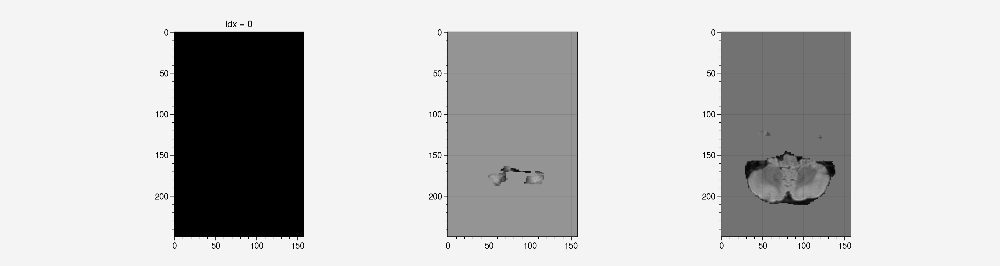

In [148]:
for idx in range(len(means)):
    try:
        plt.figure(figsize=(15, 4))
        plt.subplot(1,3,1)
        islice = 23
        print(xs3d_test[idx][0].shape, pv_region_masks[idx].shape)
        plt.imshow(xs3d_test[idx][0][islice], cmap='gray')
        plt.imshow(pv_region_masks[idx][islice], cmap='gray', alpha=0.3)
        plt.title(f"idx = {idx}")
        plt.subplot(1,3,2)
        islice = 28
        plt.imshow(xs3d_test[idx][0][islice], cmap='gray')
        plt.imshow(pv_region_masks[idx][islice], cmap='gray', alpha=0.3)
        plt.subplot(1,3,3)
        islice = 34
        plt.imshow(xs3d_test[idx][0][islice], cmap='gray')
        plt.imshow(pv_region_masks[idx][islice], cmap='gray', alpha=0.3)
        plt.show()
        # o = input()
        # if o == "end":
        #     break
        break
    except:
        print(f"failed for {idx}")

### dodgy looking scans for the pv region that I need to investigate....

for mss3 dataset
4

for LBC dataset
8, 7, 4


In [57]:
import cc3d

In [58]:
def find_non_overlapping_ccs(ccs_y0, y1):
    no_overlap_ccs = []
    ccs_size = []
    no_overlap_ccs_img = torch.zeros(y1.shape, device=y1.device, dtype=y1.dtype)
    
    for cc_id in ccs_y0.unique():
        if cc_id == 0:
            continue
        cc = ccs_y0 == cc_id
        if (cc * y1).sum() == 0:
            no_overlap_ccs.append(int(cc_id.item()))
            ccs_size.append(cc.sum().item())
            no_overlap_ccs_img += cc
    
    return no_overlap_ccs, ccs_size, no_overlap_ccs_img

In [59]:
def remove_ccids_with_0IOU(ccs_y0, ccs_y1, y0, y1):
    y0_ccids = ccs_y0.unique().type(torch.int32).tolist()
    y1_ccids = ccs_y1.unique().type(torch.int32).tolist()
    y0_ccids.remove(0)
    y1_ccids.remove(0)
    zero_overlap_y0 = []
    zero_overlap_y1 = []
    for cc_id in y0_ccids:
        cc = ccs_y0 == cc_id
        if (cc * y1).sum() == 0:
            zero_overlap_y0.append(cc_id)
    for cc_id in y1_ccids:
        if cc_id == 0:
            continue
        cc = ccs_y1 == cc_id
        if (cc * y0).sum() == 0:
            zero_overlap_y1.append(cc_id)
    for cc_id in zero_overlap_y0:
        y0_ccids.remove(cc_id)
    for cc_id in zero_overlap_y1:
        y1_ccids.remove(cc_id)
        
    return y0_ccids, y1_ccids

def find_ious_between_raters(ccs_y0, ccs_y1, y0, y1):
    
    # first narrow down the list to all the connected components that do not have zero overlap
    y0_ccids, y1_ccids = remove_ccids_with_0IOU(ccs_y0, ccs_y1, y0, y1)
    
    # loop through ccs to find the one with the highest iou
    cc_ious = []
    ccs_y1_match = []
    sizes = []
    match_sizes = []
    for cc_id0 in y0_ccids:
        cc0 = ccs_y0 == cc_id0
        cc0_sum = cc0.sum().item()
        best_iou = 0
        best_iou_cc_id = None
        match_size = None
        for cc_id1 in y1_ccids:
            cc1 = ccs_y1 == cc_id1
            iou = (cc0 & cc1).sum() / ((cc1 + cc0) > 0).sum()
            iou = iou.item()
            if iou >= best_iou:
                best_iou = iou
                best_iou_cc_id = cc_id1
                match_size = cc1.sum().item()
        # print(best_iou_cc_id)
        # y1_ccids.remove(best_iou_cc_id)
        cc_ious.append(best_iou)
        ccs_y1_match.append(best_iou_cc_id)
        sizes.append(cc0_sum)
        match_sizes.append(match_size)
        
    return cc_ious, y0_ccids, ccs_y1_match, sizes, match_sizes
            

In [60]:
def create_overlap_image(y0_cc_ids, y1_cc_ids, y0_ccs, y1_ccs):
    overlap_ccs_img = torch.zeros(y1_ccs.shape, device=y1_ccs.device, dtype=y1_ccs.dtype)
    for cc_id in y0_cc_ids:
        cc = y0_ccs == cc_id
        overlap_ccs_img[cc] = 1
    if y1_cc_ids is not None:
        for cc_id in y1_cc_ids:
            cc = y1_ccs == cc_id
            overlap_ccs_img[cc] = 1
        
    return overlap_ccs_img

In [61]:
from scipy.ndimage import distance_transform_edt
import SimpleITK as sitk
from twaidata.MRI_preprep.resample import get_resampled_img

def get_distance_map(img, rescale_ratio=3):
    
    # resample to 1x1x1 space
    device = img.device
    img = img.type(torch.float32)
    img = torch.nn.functional.interpolate(img.unsqueeze(0).unsqueeze(0), size=None, scale_factor=(rescale_ratio, 1, 1), mode='nearest', align_corners=None, recompute_scale_factor=None, antialias=False)
    img = img.squeeze().cpu().numpy()
    
    # compute distance map
    distance_map = distance_transform_edt(1 - img)
    
    # resample back to original space
    distance_map = torch.from_numpy(distance_map).to(device)
    distance_map = torch.nn.functional.interpolate(distance_map.unsqueeze(0).unsqueeze(0), size=None, scale_factor=(1/rescale_ratio, 1, 1), mode='trilinear', align_corners=None, recompute_scale_factor=None, antialias=False)
    distance_map = distance_map.squeeze()
    
    return distance_map


# ### UIRO per region analysis.

# no_overlap_distance_map = get_distance_map(combined_no_overlap_image)
# low_overlap_distance_map = get_distance_map(combined_low_overlap_diff_image)
# high_overlap_distance_map = get_distance_map(combined_high_overlap_diff_image)

### split it into pv and deep


## do whole image UIRO and JUEO in pv region and deep region. that can go along with the other analysis. Nice.

In [62]:
def IOU_region_UIRO(ent, rater_diff, no_overlap_distance_map, low_overlap_distance_map, high_overlap_distance_map):
        uiro_no_overlap = []
        uiro_low_overlap = []
        uiro_high_overlap = []
        
        d = 5
        no_exclusion_region = (no_overlap_distance_map < d) * (low_overlap_distance_map > d) * (high_overlap_distance_map > d)
        low_exclusion_region = (no_overlap_distance_map > d) * (low_overlap_distance_map < d) * (high_overlap_distance_map > d)
        high_exclusion_region = (no_overlap_distance_map > d) * (low_overlap_distance_map > d) * (high_overlap_distance_map < d)
        
        for t in uncertainty_thresholds:
            e = ent > t
            uiro_no_overlap.append(fast_dice(e * no_exclusion_region, rater_diff * no_exclusion_region))
            uiro_low_overlap.append(fast_dice(e * low_exclusion_region, rater_diff * low_exclusion_region))
            uiro_high_overlap.append(fast_dice(e * high_exclusion_region, rater_diff * high_exclusion_region))
        
        
        return uiro_no_overlap, uiro_low_overlap, uiro_high_overlap

## run cc analysis across the whole image

In [154]:
all_sizes = []
all_ious = []
all_match_sizes = []
IOU0_ccs_sizes = []

ent_no_overlap_all, ent_low_overlap_all, ent_high_overlap_all, ent_exact_overlap_all = [], [], [], []

none_prop_uncert_all = [[] for _ in range(len(uncertainty_thresholds))]
low_prop_uncert_all = [[] for _ in range(len(uncertainty_thresholds))]
high_prop_uncert_all = [[] for _ in range(len(uncertainty_thresholds))]
exact_prop_uncert_all = [[] for _ in range(len(uncertainty_thresholds))]
non_useful_ccs_all = [[] for _ in range(len(uncertainty_thresholds))]

num_FP_uncertainty_ccs_all = []
mean_size_FP_uncertainty_ccs_all = []

none_cc_mean = []
low_cc_mean = []
high_cc_mean = []
exact_cc_mean = []

uiro_no_overlap_all = []
uiro_low_overlap_all = []
uiro_high_overlap_all = []

for i in tqdm(range(len(means))):
    x = xs3d_test[i].cuda()
    pred = means[i].cuda().argmax(dim=1)
    e = ent_maps[i].cuda()
    y0 = rater0[i]
    y1 = rater1[i]
    
    ccs_y0 = cc3d.connected_components(y0.type(torch.int32).numpy(), connectivity=26) # 26-connected
    ccs_y0 = torch.from_numpy(ccs_y0.astype(np.float32)).cuda()
    
    ccs_y1 = cc3d.connected_components(y1.type(torch.int32).numpy(), connectivity=26) # 26-connected
    ccs_y1 = torch.from_numpy(ccs_y1.astype(np.float32)).cuda()
    
    y0 = y0.cuda()
    y1 = y1.cuda()
    
    diff_image = (y0 + y1) == 1
    any_prediction_image = (pred + y0 + y1) > 0 # anywhere where either the model or the raters predict
    
    
    # find type 1: connected components in either map with no overlap
    no_overlap_ccs_y0, no_overlap_ccs_size_y0, no_overlap_ccs_img_y0 = find_non_overlapping_ccs(ccs_y0, y1)
    no_overlap_ccs_y1, no_overlap_ccs_size_y1, no_overlap_ccs_img_y1 = find_non_overlapping_ccs(ccs_y1, y0)
    IOU0_ccs_sizes.extend(no_overlap_ccs_size_y0 + no_overlap_ccs_size_y1)
    combined_no_overlap_image = (no_overlap_ccs_img_y0 + no_overlap_ccs_img_y1).type(torch.int)
    
    # get information on the IOU of connected components between rater 0 and rater 1 where the IOU > 0
    ious, y0_ccids, y1_ccid_matches, sizes, match_sizes = find_ious_between_raters(ccs_y0, ccs_y1, y0, y1)
    all_ious.append(ious)
    all_sizes.append(sizes)
    all_match_sizes.append(match_sizes)
    
    ious = torch.Tensor(ious)
    y0_ccids = torch.Tensor(y0_ccids)
    y1_ccid_matches = torch.Tensor(y1_ccid_matches)
    
    # find type 2: areas where connected components have a poor overlap IOU of 0.5 and below but not 0.
    # IOU of zero ccs have already been discounted in the previous step.
    low_ious = ious < 0.5
    low_IOU_y0_ccs = y0_ccids[low_ious]
    low_IOU_y1_ccs = y1_ccid_matches[low_ious]
    low_IOU_y1_ccs = torch.unique(low_IOU_y1_ccs)
    combined_low_overlap_image = create_overlap_image(low_IOU_y0_ccs, low_IOU_y1_ccs, ccs_y0, ccs_y1).type(torch.int)
    combined_low_overlap_diff_image = combined_low_overlap_image * diff_image
    
    # find type 3: high overlap
    high_ious = (ious >= 0.5) * (ious < 1)
    high_IOU_y0_ccs = y0_ccids[high_ious]
    high_IOU_y1_ccs = y1_ccid_matches[high_ious]
    high_IOU_y1_ccs = torch.unique(high_IOU_y1_ccs)
    combined_high_overlap_image = create_overlap_image(high_IOU_y0_ccs, high_IOU_y1_ccs, ccs_y0, ccs_y1).type(torch.int)
    combined_high_overlap_diff_image = combined_high_overlap_image * diff_image
    
    # find type 4: areas of exact overlap
    exact_ious = ious == 1
    exact_IOU_y0_ccs = y0_ccids[exact_ious]
    exact_IOU_y1_ccs = y1_ccid_matches[exact_ious]
    exact_IOU_y1_ccs = torch.unique(exact_IOU_y1_ccs)
    combined_exact_overlap_image = create_overlap_image(exact_IOU_y0_ccs, None, ccs_y0, ccs_y1).type(torch.int)
    
    # then get the areas where the raters agree and remove those areas. see what we are left with...
    # that is the joint uncertainty error overlap... but I want to look at the overlap away from the boundaries....
    
    # my concern is that we still have all of this edge information.
    
    # ANALYSIS 1 cc average uncertainty information
    # we need average uncertainty per connected component in the following regions
    # - IR IOU 0
    # - IR IOU 1
    # - diff of IR 0 < IOU < 0.5 regions
    # - diff of IR 0.5 <= IOU < 1 regions
    
    # ANALYSIS 1.5 pixel wise information
    # the same as analysis 1 but with individual voxels
    ef = e.flatten()
    ent_no_overlap, ent_low_overlap, ent_high_overlap, ent_exact_overlap = ef[combined_no_overlap_image.flatten()==1], ef[combined_low_overlap_diff_image.flatten()==1], ef[combined_high_overlap_diff_image.flatten()==1], ef[combined_exact_overlap_image.flatten()==1]
    ent_no_overlap_all.extend(ent_no_overlap.cpu())
    ent_low_overlap_all.extend(ent_low_overlap.cpu())
    ent_high_overlap_all.extend(ent_high_overlap.cpu())
    ent_exact_overlap_all.extend(ent_exact_overlap.cpu())
    
    
    # Analysis 2 connected component extra analysis
    # as the uncertainty threshold increases we look at:
    # average proportion of IR IOU 0 that are uncertain
    # average proportion of IR low IOU that are uncertain
    # average proportion of IR IOU high that are uncertain
    # average proportion of IR IOU 1 that are uncertain
    # number of connected components in uncertainty map that have zero overlap with either rater. I should do this for a fewer number of connected components
    none_prop_uncert = [[] for _ in range(len(uncertainty_thresholds))]
    low_prop_uncert = [[] for _ in range(len(uncertainty_thresholds))]
    high_prop_uncert = [[] for _ in range(len(uncertainty_thresholds))]
    exact_prop_uncert = [[] for _ in range(len(uncertainty_thresholds))]
    non_useful_ccs = [[] for _ in range(len(uncertainty_thresholds))]
    num_FP_uncertainty_ccs = []
    mean_size_FP_uncertainty_ccs = []
    
    ccs_none = torch.from_numpy(cc3d.connected_components(combined_no_overlap_image.type(torch.int32).cpu().numpy(), connectivity=26).astype(np.float32)).cuda()
    ccs_low = torch.from_numpy(cc3d.connected_components(combined_low_overlap_diff_image.type(torch.int32).cpu().numpy(), connectivity=26).astype(np.float32)).cuda()
    ccs_high = torch.from_numpy(cc3d.connected_components(combined_high_overlap_diff_image.type(torch.int32).cpu().numpy(), connectivity=26).astype(np.float32)).cuda()
    ccs_exact = torch.from_numpy(cc3d.connected_components(combined_exact_overlap_image.type(torch.int32).cpu().numpy(), connectivity=26).astype(np.float32)).cuda()
    
    any_prediction_image_dist_map = get_distance_map(any_prediction_image)
    any_prediction_image_dist_map = any_prediction_image_dist_map > 5 # 
    
    # print(ccs_none.unique())
    # print(combined_no_overlap_image.sum())
    for ti, t in enumerate(uncertainty_thresholds):
        et = (e > t).type(torch.float32)
        
        # look at how many ccs there are
        non_overlapping_uncert_region = et * any_prediction_image_dist_map
        non_overlapping_uncert_ccs = torch.from_numpy(cc3d.connected_components(non_overlapping_uncert_region.type(torch.int32).cpu().numpy(), connectivity=26).astype(np.float32)).cuda()
        num_FP_uncertainty_ccs.append(len(non_overlapping_uncert_ccs.unique()) - 1) # -1 to get rid of background class
        mean_size_FP_uncertainty_ccs.append(
            torch.Tensor(
                [(non_overlapping_uncert_ccs == cc).sum().item() for cc in non_overlapping_uncert_ccs.unique() if cc != 0]
            ).mean()
        )
        
        # find proportion uncertain of each cc in each region
        for cc_id in ccs_none.unique():
            if cc_id == 0:
                continue
            cc = ccs_none == cc_id
            # print(cc_id)
            # print(cc.sum())
            none_prop_uncert_all[ti].append(et[cc==1].mean().item())
            if ti == 0:
                none_cc_mean.append(e[cc==1].mean())
        for cc_id in ccs_low.unique():
            if cc_id == 0:
                continue
            cc = ccs_low == cc_id
            low_prop_uncert_all[ti].append(et[cc==1].mean().item())
            if ti == 0:
                low_cc_mean.append(e[cc==1].mean())
        for cc_id in ccs_high.unique():
            if cc_id == 0:
                continue
            cc = ccs_high == cc_id
            high_prop_uncert_all[ti].append(et[cc==1].mean().item())
            if ti == 0:
                high_cc_mean.append(e[cc==1].mean())
        for cc_id in ccs_exact.unique():
            if cc_id == 0:
                continue
            cc = ccs_exact == cc_id
            exact_prop_uncert_all[ti].append(et[cc==1].mean().item())
            if ti == 0:
                exact_cc_mean.append(e[cc==1].mean())
                
    num_FP_uncertainty_ccs_all.append(num_FP_uncertainty_ccs)
    mean_size_FP_uncertainty_ccs_all.append(mean_size_FP_uncertainty_ccs)
                
    ### UIRO per region analysis.
    no_overlap_distance_map = get_distance_map(combined_no_overlap_image)
    low_overlap_distance_map = get_distance_map(combined_low_overlap_diff_image)
    high_overlap_distance_map = get_distance_map(combined_high_overlap_diff_image)
    uiro_no_overlap, uiro_low_overlap, uiro_high_overlap = IOU_region_UIRO(e, diff_image, no_overlap_distance_map, low_overlap_distance_map, high_overlap_distance_map)
    uiro_no_overlap_all.append(uiro_no_overlap)
    uiro_low_overlap_all.append(uiro_low_overlap)
    uiro_high_overlap_all.append(uiro_high_overlap)
    
    break
                
    

  0%|                                                                                                                                                                                                                  | 0/10 [00:11<?, ?it/s]


#### looking at euclidian distance around the JUEO, UIRO map and producing some plots to visualize what is going on. Nice.

In [127]:
y0.shape, y1.shape, e.shape, pred.shape

(torch.Size([48, 256, 256]),
 torch.Size([48, 256, 256]),
 torch.Size([48, 256, 256]),
 torch.Size([48, 256, 256]))

In [128]:
ir = (y0 != y1)
me = (y0 == y1) * (y0 != pred)

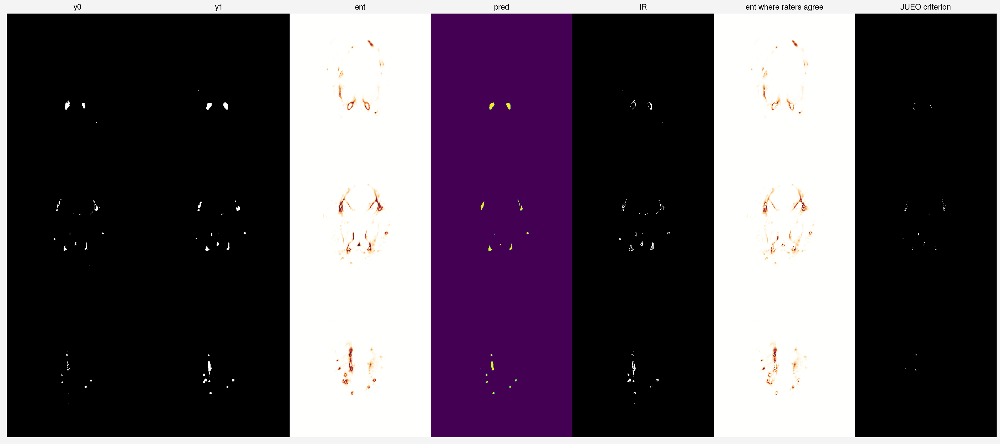

In [129]:
islices = [20, 25, 32]
fig = pplt.figure(space=0, refwidth='20em')
axs = fig.subplots(nrows=3, ncols=7)
count = 0
first_row=True
for islice in islices:
    axs[count].imshow(y0.cpu()[islice], cmap='gray')
    axs[count].set_title("y0" if first_row else "")
    axs[count+1].imshow(y1.cpu()[islice], cmap='gray')
    axs[count+1].set_title("y1" if first_row else "")
    axs[count+2].imshow(e.cpu()[islice])
    axs[count+2].set_title("ent" if first_row else "")
    axs[count+3].imshow(pred.cpu()[islice], cmap='viridis')
    axs[count+3].set_title("pred" if first_row else "")
    axs[count+4].imshow(ir.cpu()[islice], cmap='gray')
    axs[count+4].set_title("IR" if first_row else "")
    axs[count+5].imshow((e * (y0 == y1)).cpu()[islice])
    axs[count+5].set_title("ent where raters agree" if first_row else "")
    axs[count+6].imshow(((y0 == y1) * (pred != y0)).cpu()[islice], cmap='gray')
    axs[count+6].set_title("JUEO criterion" if first_row else "")
    count += 7
    first_row=False
    
axs.format(grid=False, xlocator='null', ylocator='null')
for ax in axs:
    for spine in ax.spines:
        ax.spines[spine].set_color('none')

In [130]:
ir_distance_map = get_distance_map(ir)
me_distance_map = get_distance_map(me)

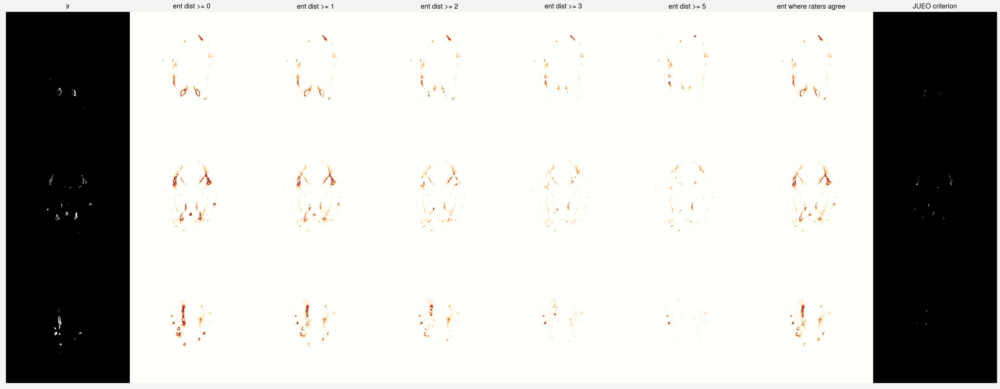

In [131]:
islices = [20, 25, 32]
fig = pplt.figure(space=0, refwidth='20em')
axs = fig.subplots(nrows=3, ncols=8)
count = 0
first_row=True
for islice in islices:
    axs[count].imshow(ir.cpu()[islice], cmap='gray')
    axs[count].set_title("ir" if first_row else "")
    axs[count+1].imshow(e.cpu()[islice])
    axs[count+1].set_title("ent dist >= 0" if first_row else "")
    axs[count+2].imshow((e * (ir_distance_map >=1)).cpu()[islice])
    axs[count+2].set_title("ent dist >= 1" if first_row else "")
    axs[count+3].imshow((e * (ir_distance_map >=2)).cpu()[islice])
    axs[count+3].set_title("ent dist >= 2" if first_row else "")
    axs[count+4].imshow((e * (ir_distance_map >=3)).cpu()[islice])
    axs[count+4].set_title("ent dist >= 3" if first_row else "")
    axs[count+5].imshow((e * (ir_distance_map >=5)).cpu()[islice])
    axs[count+5].set_title("ent dist >= 5" if first_row else "")
    axs[count+6].imshow((e * (y0 == y1)).cpu()[islice])
    axs[count+6].set_title("ent where raters agree" if first_row else "")
    axs[count+7].imshow(((y0 == y1) * (pred != y0)).cpu()[islice], cmap='gray')
    axs[count+7].set_title("JUEO criterion" if first_row else "")
    count += 8
    first_row=False
    
axs.format(grid=False, xlocator='null', ylocator='null')
for ax in axs:
    for spine in ax.spines:
        ax.spines[spine].set_color('none')

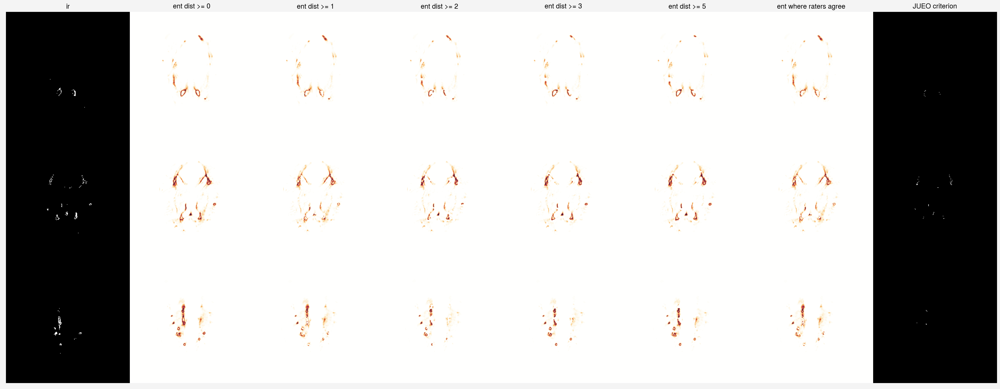

In [132]:
# okay so for JUEO, i need to exclude uncertainty within 5mm of the IR region except where it is within 5mm of the JUEO region.
# so that is IR > 5 logical or me <= 5
criterion = lambda d : torch.logical_or(ir_distance_map >= d, me_distance_map < d)
islices = [20, 25, 32]
fig = pplt.figure(space=0, refwidth='20em')
axs = fig.subplots(nrows=3, ncols=8)
count = 0
first_row=True
for islice in islices:
    axs[count].imshow(ir.cpu()[islice], cmap='gray')
    axs[count].set_title("ir" if first_row else "")
    axs[count+1].imshow(e.cpu()[islice])
    axs[count+1].set_title("ent dist >= 0" if first_row else "")
    axs[count+2].imshow((e * criterion(1)).cpu()[islice])
    axs[count+2].set_title("ent dist >= 1" if first_row else "")
    axs[count+3].imshow((e * criterion(3)).cpu()[islice])
    axs[count+3].set_title("ent dist >= 2" if first_row else "")
    axs[count+4].imshow((e * criterion(4)).cpu()[islice])
    axs[count+4].set_title("ent dist >= 3" if first_row else "")
    axs[count+5].imshow((e * criterion(5)).cpu()[islice])
    axs[count+5].set_title("ent dist >= 5" if first_row else "")
    axs[count+6].imshow((e * (y0 == y1)).cpu()[islice])
    axs[count+6].set_title("ent where raters agree" if first_row else "")
    axs[count+7].imshow(((y0 == y1) * (pred != y0)).cpu()[islice], cmap='gray')
    axs[count+7].set_title("JUEO criterion" if first_row else "")
    count += 8
    first_row=False
    
axs.format(grid=False, xlocator='null', ylocator='null')
for ax in axs:
    for spine in ax.spines:
        ax.spines[spine].set_color('none')

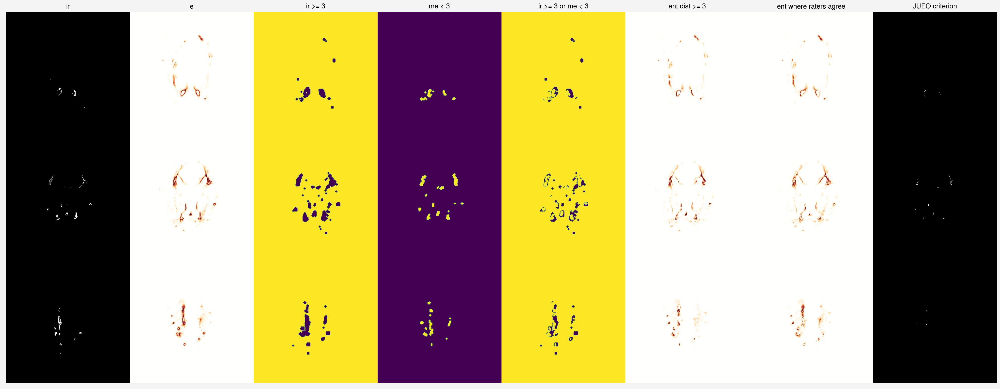

In [133]:
criterion = lambda d : torch.logical_or(ir_distance_map >= d, me_distance_map < d)
islices = [20, 25, 32]
fig = pplt.figure(space=0, refwidth='20em')
axs = fig.subplots(nrows=3, ncols=8)
count = 0
first_row=True
for islice in islices:
    axs[count].imshow(ir.cpu()[islice], cmap='gray')
    axs[count].set_title("ir" if first_row else "")
    axs[count+1].imshow(e.cpu()[islice])
    axs[count+1].set_title("e" if first_row else "")
    axs[count+2].imshow(1*(ir_distance_map >= 3).cpu()[islice], cmap='viridis')
    axs[count+2].set_title("ir >= 3" if first_row else "")
    axs[count+3].imshow(1*(me_distance_map < 3).cpu()[islice], cmap='viridis')
    axs[count+3].set_title("me < 3" if first_row else "")
    axs[count+4].imshow(1*(criterion(3)).cpu()[islice], cmap='viridis')
    axs[count+4].set_title("ir >= 3 or me < 3" if first_row else "")
    axs[count+5].imshow((e * criterion(3)).cpu()[islice])
    axs[count+5].set_title("ent dist >= 3" if first_row else "")
    axs[count+6].imshow((e * (y0 == y1)).cpu()[islice])
    axs[count+6].set_title("ent where raters agree" if first_row else "")
    axs[count+7].imshow(((y0 == y1) * (pred != y0)).cpu()[islice], cmap='gray')
    axs[count+7].set_title("JUEO criterion" if first_row else "")
    count += 8
    first_row=False
    
axs.format(grid=False, xlocator='null', ylocator='null')
for ax in axs:
    for spine in ax.spines:
        ax.spines[spine].set_color('none')

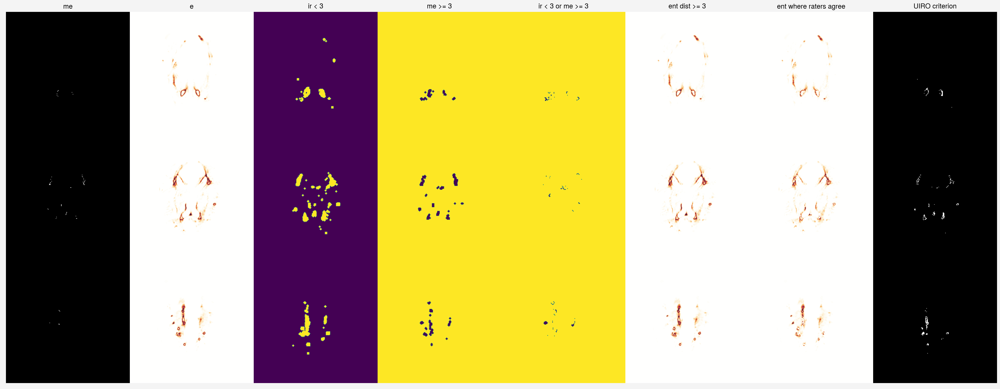

In [134]:
criterion_uiro = lambda d : torch.logical_or(ir_distance_map < d, me_distance_map >= d)
islices = [20, 25, 32]
fig = pplt.figure(space=0, refwidth='20em')
axs = fig.subplots(nrows=3, ncols=8)
count = 0
first_row=True
for islice in islices:
    axs[count].imshow(me.cpu()[islice], cmap='gray')
    axs[count].set_title("me" if first_row else "")
    axs[count+1].imshow(e.cpu()[islice])
    axs[count+1].set_title("e" if first_row else "")
    axs[count+2].imshow(1*(ir_distance_map < 3).cpu()[islice], cmap='viridis')
    axs[count+2].set_title("ir < 3" if first_row else "")
    axs[count+3].imshow(1*(me_distance_map >= 3).cpu()[islice], cmap='viridis')
    axs[count+3].set_title("me >= 3" if first_row else "")
    axs[count+4].imshow(1*(criterion_uiro(3)).cpu()[islice], cmap='viridis')
    axs[count+4].set_title("ir < 3 or me >= 3" if first_row else "")
    axs[count+5].imshow((e * criterion_uiro(3)).cpu()[islice])
    axs[count+5].set_title("ent dist >= 3" if first_row else "")
    axs[count+6].imshow((e * (y0 == y1)).cpu()[islice])
    axs[count+6].set_title("ent where raters agree" if first_row else "")
    axs[count+7].imshow(((y0 != y1)).cpu()[islice], cmap='gray')
    axs[count+7].set_title("UIRO criterion" if first_row else "")
    count += 8
    first_row=False
    
axs.format(grid=False, xlocator='null', ylocator='null')
for ax in axs:
    for spine in ax.spines:
        ax.spines[spine].set_color('none')

In [139]:
# def soft_dUIRO(pred, umap, seg1, seg2):
#     IR = (seg1 != seg2)
#     error = (seg1 == seg2) * (seg1 != pred)
#     umap[error] = 0
#     return soft_dice(umap, IR)


# def soft_dJUEO(pred, umap, seg1, seg2):
#     IR = (seg1 != seg2)
#     error = (seg1 == seg2) * (seg1 != pred)
#     umap[IR] = 0
#     return soft_dice(umap, error)


# def dUIRO(pred, thresholded_umap, seg1, seg2):
#     IR = (seg1 != seg2)
#     error = (seg1 == seg2) * (seg1 != pred)
#     thresholded_umap[error] = 0
#     return fast_dice(thresholded_umap, IR)


# def dJUEO(pred, thresholded_umap, seg1, seg2):
#     IR = (seg1 != seg2)
#     error = (seg1 == seg2) * (seg1 != pred)
#     thresholded_umap[IR] = 0
#     return fast_dice(thresholded_umap, error)

# now I need to compute these metrics for a bunch of d_thresholds..... hmm tricky.

# ir = (seg1 != seg2)
# me = (seg1 == seg2) * (seg1 != pred)

def dJUEO(pred, thresholded_umap, IR, IR_distmap, ME, ME_distmap, d_threshold):
    
    dthresholded_umap = thresholded_umap * torch.logical_or(IR_distmap >= d_threshold, ME_distmap < d_threshold)
    
    return fast_dice(dthresholded_umap, ME)

def dUIRO(pred, thresholded_umap, IR, IR_distmap, ME, ME_distmap, d_threshold):
    
    dthresholded_umap = thresholded_umap * torch.logical_or(IR_distmap < d_threshold, ME_distmap >= d_threshold)
    
    return fast_dice(dthresholded_umap, IR)

def soft_dJUEO(pred, umap, IR, IR_distmap, ME, ME_distmap, d_threshold):
    
    dumap = umap * torch.logical_or(IR_distmap >= d_threshold, ME_distmap < d_threshold)
    
    return soft_dice(dumap, ME)

def soft_dUIRO(pred, umap, IR, IR_distmap, ME, ME_distmap, d_threshold):
    
    dumap = umap * torch.logical_or(IR_distmap < d_threshold, ME_distmap >= d_threshold)
    
    return soft_dice(dumap, IR)

def perform_d_UEO_analysis(pred, umap, seg1, seg2, uncertainty_thresholds):
    sdJUEOs = []
    sdUIROs = []
    dUIROs = []
    dJUEOs = []
    
    ir = (seg1 != seg2)
    ir_distmap = get_distance_map(ir)
    
    me = (seg1 == seg2) * (seg1 != pred)
    me_distmap = get_distance_map(me)
    
    # when d_threshold = 0.5, this is equivalent to just masking out the exact pixels.
    for d_threshold in tqdm([0.5, 1, 1.5, 2, 2.5, 3, 3.5, 4, 4.5, 5]):
        sdJUEOs.append(soft_dJUEO(pred, umap, ir, ir_distmap, me, me_distmap, d_threshold))
        sdUIROs.append(soft_dUIRO(pred, umap, ir, ir_distmap, me, me_distmap, d_threshold))
        UIRO = []
        JUEO = []
        for t in uncertainty_thresholds:
            tumap = umap > t
            JUEO.append(dJUEO(pred, tumap, ir, ir_distmap, me, me_distmap, d_threshold))
            UIRO.append(dUIRO(pred, tumap, ir, ir_distmap, me, me_distmap, d_threshold))
    
        dJUEOs.append(JUEO)
        dUIROs.append(UIRO)
        
    return sdJUEOs, sdUIROs, dJUEOs, dUIROs

In [155]:
soft_JUEO(pred, e.clone(), y0, y1), soft_UIRO(pred, e.clone(), y0, y1)

(0.3700982630252838, 0.4540240168571472)

In [156]:
sdJUEOs, sdUIROs, dJUEOs, dUIROs = perform_d_UEO_analysis(pred, e, y0, y1, uncertainty_thresholds)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00, 10.04it/s]


In [158]:
sdUIROs

[0.43564239144325256,
 0.4540240168571472,
 0.4540240168571472,
 0.44943925738334656,
 0.44943925738334656,
 0.44133999943733215,
 0.44057366251945496,
 0.4388987123966217,
 0.4385346472263336,
 0.4380418658256531,
 0.43787646293640137]

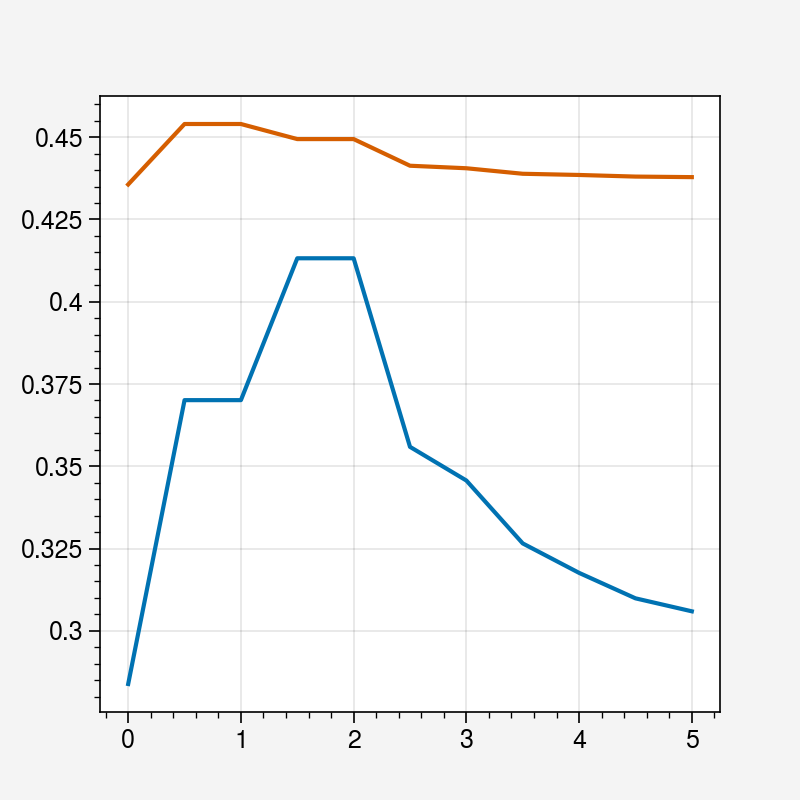

In [142]:
plt.plot([0, 0.5, 1, 1.5, 2, 2.5, 3, 3.5, 4, 4.5, 5], sdJUEOs)
plt.plot([0, 0.5, 1, 1.5, 2, 2.5, 3, 3.5, 4, 4.5, 5], sdUIROs)

0
1
2
3
4
5
6
7
8
9
10


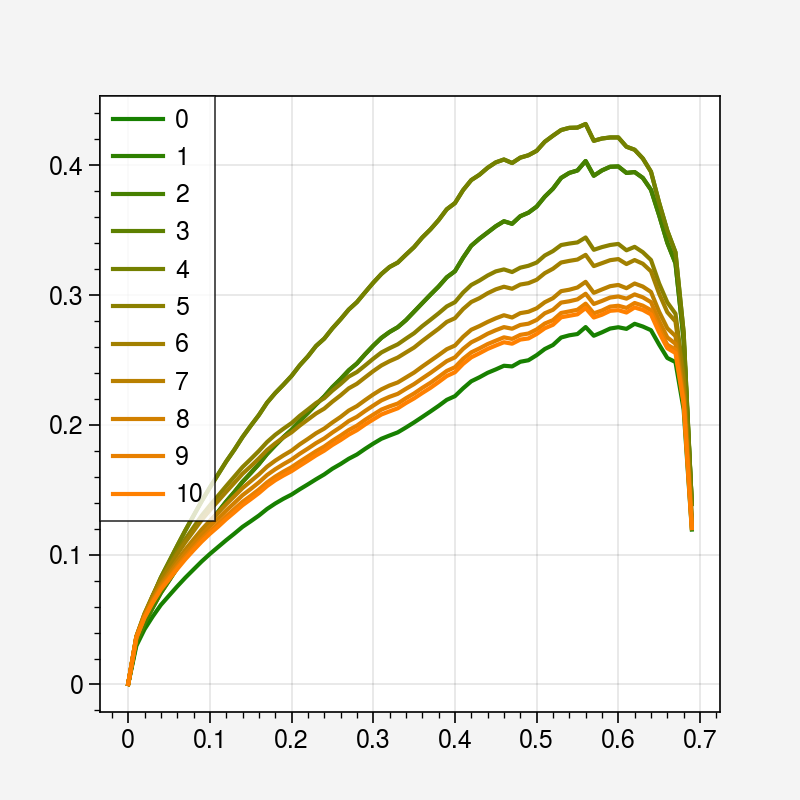

In [174]:
for i in range(len(dUIROs)):
    print(i)
    plt.plot(uncertainty_thresholds, dJUEOs[i], label=i, c=np.array([(1/11) * (i+1), 0.5, 0, 1]))
plt.legend()
    

#### the rest of the plots for this section

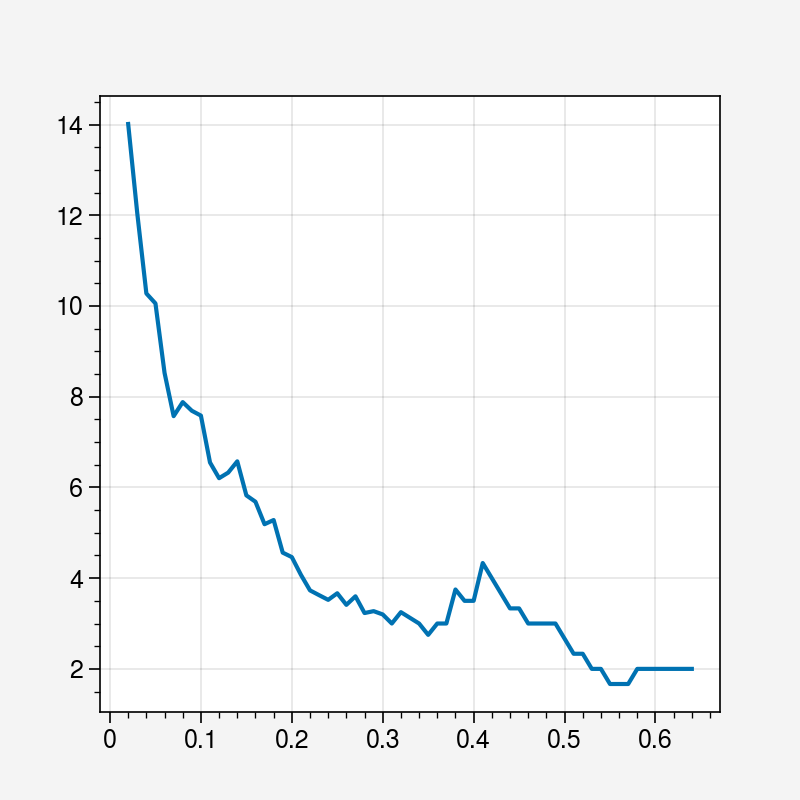

In [64]:
plt.plot(uncertainty_thresholds[2:], mean_size_FP_uncertainty_ccs[2:])

#### Note to self, perhaps a higher threshold would be better? Since the UEO is low, I htink a higher distance would push the UIRO back a bit...

In [65]:
uiro_no_overlap_all = torch.Tensor(uiro_no_overlap_all)
uiro_low_overlap_all = torch.Tensor(uiro_low_overlap_all)
uiro_high_overlap_all = torch.Tensor(uiro_high_overlap_all)

(0.0, 0.4)

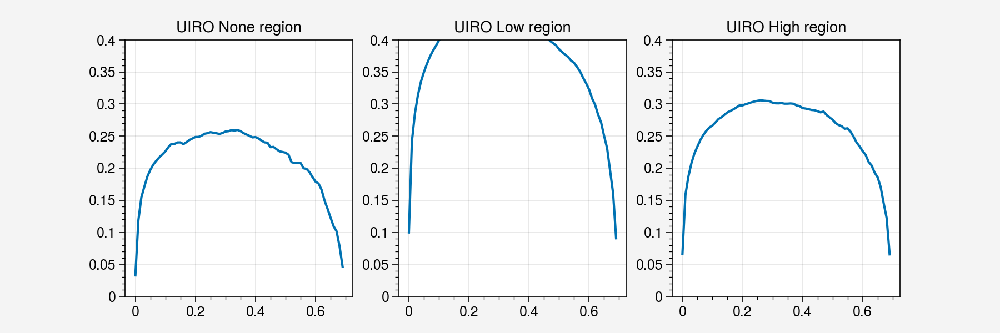

In [66]:
plt.figure(figsize=(9, 3))
plt.subplot(1,3,1)
plt.plot(uncertainty_thresholds, uiro_no_overlap_all.mean(dim=0))
plt.title("UIRO None region")
plt.ylim(0, 0.40)
plt.subplot(1,3,2)
plt.plot(uncertainty_thresholds, uiro_low_overlap_all.mean(dim=0))
plt.title("UIRO Low region")
plt.ylim(0, 0.40)
plt.subplot(1,3,3)
plt.plot(uncertainty_thresholds, uiro_high_overlap_all.mean(dim=0))
plt.title("UIRO High region")
plt.ylim(0, 0.40)

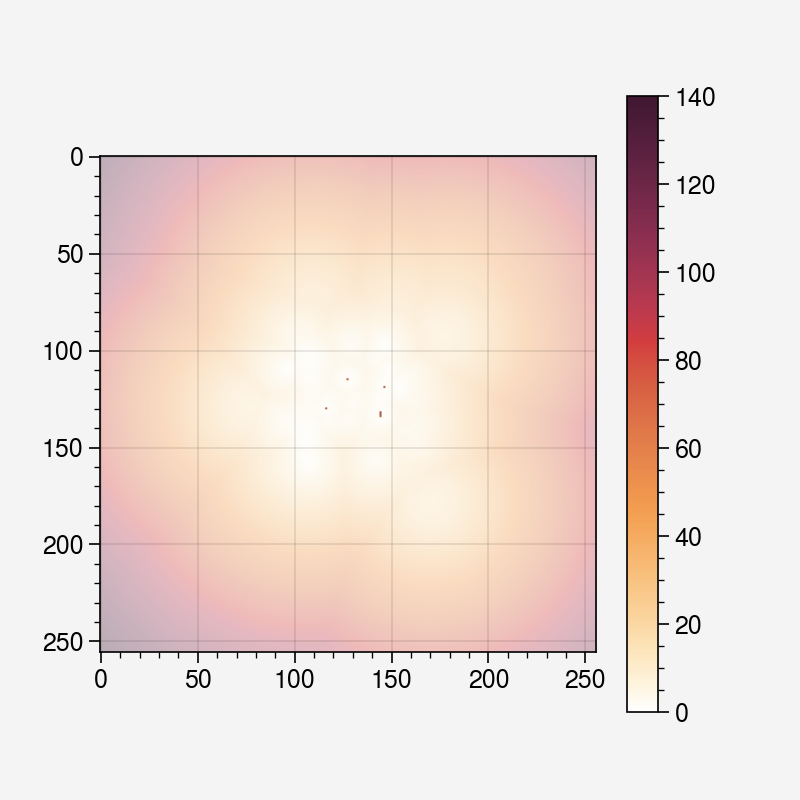

In [67]:
islice = 33
plt.imshow(no_overlap_distance_map[islice].cpu(), vmin=0, vmax=140)
plt.colorbar()
plt.imshow(no_overlap_distance_map[islice].cpu() < 0.3, alpha=0.3)
plt.imshow(combined_no_overlap_image[islice].cpu(), alpha=0.5)

#### Note:

we just get 5mm around each type in order to give a small boundary since the uncertianty may be thick there, we are not trying to capture false positive regions, that is done by the global UEO curve.

In [68]:
%autoreload

In [69]:
# the mean uncertainty of ccs as the uncertainty threshold increases
exact_prop_uncert2 = torch.Tensor(exact_prop_uncert_all)
high_prop_uncert2 = torch.Tensor(low_prop_uncert_all)
low_prop_uncert2 = torch.Tensor(high_prop_uncert_all)
none_prop_uncert2 = torch.Tensor(none_prop_uncert_all)

In [70]:
# the mean uncertainty of ccs in the unthresholded uncertainty map
none_cc_mean = torch.Tensor(none_cc_mean)
low_cc_mean = torch.Tensor(low_cc_mean)
high_cc_mean = torch.Tensor(high_cc_mean)
exact_cc_mean = torch.Tensor(exact_cc_mean)

In [71]:
# the uncertainty of voxels in the unthresholded uncertainty map
ent_no_overlap_all = torch.Tensor(ent_no_overlap_all)
ent_low_overlap_all = torch.Tensor(ent_low_overlap_all)
ent_high_overlap_all = torch.Tensor(ent_high_overlap_all)
ent_exact_overlap_all = torch.Tensor(ent_exact_overlap_all)

Text(0, 0.5, 'proportion uncertain of exact overlap ccs')

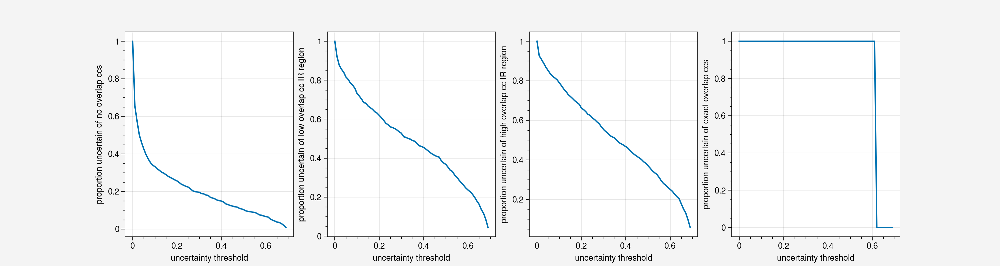

In [72]:
plt.figure(figsize=(15, 4))
plt.subplot(1,4,1)
plt.plot(uncertainty_thresholds, none_prop_uncert2.mean(dim=1))
plt.xlabel("uncertainty threshold")
plt.ylabel("proportion uncertain of no overlap ccs")
plt.subplot(1,4,2)
plt.plot(uncertainty_thresholds, low_prop_uncert2.mean(dim=1))
plt.xlabel("uncertainty threshold")
plt.ylabel("proportion uncertain of low overlap cc IR region")
plt.subplot(1,4,3)
plt.plot(uncertainty_thresholds, high_prop_uncert2.mean(dim=1))
plt.xlabel("uncertainty threshold")
plt.ylabel("proportion uncertain of high overlap cc IR region")
plt.subplot(1,4,4)
plt.plot(uncertainty_thresholds, exact_prop_uncert2.mean(dim=1))
plt.xlabel("uncertainty threshold")
plt.ylabel("proportion uncertain of exact overlap ccs")


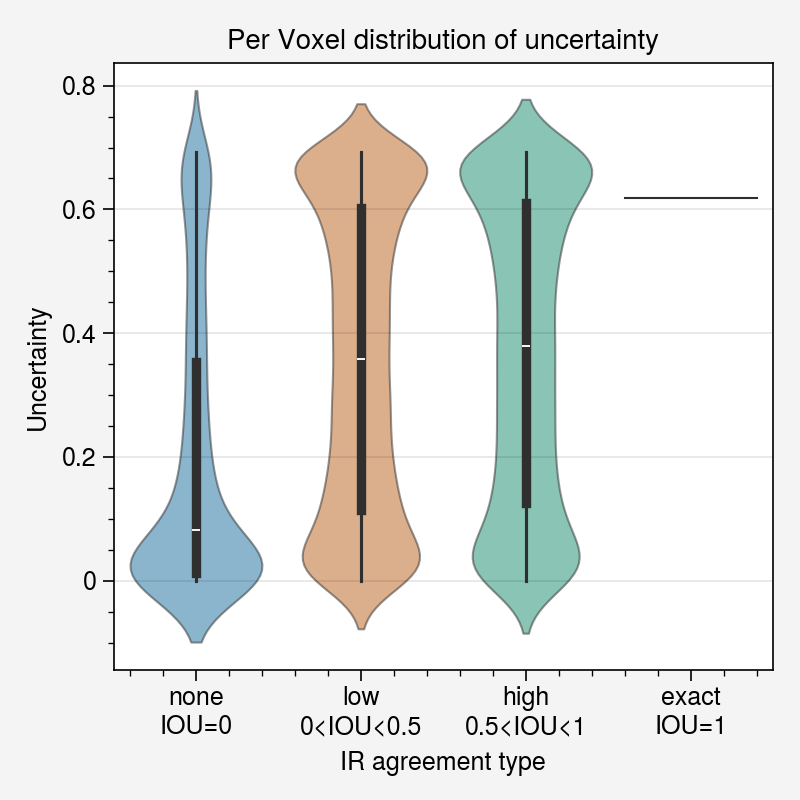

In [73]:
data = {"none\nIOU=0":ent_no_overlap_all.tolist(), "low\n0<IOU<0.5":ent_low_overlap_all.tolist(), "high\n0.5<IOU<1":ent_high_overlap_all.tolist(), "exact\nIOU=1":ent_exact_overlap_all.tolist()}
# ax = sns.boxplot(data, alpha=0.1)
sns.violinplot(data, alpha=0.5)
plt.xlabel("IR agreement type")
plt.ylabel("Uncertainty")
plt.title("Per Voxel distribution of uncertainty")
plt.tight_layout()

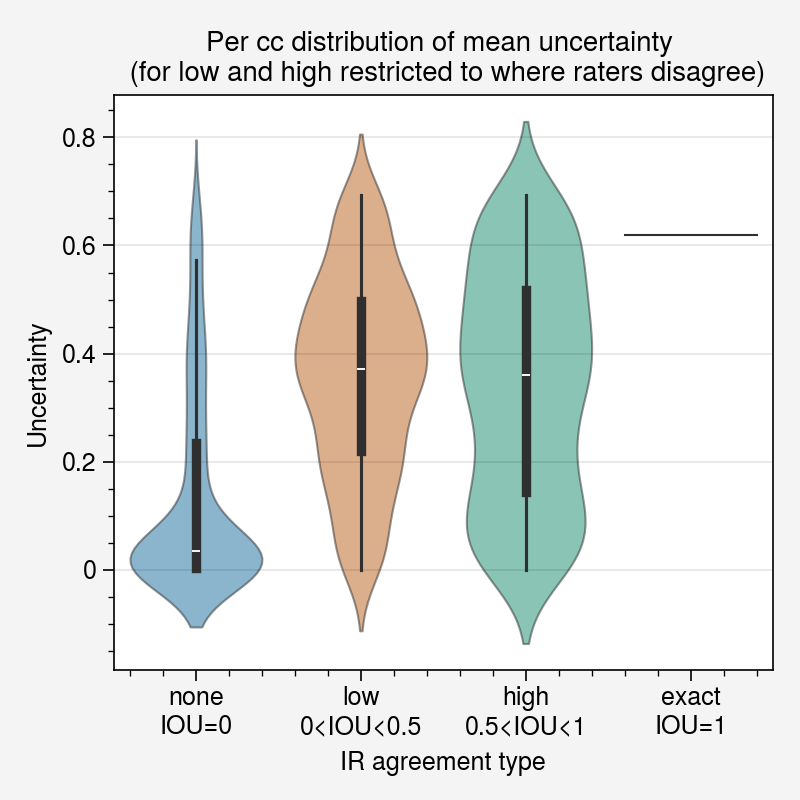

In [74]:
data = {"none\nIOU=0":none_cc_mean.tolist(), "low\n0<IOU<0.5":low_cc_mean.tolist(), "high\n0.5<IOU<1":high_cc_mean.tolist(), "exact\nIOU=1":exact_cc_mean.tolist()}
# ax = sns.boxplot(data, alpha=0.1)
sns.violinplot(data, alpha=0.5)
plt.xlabel("IR agreement type")
plt.ylabel("Uncertainty")
plt.title("Per cc distribution of mean uncertainty \n (for low and high restricted to where raters disagree)")
plt.tight_layout()

/home/s2208943/miniconda3/envs/wmh/lib/python3.8/site-packages/numpy/ma/core.py:467: RuntimeWarning: invalid value encountered in cast
  fill_value = np.array(fill_value, copy=False, dtype=ndtype)
/home/s2208943/miniconda3/envs/wmh/lib/python3.8/site-packages/numpy/ma/core.py:467: RuntimeWarning: invalid value encountered in cast
  fill_value = np.array(fill_value, copy=False, dtype=ndtype)
/home/s2208943/miniconda3/envs/wmh/lib/python3.8/site-packages/numpy/ma/core.py:467: RuntimeWarning: invalid value encountered in cast
  fill_value = np.array(fill_value, copy=False, dtype=ndtype)


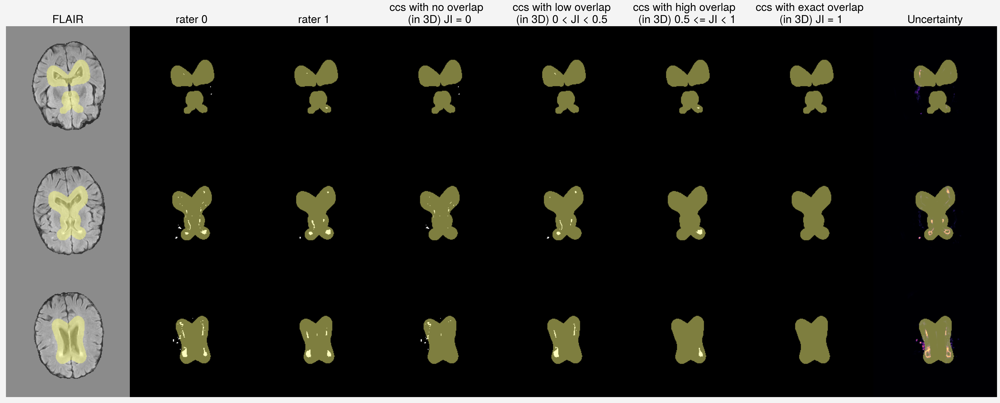

In [75]:
fig = pplt.figure(space=0, refwidth='20em')
axs = fig.subplots(nrows=3, ncols=8)

fontsize = 16

if ds_name == "challenge":
    sel_slices = [22, 24, 27]
    
elif ds_name == "lbc":
    sel_slices = [29, 31, 35]

elif ds_name == "mss3":
    sel_slices = [22, 27, 33]

for row, islice in enumerate(sel_slices):
    PV_region = pv_region_masks[i]
    PV_region_img = torch.ones([*PV_region.shape, 4])

    PV_region_img[:,:,:,2] = 0.5 # create a pastel yellow
    PV_region_img[:,:,:,3] = PV_region # set the rest of the voxels to have alpha of zero.

    
    b = 20
    axs[0 + row*8].imshow(x.cpu()[0, islice][b:-b, b:-b], cmap='gray', vmin=-3, vmax=2.5)
    axs[0 + row*8].imshow(PV_region_img[islice][b:-b, b:-b], alpha=0.5)
    if row == 0:
        axs[0 + row*8].set_title("FLAIR", fontsize=fontsize)
    axs[1 + row*8].imshow(y0.type(torch.float32).cpu()[islice][b:-b, b:-b], cmap='gray')
    axs[1 + row*8].imshow(PV_region_img[islice][b:-b, b:-b], alpha=0.5)
    if row == 0:
        axs[1 + row*8].set_title("rater 0", fontsize=fontsize)
    axs[2 + row*8].imshow(y1.cpu()[islice][b:-b, b:-b], cmap='gray')
    axs[2 + row*8].imshow(PV_region_img[islice][b:-b, b:-b], alpha=0.5)
    if row == 0:
        axs[2 + row*8].set_title("rater 1 ", fontsize=fontsize)
    axs[3 + row*8].imshow(combined_no_overlap_image.cpu()[islice][b:-b, b:-b], cmap='gray')
    axs[3 + row*8].imshow(PV_region_img[islice][b:-b, b:-b], alpha=0.5)
    if row == 0:
        axs[3 + row*8].set_title("ccs with no overlap  \n(in 3D) JI = 0", fontsize=fontsize)
    axs[4 + row*8].imshow(combined_low_overlap_image.cpu()[islice][b:-b, b:-b], cmap='gray')
    axs[4 + row*8].imshow(PV_region_img[islice][b:-b, b:-b], alpha=0.5)
    if row == 0:
        axs[4 + row*8].set_title("ccs with low overlap \n(in 3D) 0 < JI < 0.5 ", fontsize=fontsize)
    axs[5 + row*8].imshow(combined_high_overlap_image.cpu()[islice][b:-b, b:-b], cmap='gray')
    axs[5 + row*8].imshow(PV_region_img[islice][b:-b, b:-b], alpha=0.5)
    if row == 0:
        axs[5 + row*8].set_title("ccs with high overlap  \n(in 3D) 0.5 <= JI < 1", fontsize=fontsize)
    axs[6 + row*8].imshow(combined_exact_overlap_image.cpu()[islice][b:-b, b:-b], cmap='gray')
    axs[6 + row*8].imshow(PV_region_img[islice][b:-b, b:-b], alpha=0.5)
    if row == 0:
        axs[6 + row*8].set_title("ccs with exact overlap \n(in 3D) JI = 1", fontsize=fontsize)
    axs[7 + row*8].imshow(ent_maps[i].cpu()[islice][b:-b, b:-b], cmap='magma')
    axs[7 + row*8].imshow(PV_region_img[islice][b:-b, b:-b], alpha=0.5)
    if row == 0:
        axs[7 + row*8].set_title("Uncertainty", fontsize=fontsize)
    axs.format(grid=False, xlocator='null', ylocator='null')
    for ax in axs:
        for spine in ax.spines:
            ax.spines[spine].set_color('none')
        
fig.savefig(f"Example of overlap types under consideration {ds_name}.png", bbox_inches='tight', dpi=600)

/home/s2208943/miniconda3/envs/wmh/lib/python3.8/site-packages/numpy/ma/core.py:467: RuntimeWarning: invalid value encountered in cast
  fill_value = np.array(fill_value, copy=False, dtype=ndtype)


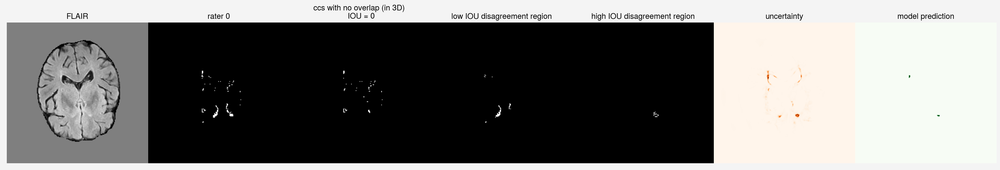

In [76]:
islice = 30
fig = pplt.figure(space=0, refwidth='20em')
axs = fig.subplots(nrows=1, ncols=7)
b = 20
axs[0].imshow(x.cpu()[0, islice][b:-b, b:-b], cmap='gray')
axs[0].set_title("FLAIR")
axs[1].imshow(y0.type(torch.float32).cpu()[islice][b:-b, b:-b], cmap='gray')
axs[1].set_title("rater 0")
axs[2].imshow(combined_no_overlap_image.cpu()[islice][b:-b, b:-b], cmap='gray')
axs[2].set_title("ccs with no overlap (in 3D) \n IOU = 0")
axs[3].imshow((diff_image * combined_low_overlap_image).cpu()[islice][b:-b, b:-b], cmap='gray')
axs[3].set_title("low IOU disagreement region")
axs[4].imshow((diff_image * combined_high_overlap_image).cpu()[islice][b:-b, b:-b], cmap='gray')

axs[4].set_title("high IOU disagreement region")
axs[5].imshow(ent_maps[i].cpu()[islice][b:-b, b:-b], cmap='Oranges')
axs[5].set_title("uncertainty")
axs[6].imshow(means[i][islice].argmax(dim=0).cpu()[b:-b, b:-b], cmap='Greens')
axs[6].set_title("model prediction")
axs.format(grid=False, xlocator='null', ylocator='null')
for ax in axs:
    for spine in ax.spines:
        ax.spines[spine].set_color('none')
        
# fig.savefig("Example of overlap and uncertainty.png", bbox_inches='tight', dpi=600)

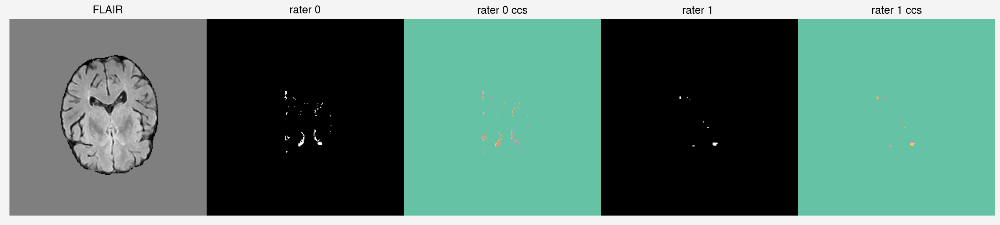

In [77]:
islice=30
fig = pplt.figure(space=0, refwidth='20em')
axs = fig.subplots(nrows=1, ncols=5)
axs[0].imshow(x.cpu()[0, islice], cmap='gray')
axs[0].set_title("FLAIR")
axs[1].imshow(y0.cpu()[islice], cmap='gray')
axs[1].set_title("rater 0")
axs[2].imshow(ccs_y0.cpu()[islice], cmap='Set2')
axs[2].set_title("rater 0 ccs")
axs[3].imshow(y1.cpu()[islice], cmap='gray')
axs[3].set_title("rater 1 ")
axs[4].imshow(ccs_y1.cpu()[islice], cmap='Set2')
axs[4].set_title("rater 1 ccs")
axs.format(grid=False, xlocator='null', ylocator='null')
for ax in axs:
    for spine in ax.spines:
        ax.spines[spine].set_color('none')

### urgent note to self, I cannot be sure that I have got the volumes right here and I need to check with Maria's volumes

In [78]:
all_ious = torch.cat([torch.Tensor(t) for t in all_ious])
all_sizes = torch.cat([torch.Tensor(t) for t in all_sizes])
all_match_sizes = torch.cat([torch.Tensor(t) for t in all_match_sizes])
IOU0_ccs_sizes = torch.Tensor(IOU0_ccs_sizes)

In [79]:
import seaborn as sns
from matplotlib.ticker import NullLocator

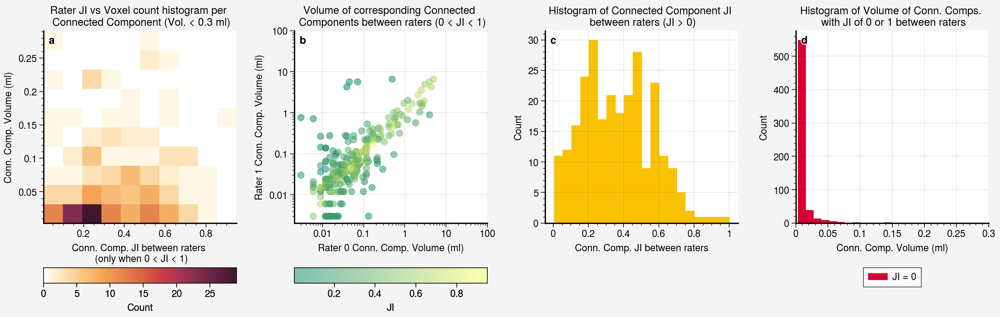

In [80]:
fig = pplt.figure(space=6, refwidth='20em', share=False)
axs = fig.subplots(nrows=1, ncols=4)

scale = 0.003
scaled_all_sizes = all_sizes * scale
scaled_IOU0_ccs_sizes = IOU0_ccs_sizes * scale
scaled_all_match_sizes = all_match_sizes * scale

axs[0].hist2d(all_ious[(scaled_all_sizes< 0.3) * (all_ious<1)].tolist(), (scaled_all_sizes[(scaled_all_sizes< 0.3) * (all_ious<1)]).tolist(), bins=10, colorbar='b',
    colorbar_kw={'length': 1, 'label': "Count"})
axs[0].set_xlabel("Conn. Comp. JI between raters \n (only when 0 < JI < 1)")
axs[0].set_ylabel(r"Conn. Comp. Volume (ml)")
axs[0].set_title("Rater JI vs Voxel count histogram per \n Connected Component " + r"(Vol. < 0.3 ml)")

axs[1].scatter((scaled_all_sizes[all_ious<1]).tolist(), (scaled_all_match_sizes[all_ious<1]).tolist(), c=all_ious[all_ious<1].tolist(), alpha=0.5, cmap='summer', colorbar='b',
    colorbar_kw={'length': 1, 'label': "JI"})
axs[1].set_xscale('log')
axs[1].set_yscale('log')
axs[1].set_xlabel(r"Rater 0 Conn. Comp. Volume (ml)")
axs[1].set_ylabel(r"Rater 1 Conn. Comp. Volume (ml)")
axs[1].set_title("Volume of corresponding Connected \n Components between raters (0 < JI < 1)")
axs[1].set_xlim((None, 100))
axs[1].set_ylim((None, 100))

axs[2].hist(all_ious.tolist(), bins=20, color='goldenrod')
axs[2].set_xlabel("Conn. Comp. JI between raters")
axs[2].set_ylabel("Count")
axs[2].set_title("Histogram of Connected Component JI \n between raters (JI > 0)")

ji0_arr = scaled_IOU0_ccs_sizes[scaled_IOU0_ccs_sizes < 0.3].tolist()
bins = len(ji0_arr) // 30
axs[3].hist(ji0_arr, bins=bins, label='JI = 0', color='#d50032')
ji1_arr = (scaled_all_sizes[(all_ious==1) * (scaled_all_sizes < 0.3)]).tolist()
bins = len(ji1_arr) // 30
if bins > 0:
    axs[3].hist(ji1_arr, bins=bins, label='JI = 1', color='#002c53')
axs[3].legend(loc='b')
axs[3].set_xlabel(r"Conn. Comp. Volume (ml)")
axs[3].set_ylabel("Count")
axs[3].set_title("Histogram of Volume of Conn. Comps. \n with JI of 0 or 1 between raters")
axs[3].set_xlim((0, 0.3))

axs.format(abc=True, abcloc='ul')
for ax in axs:
    ax.spines['top'].set_color('none')
    ax.spines['right'].set_color('none')
    ax.spines['bottom'].set_linewidth(1.2)  # Thicker bottom spine
    ax.spines['left'].set_linewidth(1.2)  # Thicker left spine

fig.save(f"Connected Component information {ds_name}.pdf", bbox_inches="tight")

In [81]:
len((scaled_IOU0_ccs_sizes[scaled_IOU0_ccs_sizes < 0.3]).tolist()) / 20

31.5

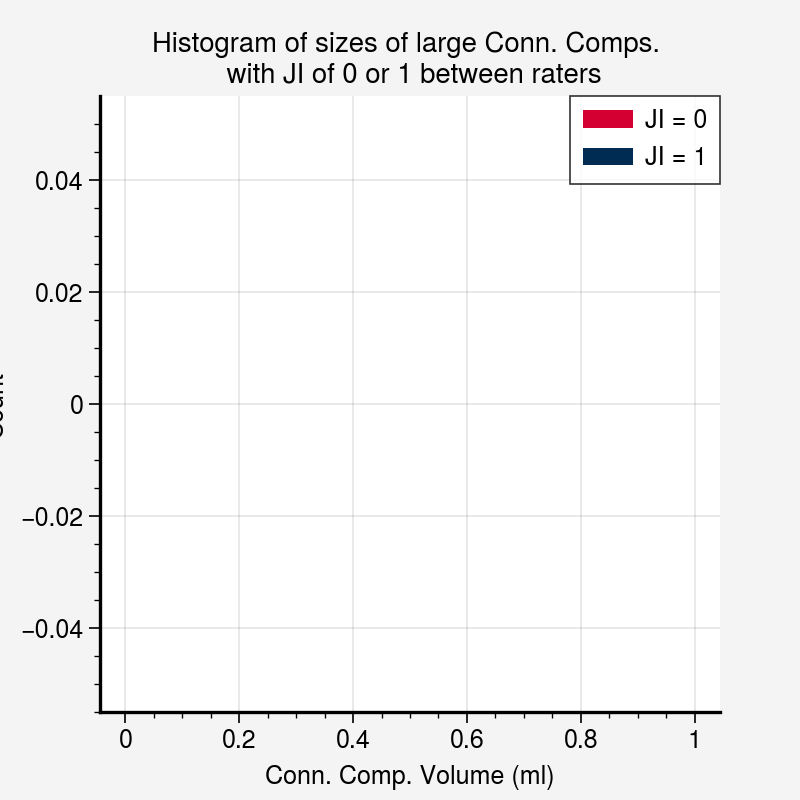

In [82]:
plt.hist([scaled_IOU0_ccs_sizes[scaled_IOU0_ccs_sizes > 0.3].tolist(), scaled_all_sizes[(all_ious==1) * (scaled_all_sizes > 0.3)].tolist()], color=['#d50032', '#002c53'], bins=20, label=['JI = 0', 'JI = 1'])
plt.legend()
plt.xlabel(r"Conn. Comp. Volume (ml)")
plt.ylabel("Count")
plt.title("Histogram of sizes of large Conn. Comps. \n with JI of 0 or 1 between raters")

ax = plt.gca()
ax.spines['top'].set_color('none')
ax.spines['right'].set_color('none')
ax.spines['bottom'].set_linewidth(1.2)  # Thicker bottom spine
ax.spines['left'].set_linewidth(1.2)  # Thicker left spine
    
plt.savefig(f"Size of large CCS with 0or1 JI {ds_name}.pdf", bbox_inches="tight")



## run cc analysis across PV region

In [83]:
# for i in range(len(means)):
#     print(xs3d_test[i].shape, pv_region_masks[i].shape)

In [84]:
all_sizes = []
all_ious = []
all_match_sizes = []
IOU0_ccs_sizes = []

ent_no_overlap_all, ent_low_overlap_all, ent_high_overlap_all, ent_exact_overlap_all = [], [], [], []

none_prop_uncert_all = [[] for _ in range(len(uncertainty_thresholds))]
low_prop_uncert_all = [[] for _ in range(len(uncertainty_thresholds))]
high_prop_uncert_all = [[] for _ in range(len(uncertainty_thresholds))]
exact_prop_uncert_all = [[] for _ in range(len(uncertainty_thresholds))]
non_useful_ccs_all = [[] for _ in range(len(uncertainty_thresholds))]

none_cc_mean = []
low_cc_mean = []
high_cc_mean = []
exact_cc_mean = []

for i in tqdm(range(len(means))):
    x = xs3d_test[i].cuda()
    pred = means[i].cuda().argmax(dim=1)
    e = ent_maps[i].cuda()
    pv_region = pv_region_masks[i].cuda()
    if x.shape[1] != pv_region.shape[0] or x.shape[2] != pv_region.shape[1] or x.shape[3] != pv_region.shape[2]:
        continue
    y0 = rater0[i].cuda() * pv_region
    y1 = rater1[i].cuda() * pv_region
    
    ccs_y0 = cc3d.connected_components(y0.type(torch.int32).cpu().numpy(), connectivity=26) # 26-connected
    ccs_y0 = torch.from_numpy(ccs_y0.astype(np.float32)).cuda()
    
    ccs_y1 = cc3d.connected_components(y1.type(torch.int32).cpu().numpy(), connectivity=26) # 26-connected
    ccs_y1 = torch.from_numpy(ccs_y1.astype(np.float32)).cuda()
    
    y0 = y0.cuda()
    y1 = y1.cuda()
    
    diff_image = (y0 + y1) == 1
    
    # find type 1: connected components in either map with no overlap
    no_overlap_ccs_y0, no_overlap_ccs_size_y0, no_overlap_ccs_img_y0 = find_non_overlapping_ccs(ccs_y0, y1)
    no_overlap_ccs_y1, no_overlap_ccs_size_y1, no_overlap_ccs_img_y1 = find_non_overlapping_ccs(ccs_y1, y0)
    IOU0_ccs_sizes.extend(no_overlap_ccs_size_y0 + no_overlap_ccs_size_y1)
    combined_no_overlap_image = (no_overlap_ccs_img_y0 + no_overlap_ccs_img_y1).type(torch.int)
    
    # get information on the IOU of connected components between rater 0 and rater 1 where the IOU > 0
    ious, y0_ccids, y1_ccid_matches, sizes, match_sizes = find_ious_between_raters(ccs_y0, ccs_y1, y0, y1)
    all_ious.append(ious)
    all_sizes.append(sizes)
    all_match_sizes.append(match_sizes)
    
    ious = torch.Tensor(ious)
    y0_ccids = torch.Tensor(y0_ccids)
    y1_ccid_matches = torch.Tensor(y1_ccid_matches)
    
    # find type 2: areas where connected components have a poor overlap IOU of 0.5 and below but not 0.
    # IOU of zero ccs have already been discounted in the previous step.
    low_ious = ious < 0.5
    low_IOU_y0_ccs = y0_ccids[low_ious]
    low_IOU_y1_ccs = y1_ccid_matches[low_ious]
    low_IOU_y1_ccs = torch.unique(low_IOU_y1_ccs)
    combined_low_overlap_image = create_overlap_image(low_IOU_y0_ccs, low_IOU_y1_ccs, ccs_y0, ccs_y1).type(torch.int)
    combined_low_overlap_diff_image = combined_low_overlap_image * diff_image
    
    # find type 3: high overlap
    high_ious = (ious >= 0.5) * (ious < 1)
    high_IOU_y0_ccs = y0_ccids[high_ious]
    high_IOU_y1_ccs = y1_ccid_matches[high_ious]
    high_IOU_y1_ccs = torch.unique(high_IOU_y1_ccs)
    combined_high_overlap_image = create_overlap_image(high_IOU_y0_ccs, high_IOU_y1_ccs, ccs_y0, ccs_y1).type(torch.int)
    combined_high_overlap_diff_image = combined_high_overlap_image * diff_image
    
    # find type 4: areas of exact overlap
    exact_ious = ious == 1
    exact_IOU_y0_ccs = y0_ccids[exact_ious]
    exact_IOU_y1_ccs = y1_ccid_matches[exact_ious]
    exact_IOU_y1_ccs = torch.unique(exact_IOU_y1_ccs)
    combined_exact_overlap_image = create_overlap_image(exact_IOU_y0_ccs, None, ccs_y0, ccs_y1).type(torch.int)
    
    # then get the areas where the raters agree and remove those areas. see what we are left with...
    # that is the joint uncertainty error overlap... but I want to look at the overlap away from the boundaries....
    
    # my concern is that we still have all of this edge information.
    
    # ANALYSIS 1 cc average uncertainty information
    # we need average uncertainty per connected component in the following regions
    # - IR IOU 0
    # - IR IOU 1
    # - diff of IR 0 < IOU < 0.5 regions
    # - diff of IR 0.5 <= IOU < 1 regions
    
    # ANALYSIS 1.5 pixel wise information
    # the same as analysis 1 but with individual voxels
    ef = e.flatten()
    ent_no_overlap, ent_low_overlap, ent_high_overlap, ent_exact_overlap = ef[combined_no_overlap_image.flatten()==1], ef[combined_low_overlap_diff_image.flatten()==1], ef[combined_high_overlap_diff_image.flatten()==1], ef[combined_exact_overlap_image.flatten()==1]
    ent_no_overlap_all.extend(ent_no_overlap.cpu())
    ent_low_overlap_all.extend(ent_low_overlap.cpu())
    ent_high_overlap_all.extend(ent_high_overlap.cpu())
    ent_exact_overlap_all.extend(ent_exact_overlap.cpu())
    
    
    # Analysis 2 connected component extra analysis
    # as the uncertainty threshold increases we look at:
    # average proportion of IR IOU 0 that are uncertain
    # average proportion of IR low IOU that are uncertain
    # average proportion of IR IOU high that are uncertain
    # average proportion of IR IOU 1 that are uncertain
    # number of connected components in uncertainty map that have zero overlap with either rater. I should do this for a fewer number of connected components
    none_prop_uncert = [[] for _ in range(len(uncertainty_thresholds))]
    low_prop_uncert = [[] for _ in range(len(uncertainty_thresholds))]
    high_prop_uncert = [[] for _ in range(len(uncertainty_thresholds))]
    exact_prop_uncert = [[] for _ in range(len(uncertainty_thresholds))]
    non_useful_ccs = [[] for _ in range(len(uncertainty_thresholds))]
    
    ccs_none = torch.from_numpy(cc3d.connected_components(combined_no_overlap_image.type(torch.int32).cpu().numpy(), connectivity=26).astype(np.float32)).cuda()
    ccs_low = torch.from_numpy(cc3d.connected_components(combined_low_overlap_diff_image.type(torch.int32).cpu().numpy(), connectivity=26).astype(np.float32)).cuda()
    ccs_high = torch.from_numpy(cc3d.connected_components(combined_high_overlap_diff_image.type(torch.int32).cpu().numpy(), connectivity=26).astype(np.float32)).cuda()
    ccs_exact = torch.from_numpy(cc3d.connected_components(combined_exact_overlap_image.type(torch.int32).cpu().numpy(), connectivity=26).astype(np.float32)).cuda()
    # print(ccs_none.unique())
    # print(combined_no_overlap_image.sum())
    for ti, t in enumerate(uncertainty_thresholds):
        et = (e > t).type(torch.float32)
        
        for cc_id in ccs_none.unique():
            if cc_id == 0:
                continue
            cc = ccs_none == cc_id
            # print(cc_id)
            # print(cc.sum())
            none_prop_uncert_all[ti].append(et[cc==1].mean().item())
            if ti == 0:
                none_cc_mean.append(e[cc==1].mean())
        for cc_id in ccs_low.unique():
            if cc_id == 0:
                continue
            cc = ccs_low == cc_id
            low_prop_uncert_all[ti].append(et[cc==1].mean().item())
            if ti == 0:
                low_cc_mean.append(e[cc==1].mean())
        for cc_id in ccs_high.unique():
            if cc_id == 0:
                continue
            cc = ccs_high == cc_id
            high_prop_uncert_all[ti].append(et[cc==1].mean().item())
            if ti == 0:
                high_cc_mean.append(e[cc==1].mean())
        for cc_id in ccs_exact.unique():
            if cc_id == 0:
                continue
            cc = ccs_exact == cc_id
            exact_prop_uncert_all[ti].append(et[cc==1].mean().item())
            if ti == 0:
                exact_cc_mean.append(e[cc==1].mean())
                
                
    # Analysis 2.5:
    # average number of superfluous connected components across the dataset as the threshold increases.
            
    
    # Analysis 3 UIRO outside of the regions of the segmentation (do euclidian distance or different components, square and cross for example?) Nice.
    
    # Analysis 4 JUEO outside the regions of the segmentation produced by the model (provide this with 2 different components or do euclidian distance?)
    
    # Analysis 5 pcitures
    # Collect a number of images of different individuals, the different maps, as I have outlined below, and demonstrate the things that we are talking about.
    # Just provide an image every 10 patients or something to demonstrate the examples. 
    # Nice.
    
    # yes this is a really good way to approach the analysis and I actually like it quite a lot.
    # then I need to collect my nice plot of connected components for each dataset and also collect some nice visual examples from the different datasets as well.....
    
    
    # if i == 1:
    #     break
    # break

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:15<00:00,  1.57s/it]


In [85]:
# the mean uncertainty of ccs as the uncertainty threshold increases
exact_prop_uncert2 = torch.Tensor(exact_prop_uncert_all)
high_prop_uncert2 = torch.Tensor(low_prop_uncert_all)
low_prop_uncert2 = torch.Tensor(high_prop_uncert_all)
none_prop_uncert2 = torch.Tensor(none_prop_uncert_all)

In [86]:
# the mean uncertainty of ccs in the unthresholded uncertainty map
none_cc_mean = torch.Tensor(none_cc_mean)
low_cc_mean = torch.Tensor(low_cc_mean)
high_cc_mean = torch.Tensor(high_cc_mean)
exact_cc_mean = torch.Tensor(exact_cc_mean)

In [87]:
# the uncertainty of voxels in the unthresholded uncertainty map
ent_no_overlap_all = torch.Tensor(ent_no_overlap_all)
ent_low_overlap_all = torch.Tensor(ent_low_overlap_all)
ent_high_overlap_all = torch.Tensor(ent_high_overlap_all)
ent_exact_overlap_all = torch.Tensor(ent_exact_overlap_all)

Text(0, 0.5, 'mean uncertainty of exact overlap ccs')

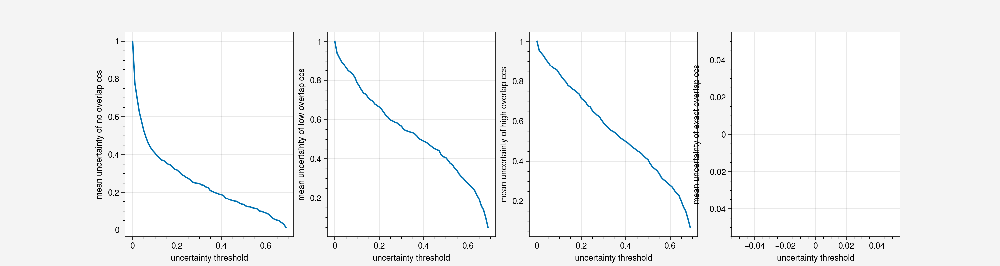

In [88]:
plt.figure(figsize=(15, 4))
plt.subplot(1,4,1)
plt.plot(uncertainty_thresholds, none_prop_uncert2.mean(dim=1))
plt.xlabel("uncertainty threshold")
plt.ylabel("mean uncertainty of no overlap ccs")
plt.subplot(1,4,2)
plt.plot(uncertainty_thresholds, low_prop_uncert2.mean(dim=1))
plt.xlabel("uncertainty threshold")
plt.ylabel("mean uncertainty of low overlap ccs")
plt.subplot(1,4,3)
plt.plot(uncertainty_thresholds, high_prop_uncert2.mean(dim=1))
plt.xlabel("uncertainty threshold")
plt.ylabel("mean uncertainty of high overlap ccs")
plt.subplot(1,4,4)
plt.plot(uncertainty_thresholds, exact_prop_uncert2.mean(dim=1))
plt.xlabel("uncertainty threshold")
plt.ylabel("mean uncertainty of exact overlap ccs")


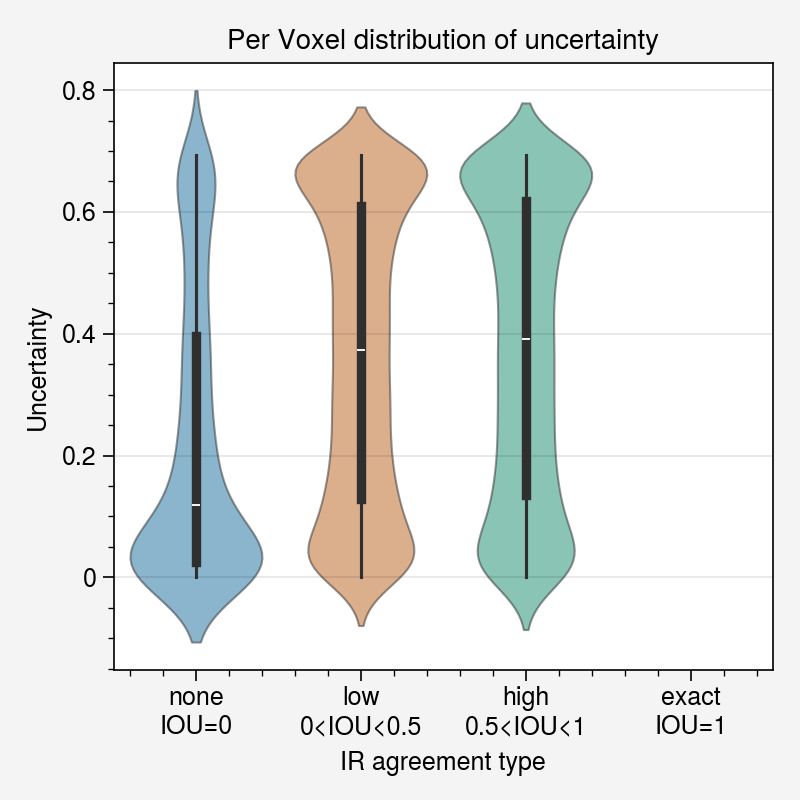

In [89]:
data = {"none\nIOU=0":ent_no_overlap_all.tolist(), "low\n0<IOU<0.5":ent_low_overlap_all.tolist(), "high\n0.5<IOU<1":ent_high_overlap_all.tolist(), "exact\nIOU=1":ent_exact_overlap_all.tolist()}
# ax = sns.boxplot(data, alpha=0.1)
sns.violinplot(data, alpha=0.5)
plt.xlabel("IR agreement type")
plt.ylabel("Uncertainty")
plt.title("Per Voxel distribution of uncertainty")
plt.tight_layout()

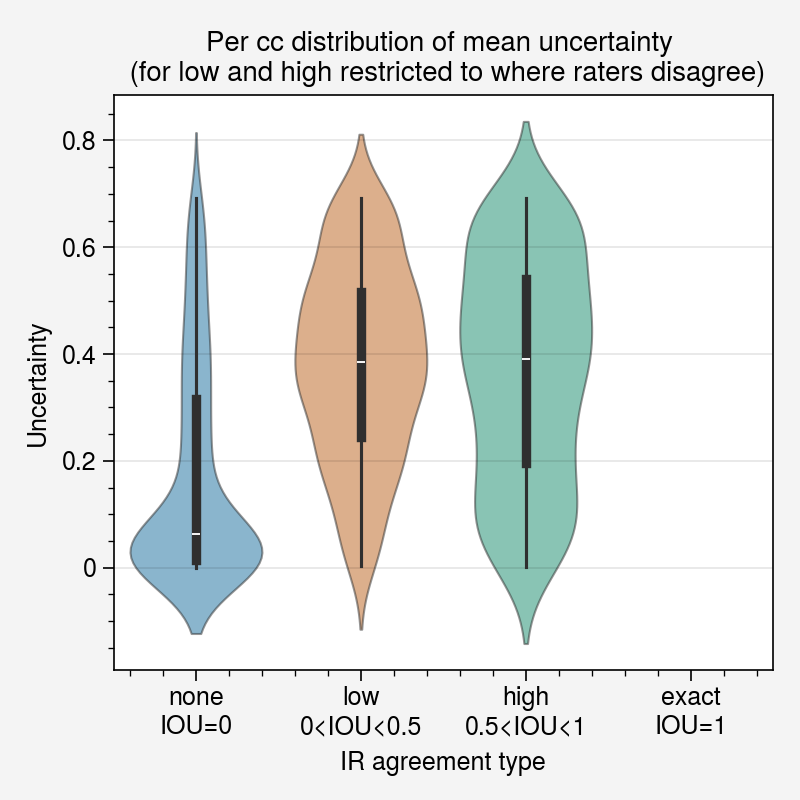

In [90]:
data = {"none\nIOU=0":none_cc_mean.tolist(), "low\n0<IOU<0.5":low_cc_mean.tolist(), "high\n0.5<IOU<1":high_cc_mean.tolist(), "exact\nIOU=1":exact_cc_mean.tolist()}
# ax = sns.boxplot(data, alpha=0.1)
sns.violinplot(data, alpha=0.5)
plt.xlabel("IR agreement type")
plt.ylabel("Uncertainty")
plt.title("Per cc distribution of mean uncertainty \n (for low and high restricted to where raters disagree)")
plt.tight_layout()

/home/s2208943/miniconda3/envs/wmh/lib/python3.8/site-packages/numpy/ma/core.py:467: RuntimeWarning: invalid value encountered in cast
  fill_value = np.array(fill_value, copy=False, dtype=ndtype)


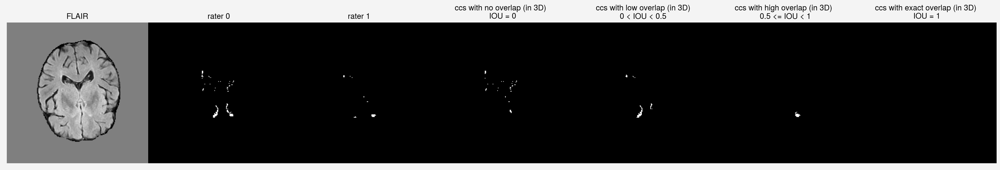

In [91]:
islice=30
fig = pplt.figure(space=0, refwidth='20em')
axs = fig.subplots(nrows=1, ncols=7)
b = 20
axs[0].imshow(x.cpu()[0, islice][b:-b, b:-b], cmap='gray')
axs[0].set_title("FLAIR")
axs[1].imshow(y0.type(torch.float32).cpu()[islice][b:-b, b:-b], cmap='gray')
axs[1].set_title("rater 0")
axs[2].imshow(y1.cpu()[islice][b:-b, b:-b], cmap='gray')
axs[2].set_title("rater 1 ")
axs[3].imshow(combined_no_overlap_image.cpu()[islice][b:-b, b:-b], cmap='gray')
axs[3].set_title("ccs with no overlap (in 3D) \n IOU = 0")
axs[4].imshow(combined_low_overlap_image.cpu()[islice][b:-b, b:-b], cmap='gray')
axs[4].set_title("ccs with low overlap (in 3D)\n 0 < IOU < 0.5 ")
axs[5].imshow(combined_high_overlap_image.cpu()[islice][b:-b, b:-b], cmap='gray')
axs[5].set_title("ccs with high overlap (in 3D) \n 0.5 <= IOU < 1")
axs[6].imshow(combined_exact_overlap_image.cpu()[islice][b:-b, b:-b], cmap='gray')
axs[6].set_title("ccs with exact overlap (in 3D)\n IOU = 1")
axs.format(grid=False, xlocator='null', ylocator='null')
for ax in axs:
    for spine in ax.spines:
        ax.spines[spine].set_color('none')
        
fig.savefig("Example of overlap types under consideration.png", bbox_inches='tight', dpi=600)

/home/s2208943/miniconda3/envs/wmh/lib/python3.8/site-packages/numpy/ma/core.py:467: RuntimeWarning: invalid value encountered in cast
  fill_value = np.array(fill_value, copy=False, dtype=ndtype)


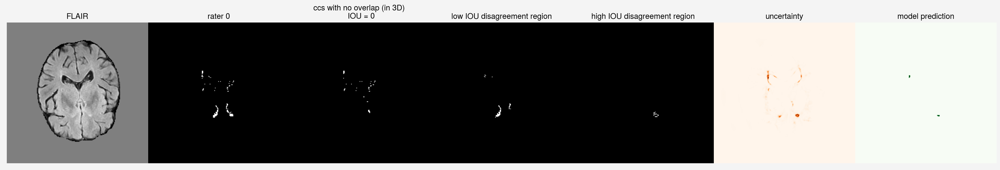

In [92]:
islice = 30
fig = pplt.figure(space=0, refwidth='20em')
axs = fig.subplots(nrows=1, ncols=7)
b = 20
axs[0].imshow(x.cpu()[0, islice][b:-b, b:-b], cmap='gray')
axs[0].set_title("FLAIR")
axs[1].imshow(y0.type(torch.float32).cpu()[islice][b:-b, b:-b], cmap='gray')
axs[1].set_title("rater 0")
axs[2].imshow(combined_no_overlap_image.cpu()[islice][b:-b, b:-b], cmap='gray')
axs[2].set_title("ccs with no overlap (in 3D) \n IOU = 0")
axs[3].imshow((diff_image * combined_low_overlap_image).cpu()[islice][b:-b, b:-b], cmap='gray')
axs[3].set_title("low IOU disagreement region")
axs[4].imshow((diff_image * combined_high_overlap_image).cpu()[islice][b:-b, b:-b], cmap='gray')

axs[4].set_title("high IOU disagreement region")
axs[5].imshow(ent_maps[i].cpu()[islice][b:-b, b:-b], cmap='Oranges')
axs[5].set_title("uncertainty")
axs[6].imshow(means[i][islice].argmax(dim=0).cpu()[b:-b, b:-b], cmap='Greens')
axs[6].set_title("model prediction")
axs.format(grid=False, xlocator='null', ylocator='null')
for ax in axs:
    for spine in ax.spines:
        ax.spines[spine].set_color('none')
        
# fig.savefig("Example of overlap and uncertainty.png", bbox_inches='tight', dpi=600)

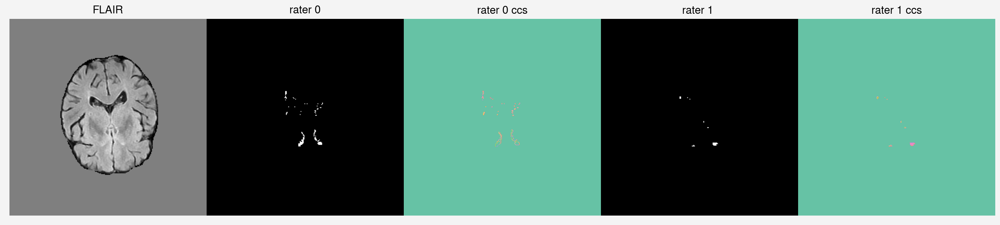

In [93]:
islice=30
fig = pplt.figure(space=0, refwidth='20em')
axs = fig.subplots(nrows=1, ncols=5)
axs[0].imshow(x.cpu()[0, islice], cmap='gray')
axs[0].set_title("FLAIR")
axs[1].imshow(y0.cpu()[islice], cmap='gray')
axs[1].set_title("rater 0")
axs[2].imshow(ccs_y0.cpu()[islice], cmap='Set2')
axs[2].set_title("rater 0 ccs")
axs[3].imshow(y1.cpu()[islice], cmap='gray')
axs[3].set_title("rater 1 ")
axs[4].imshow(ccs_y1.cpu()[islice], cmap='Set2')
axs[4].set_title("rater 1 ccs")
axs.format(grid=False, xlocator='null', ylocator='null')
for ax in axs:
    for spine in ax.spines:
        ax.spines[spine].set_color('none')

### urgent note to self, I cannot be sure that I have got the volumes right here and I need to check with Maria's volumes

In [94]:
all_ious = torch.cat([torch.Tensor(t) for t in all_ious])
all_sizes = torch.cat([torch.Tensor(t) for t in all_sizes])
all_match_sizes = torch.cat([torch.Tensor(t) for t in all_match_sizes])
IOU0_ccs_sizes = torch.Tensor(IOU0_ccs_sizes)

In [95]:
import seaborn as sns
from matplotlib.ticker import NullLocator

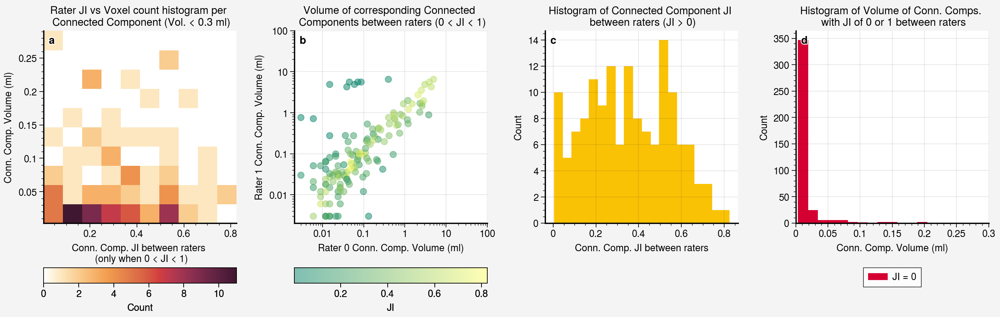

In [96]:
fig = pplt.figure(space=6, refwidth='20em', share=False)
axs = fig.subplots(nrows=1, ncols=4)

scale = 0.003
scaled_all_sizes = all_sizes * scale
scaled_IOU0_ccs_sizes = IOU0_ccs_sizes * scale
scaled_all_match_sizes = all_match_sizes * scale

axs[0].hist2d(all_ious[(scaled_all_sizes< 0.3) * (all_ious<1)].tolist(), (scaled_all_sizes[(scaled_all_sizes< 0.3) * (all_ious<1)]).tolist(), bins=10, colorbar='b',
    colorbar_kw={'length': 1, 'label': "Count"})
axs[0].set_xlabel("Conn. Comp. JI between raters \n (only when 0 < JI < 1)")
axs[0].set_ylabel(r"Conn. Comp. Volume (ml)")
axs[0].set_title("Rater JI vs Voxel count histogram per \n Connected Component " + r"(Vol. < 0.3 ml)")

axs[1].scatter((scaled_all_sizes[all_ious<1]).tolist(), (scaled_all_match_sizes[all_ious<1]).tolist(), c=all_ious[all_ious<1].tolist(), alpha=0.5, cmap='summer', colorbar='b',
    colorbar_kw={'length': 1, 'label': "JI"})
axs[1].set_xscale('log')
axs[1].set_yscale('log')
axs[1].set_xlabel(r"Rater 0 Conn. Comp. Volume (ml)")
axs[1].set_ylabel(r"Rater 1 Conn. Comp. Volume (ml)")
axs[1].set_title("Volume of corresponding Connected \n Components between raters (0 < JI < 1)")
axs[1].set_xlim((None, 100))
axs[1].set_ylim((None, 100))

axs[2].hist(all_ious.tolist(), bins=20, color='goldenrod')
axs[2].set_xlabel("Conn. Comp. JI between raters")
axs[2].set_ylabel("Count")
axs[2].set_title("Histogram of Connected Component JI \n between raters (JI > 0)")

ji0_arr = scaled_IOU0_ccs_sizes[scaled_IOU0_ccs_sizes < 0.3].tolist()
bins = len(ji0_arr) // 30
axs[3].hist(ji0_arr, bins=bins, label='JI = 0', color='#d50032')
ji1_arr = (scaled_all_sizes[(all_ious==1) * (scaled_all_sizes < 0.3)]).tolist()
bins = len(ji1_arr) // 30
if bins > 0:
    axs[3].hist(ji1_arr, bins=bins, label='JI = 1', color='#002c53')
axs[3].legend(loc='b')
axs[3].set_xlabel(r"Conn. Comp. Volume (ml)")
axs[3].set_ylabel("Count")
axs[3].set_title("Histogram of Volume of Conn. Comps. \n with JI of 0 or 1 between raters")
axs[3].set_xlim((0, 0.3))

axs.format(abc=True, abcloc='ul')
for ax in axs:
    ax.spines['top'].set_color('none')
    ax.spines['right'].set_color('none')
    ax.spines['bottom'].set_linewidth(1.2)  # Thicker bottom spine
    ax.spines['left'].set_linewidth(1.2)  # Thicker left spine

fig.save(f"Connected Component information PV REGION {ds_name}.pdf", bbox_inches="tight")

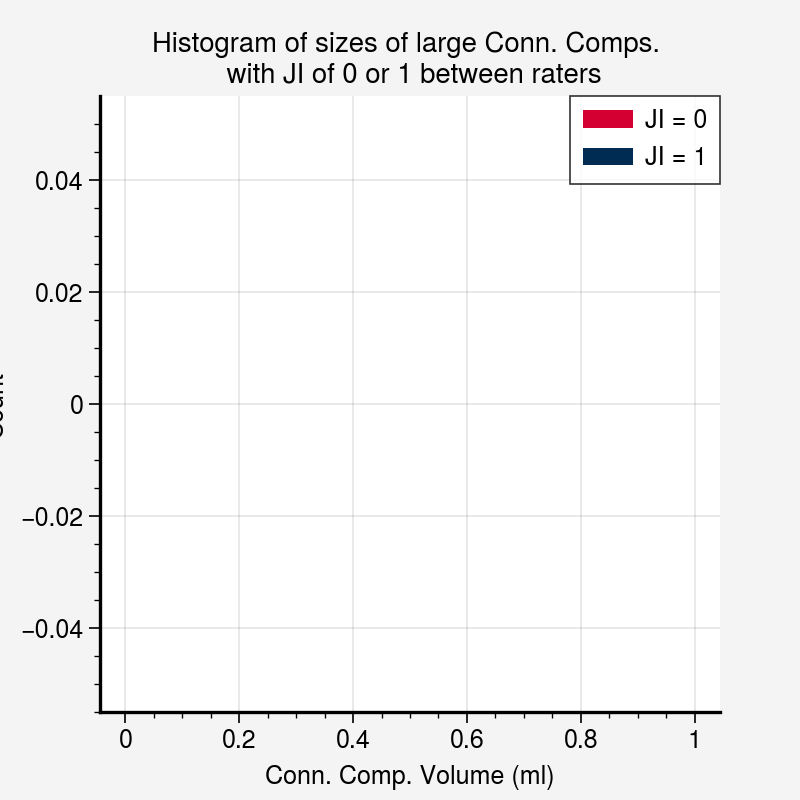

In [97]:
plt.hist([scaled_IOU0_ccs_sizes[scaled_IOU0_ccs_sizes > 0.3].tolist(), scaled_all_sizes[(all_ious==1) * (scaled_all_sizes > 0.3)].tolist()], color=['#d50032', '#002c53'], bins=20, label=['JI = 0', 'JI = 1'])
plt.legend()
plt.xlabel(r"Conn. Comp. Volume (ml)")
plt.ylabel("Count")
plt.title("Histogram of sizes of large Conn. Comps. \n with JI of 0 or 1 between raters")

ax = plt.gca()
ax.spines['top'].set_color('none')
ax.spines['right'].set_color('none')
ax.spines['bottom'].set_linewidth(1.2)  # Thicker bottom spine
ax.spines['left'].set_linewidth(1.2)  # Thicker left spine
    
plt.savefig(f"Size of large CCS with 0or1 JI PV REGION {ds_name}.pdf", bbox_inches="tight")



## run cc analysis across Deep region

In [98]:
# for i in range(len(means)):
#     print(xs3d_test[i].shape, pv_region_masks[i].shape)

In [99]:
all_sizes = []
all_ious = []
all_match_sizes = []
IOU0_ccs_sizes = []

ent_no_overlap_all, ent_low_overlap_all, ent_high_overlap_all, ent_exact_overlap_all = [], [], [], []

none_prop_uncert_all = [[] for _ in range(len(uncertainty_thresholds))]
low_prop_uncert_all = [[] for _ in range(len(uncertainty_thresholds))]
high_prop_uncert_all = [[] for _ in range(len(uncertainty_thresholds))]
exact_prop_uncert_all = [[] for _ in range(len(uncertainty_thresholds))]
non_useful_ccs_all = [[] for _ in range(len(uncertainty_thresholds))]

none_cc_mean = []
low_cc_mean = []
high_cc_mean = []
exact_cc_mean = []

for i in tqdm(range(len(means))):
    x = xs3d_test[i].cuda()
    pred = means[i].cuda().argmax(dim=1)
    e = ent_maps[i].cuda()
    deep_region = 1 - pv_region_masks[i].cuda()
    if x.shape[1] != deep_region.shape[0] or x.shape[2] != deep_region.shape[1] or x.shape[3] != deep_region.shape[2]:
        continue
    y0 = rater0[i].cuda() * deep_region
    y1 = rater1[i].cuda() * deep_region
    
    ccs_y0 = cc3d.connected_components(y0.type(torch.int32).cpu().numpy(), connectivity=26) # 26-connected
    ccs_y0 = torch.from_numpy(ccs_y0.astype(np.float32)).cuda()
    
    ccs_y1 = cc3d.connected_components(y1.type(torch.int32).cpu().numpy(), connectivity=26) # 26-connected
    ccs_y1 = torch.from_numpy(ccs_y1.astype(np.float32)).cuda()
    
    y0 = y0.cuda()
    y1 = y1.cuda()
    
    diff_image = (y0 + y1) == 1
    
    # find type 1: connected components in either map with no overlap
    no_overlap_ccs_y0, no_overlap_ccs_size_y0, no_overlap_ccs_img_y0 = find_non_overlapping_ccs(ccs_y0, y1)
    no_overlap_ccs_y1, no_overlap_ccs_size_y1, no_overlap_ccs_img_y1 = find_non_overlapping_ccs(ccs_y1, y0)
    IOU0_ccs_sizes.extend(no_overlap_ccs_size_y0 + no_overlap_ccs_size_y1)
    combined_no_overlap_image = (no_overlap_ccs_img_y0 + no_overlap_ccs_img_y1).type(torch.int)
    
    # get information on the IOU of connected components between rater 0 and rater 1 where the IOU > 0
    ious, y0_ccids, y1_ccid_matches, sizes, match_sizes = find_ious_between_raters(ccs_y0, ccs_y1, y0, y1)
    all_ious.append(ious)
    all_sizes.append(sizes)
    all_match_sizes.append(match_sizes)
    
    ious = torch.Tensor(ious)
    y0_ccids = torch.Tensor(y0_ccids)
    y1_ccid_matches = torch.Tensor(y1_ccid_matches)
    
    # find type 2: areas where connected components have a poor overlap IOU of 0.5 and below but not 0.
    # IOU of zero ccs have already been discounted in the previous step.
    low_ious = ious < 0.5
    low_IOU_y0_ccs = y0_ccids[low_ious]
    low_IOU_y1_ccs = y1_ccid_matches[low_ious]
    low_IOU_y1_ccs = torch.unique(low_IOU_y1_ccs)
    combined_low_overlap_image = create_overlap_image(low_IOU_y0_ccs, low_IOU_y1_ccs, ccs_y0, ccs_y1).type(torch.int)
    combined_low_overlap_diff_image = combined_low_overlap_image * diff_image
    
    # find type 3: high overlap
    high_ious = (ious >= 0.5) * (ious < 1)
    high_IOU_y0_ccs = y0_ccids[high_ious]
    high_IOU_y1_ccs = y1_ccid_matches[high_ious]
    high_IOU_y1_ccs = torch.unique(high_IOU_y1_ccs)
    combined_high_overlap_image = create_overlap_image(high_IOU_y0_ccs, high_IOU_y1_ccs, ccs_y0, ccs_y1).type(torch.int)
    combined_high_overlap_diff_image = combined_high_overlap_image * diff_image
    
    # find type 4: areas of exact overlap
    exact_ious = ious == 1
    exact_IOU_y0_ccs = y0_ccids[exact_ious]
    exact_IOU_y1_ccs = y1_ccid_matches[exact_ious]
    exact_IOU_y1_ccs = torch.unique(exact_IOU_y1_ccs)
    combined_exact_overlap_image = create_overlap_image(exact_IOU_y0_ccs, None, ccs_y0, ccs_y1).type(torch.int)
    
    # then get the areas where the raters agree and remove those areas. see what we are left with...
    # that is the joint uncertainty error overlap... but I want to look at the overlap away from the boundaries....
    
    # my concern is that we still have all of this edge information.
    
    # ANALYSIS 1 cc average uncertainty information
    # we need average uncertainty per connected component in the following regions
    # - IR IOU 0
    # - IR IOU 1
    # - diff of IR 0 < IOU < 0.5 regions
    # - diff of IR 0.5 <= IOU < 1 regions
    
    # ANALYSIS 1.5 pixel wise information
    # the same as analysis 1 but with individual voxels
    ef = e.flatten()
    ent_no_overlap, ent_low_overlap, ent_high_overlap, ent_exact_overlap = ef[combined_no_overlap_image.flatten()==1], ef[combined_low_overlap_diff_image.flatten()==1], ef[combined_high_overlap_diff_image.flatten()==1], ef[combined_exact_overlap_image.flatten()==1]
    ent_no_overlap_all.extend(ent_no_overlap.cpu())
    ent_low_overlap_all.extend(ent_low_overlap.cpu())
    ent_high_overlap_all.extend(ent_high_overlap.cpu())
    ent_exact_overlap_all.extend(ent_exact_overlap.cpu())
    
    
    # Analysis 2 connected component extra analysis
    # as the uncertainty threshold increases we look at:
    # average proportion of IR IOU 0 that are uncertain
    # average proportion of IR low IOU that are uncertain
    # average proportion of IR IOU high that are uncertain
    # average proportion of IR IOU 1 that are uncertain
    # number of connected components in uncertainty map that have zero overlap with either rater. I should do this for a fewer number of connected components
    none_prop_uncert = [[] for _ in range(len(uncertainty_thresholds))]
    low_prop_uncert = [[] for _ in range(len(uncertainty_thresholds))]
    high_prop_uncert = [[] for _ in range(len(uncertainty_thresholds))]
    exact_prop_uncert = [[] for _ in range(len(uncertainty_thresholds))]
    non_useful_ccs = [[] for _ in range(len(uncertainty_thresholds))]
    
    ccs_none = torch.from_numpy(cc3d.connected_components(combined_no_overlap_image.type(torch.int32).cpu().numpy(), connectivity=26).astype(np.float32)).cuda()
    ccs_low = torch.from_numpy(cc3d.connected_components(combined_low_overlap_diff_image.type(torch.int32).cpu().numpy(), connectivity=26).astype(np.float32)).cuda()
    ccs_high = torch.from_numpy(cc3d.connected_components(combined_high_overlap_diff_image.type(torch.int32).cpu().numpy(), connectivity=26).astype(np.float32)).cuda()
    ccs_exact = torch.from_numpy(cc3d.connected_components(combined_exact_overlap_image.type(torch.int32).cpu().numpy(), connectivity=26).astype(np.float32)).cuda()
    # print(ccs_none.unique())
    # print(combined_no_overlap_image.sum())
    for ti, t in enumerate(uncertainty_thresholds):
        et = (e > t).type(torch.float32)
        
        for cc_id in ccs_none.unique():
            if cc_id == 0:
                continue
            cc = ccs_none == cc_id
            # print(cc_id)
            # print(cc.sum())
            none_prop_uncert_all[ti].append(et[cc==1].mean().item())
            if ti == 0:
                none_cc_mean.append(e[cc==1].mean())
        for cc_id in ccs_low.unique():
            if cc_id == 0:
                continue
            cc = ccs_low == cc_id
            low_prop_uncert_all[ti].append(et[cc==1].mean().item())
            if ti == 0:
                low_cc_mean.append(e[cc==1].mean())
        for cc_id in ccs_high.unique():
            if cc_id == 0:
                continue
            cc = ccs_high == cc_id
            high_prop_uncert_all[ti].append(et[cc==1].mean().item())
            if ti == 0:
                high_cc_mean.append(e[cc==1].mean())
        for cc_id in ccs_exact.unique():
            if cc_id == 0:
                continue
            cc = ccs_exact == cc_id
            exact_prop_uncert_all[ti].append(et[cc==1].mean().item())
            if ti == 0:
                exact_cc_mean.append(e[cc==1].mean())
                
                
    # Analysis 2.5:
    # average number of superfluous connected components across the dataset as the threshold increases.
            
    
    # Analysis 3 UIRO outside of the regions of the segmentation (do euclidian distance or different components, square and cross for example?) Nice.
    
    # Analysis 4 JUEO outside the regions of the segmentation produced by the model (provide this with 2 different components or do euclidian distance?)
    
    # Analysis 5 pcitures
    # Collect a number of images of different individuals, the different maps, as I have outlined below, and demonstrate the things that we are talking about.
    # Just provide an image every 10 patients or something to demonstrate the examples. 
    # Nice.
    
    # yes this is a really good way to approach the analysis and I actually like it quite a lot.
    # then I need to collect my nice plot of connected components for each dataset and also collect some nice visual examples from the different datasets as well.....
    
    
    # if i == 1:
    #     break
    # break

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:10<00:00,  1.10s/it]


In [100]:
# the mean uncertainty of ccs as the uncertainty threshold increases
exact_prop_uncert2 = torch.Tensor(exact_prop_uncert_all)
high_prop_uncert2 = torch.Tensor(low_prop_uncert_all)
low_prop_uncert2 = torch.Tensor(high_prop_uncert_all)
none_prop_uncert2 = torch.Tensor(none_prop_uncert_all)

In [101]:
# the mean uncertainty of ccs in the unthresholded uncertainty map
none_cc_mean = torch.Tensor(none_cc_mean)
low_cc_mean = torch.Tensor(low_cc_mean)
high_cc_mean = torch.Tensor(high_cc_mean)
exact_cc_mean = torch.Tensor(exact_cc_mean)

In [102]:
# the uncertainty of voxels in the unthresholded uncertainty map
ent_no_overlap_all = torch.Tensor(ent_no_overlap_all)
ent_low_overlap_all = torch.Tensor(ent_low_overlap_all)
ent_high_overlap_all = torch.Tensor(ent_high_overlap_all)
ent_exact_overlap_all = torch.Tensor(ent_exact_overlap_all)

Text(0, 0.5, 'mean uncertainty of exact overlap ccs')

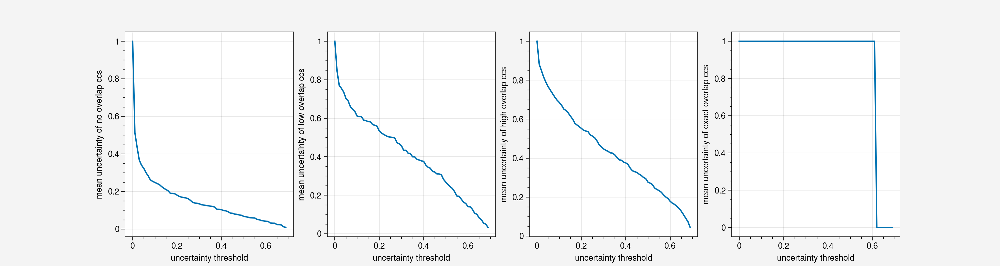

In [103]:
plt.figure(figsize=(15, 4))
plt.subplot(1,4,1)
plt.plot(uncertainty_thresholds, none_prop_uncert2.mean(dim=1))
plt.xlabel("uncertainty threshold")
plt.ylabel("mean uncertainty of no overlap ccs")
plt.subplot(1,4,2)
plt.plot(uncertainty_thresholds, low_prop_uncert2.mean(dim=1))
plt.xlabel("uncertainty threshold")
plt.ylabel("mean uncertainty of low overlap ccs")
plt.subplot(1,4,3)
plt.plot(uncertainty_thresholds, high_prop_uncert2.mean(dim=1))
plt.xlabel("uncertainty threshold")
plt.ylabel("mean uncertainty of high overlap ccs")
plt.subplot(1,4,4)
plt.plot(uncertainty_thresholds, exact_prop_uncert2.mean(dim=1))
plt.xlabel("uncertainty threshold")
plt.ylabel("mean uncertainty of exact overlap ccs")


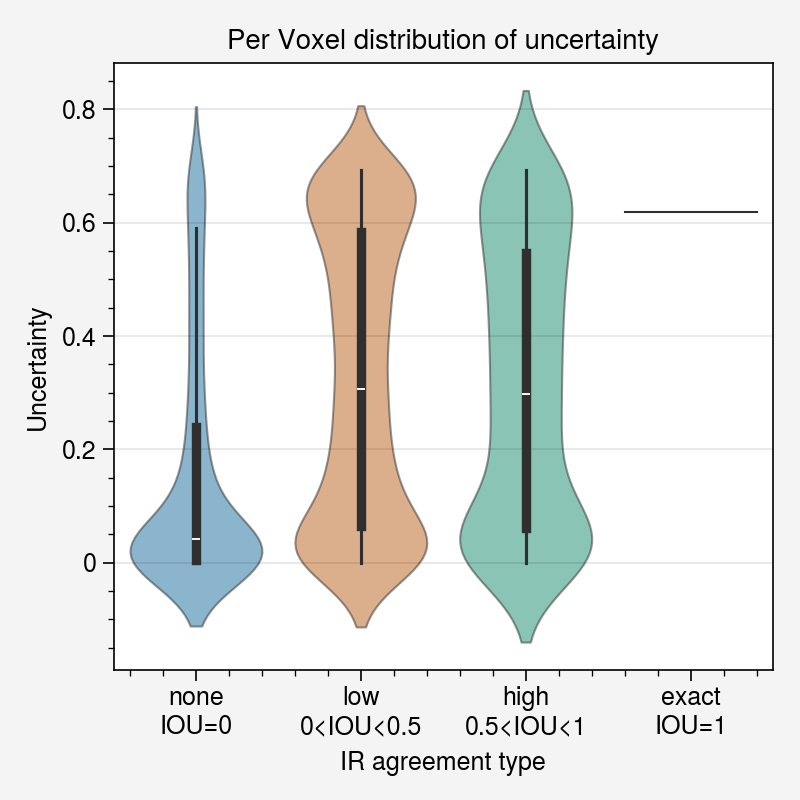

In [104]:
data = {"none\nIOU=0":ent_no_overlap_all.tolist(), "low\n0<IOU<0.5":ent_low_overlap_all.tolist(), "high\n0.5<IOU<1":ent_high_overlap_all.tolist(), "exact\nIOU=1":ent_exact_overlap_all.tolist()}
# ax = sns.boxplot(data, alpha=0.1)
sns.violinplot(data, alpha=0.5)
plt.xlabel("IR agreement type")
plt.ylabel("Uncertainty")
plt.title("Per Voxel distribution of uncertainty")
plt.tight_layout()

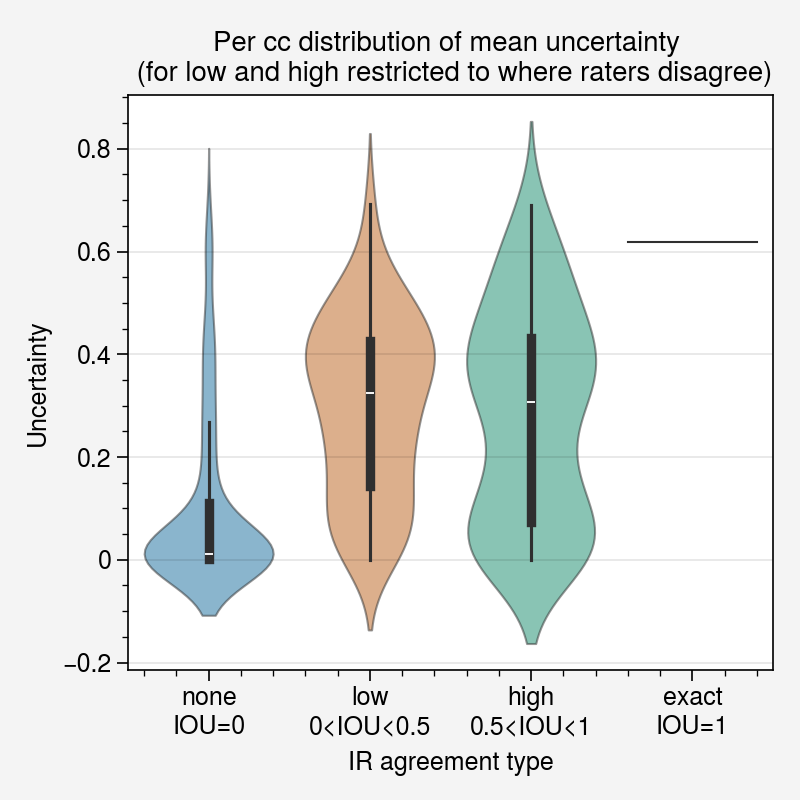

In [105]:
data = {"none\nIOU=0":none_cc_mean.tolist(), "low\n0<IOU<0.5":low_cc_mean.tolist(), "high\n0.5<IOU<1":high_cc_mean.tolist(), "exact\nIOU=1":exact_cc_mean.tolist()}
# ax = sns.boxplot(data, alpha=0.1)
sns.violinplot(data, alpha=0.5)
plt.xlabel("IR agreement type")
plt.ylabel("Uncertainty")
plt.title("Per cc distribution of mean uncertainty \n (for low and high restricted to where raters disagree)")
plt.tight_layout()

/home/s2208943/miniconda3/envs/wmh/lib/python3.8/site-packages/numpy/ma/core.py:467: RuntimeWarning: invalid value encountered in cast
  fill_value = np.array(fill_value, copy=False, dtype=ndtype)


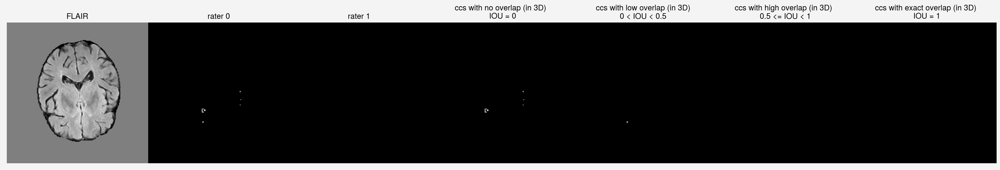

In [106]:
islice=30
fig = pplt.figure(space=0, refwidth='20em')
axs = fig.subplots(nrows=1, ncols=7)
b = 20
axs[0].imshow(x.cpu()[0, islice][b:-b, b:-b], cmap='gray')
axs[0].set_title("FLAIR")
axs[1].imshow(y0.type(torch.float32).cpu()[islice][b:-b, b:-b], cmap='gray')
axs[1].set_title("rater 0")
axs[2].imshow(y1.cpu()[islice][b:-b, b:-b], cmap='gray')
axs[2].set_title("rater 1 ")
axs[3].imshow(combined_no_overlap_image.cpu()[islice][b:-b, b:-b], cmap='gray')
axs[3].set_title("ccs with no overlap (in 3D) \n IOU = 0")
axs[4].imshow(combined_low_overlap_image.cpu()[islice][b:-b, b:-b], cmap='gray')
axs[4].set_title("ccs with low overlap (in 3D)\n 0 < IOU < 0.5 ")
axs[5].imshow(combined_high_overlap_image.cpu()[islice][b:-b, b:-b], cmap='gray')
axs[5].set_title("ccs with high overlap (in 3D) \n 0.5 <= IOU < 1")
axs[6].imshow(combined_exact_overlap_image.cpu()[islice][b:-b, b:-b], cmap='gray')
axs[6].set_title("ccs with exact overlap (in 3D)\n IOU = 1")
axs.format(grid=False, xlocator='null', ylocator='null')
for ax in axs:
    for spine in ax.spines:
        ax.spines[spine].set_color('none')
        
fig.savefig("Example of overlap types under consideration DEEP REGION.png", bbox_inches='tight', dpi=600)

/home/s2208943/miniconda3/envs/wmh/lib/python3.8/site-packages/numpy/ma/core.py:467: RuntimeWarning: invalid value encountered in cast
  fill_value = np.array(fill_value, copy=False, dtype=ndtype)


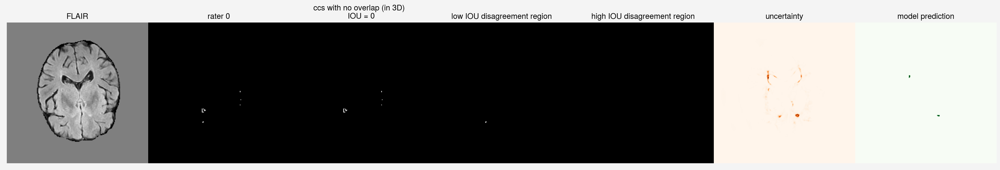

In [107]:
islice = 30
fig = pplt.figure(space=0, refwidth='20em')
axs = fig.subplots(nrows=1, ncols=7)
b = 20
axs[0].imshow(x.cpu()[0, islice][b:-b, b:-b], cmap='gray')
axs[0].set_title("FLAIR")
axs[1].imshow(y0.type(torch.float32).cpu()[islice][b:-b, b:-b], cmap='gray')
axs[1].set_title("rater 0")
axs[2].imshow(combined_no_overlap_image.cpu()[islice][b:-b, b:-b], cmap='gray')
axs[2].set_title("ccs with no overlap (in 3D) \n IOU = 0")
axs[3].imshow((diff_image * combined_low_overlap_image).cpu()[islice][b:-b, b:-b], cmap='gray')
axs[3].set_title("low IOU disagreement region")
axs[4].imshow((diff_image * combined_high_overlap_image).cpu()[islice][b:-b, b:-b], cmap='gray')

axs[4].set_title("high IOU disagreement region")
axs[5].imshow(ent_maps[i].cpu()[islice][b:-b, b:-b], cmap='Oranges')
axs[5].set_title("uncertainty")
axs[6].imshow(means[i][islice].argmax(dim=0).cpu()[b:-b, b:-b], cmap='Greens')
axs[6].set_title("model prediction")
axs.format(grid=False, xlocator='null', ylocator='null')
for ax in axs:
    for spine in ax.spines:
        ax.spines[spine].set_color('none')
        
# fig.savefig("Example of overlap and uncertainty.png", bbox_inches='tight', dpi=600)

In [108]:
ds_name

'lbc'

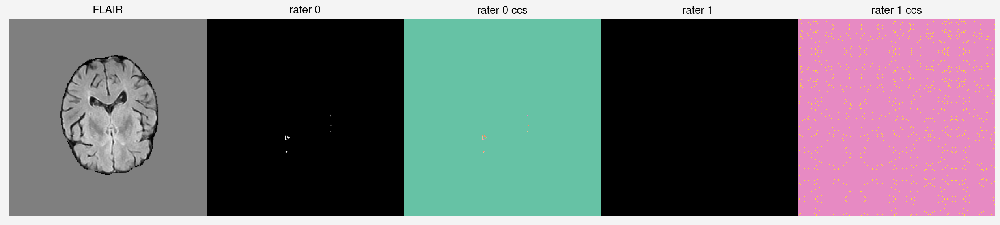

In [109]:
islice=30
fig = pplt.figure(space=0, refwidth='20em')
axs = fig.subplots(nrows=1, ncols=5)
axs[0].imshow(x.cpu()[0, islice], cmap='gray')
axs[0].set_title("FLAIR")
axs[1].imshow(y0.cpu()[islice], cmap='gray')
axs[1].set_title("rater 0")
axs[2].imshow(ccs_y0.cpu()[islice], cmap='Set2')
axs[2].set_title("rater 0 ccs")
axs[3].imshow(y1.cpu()[islice], cmap='gray')
axs[3].set_title("rater 1 ")
axs[4].imshow(ccs_y1.cpu()[islice], cmap='Set2')
axs[4].set_title("rater 1 ccs")
axs.format(grid=False, xlocator='null', ylocator='null')
for ax in axs:
    for spine in ax.spines:
        ax.spines[spine].set_color('none')

### urgent note to self, I cannot be sure that I have got the volumes right here and I need to check with Maria's volumes

In [110]:
all_ious = torch.cat([torch.Tensor(t) for t in all_ious])
all_sizes = torch.cat([torch.Tensor(t) for t in all_sizes])
all_match_sizes = torch.cat([torch.Tensor(t) for t in all_match_sizes])
IOU0_ccs_sizes = torch.Tensor(IOU0_ccs_sizes)

In [111]:
import seaborn as sns
from matplotlib.ticker import NullLocator

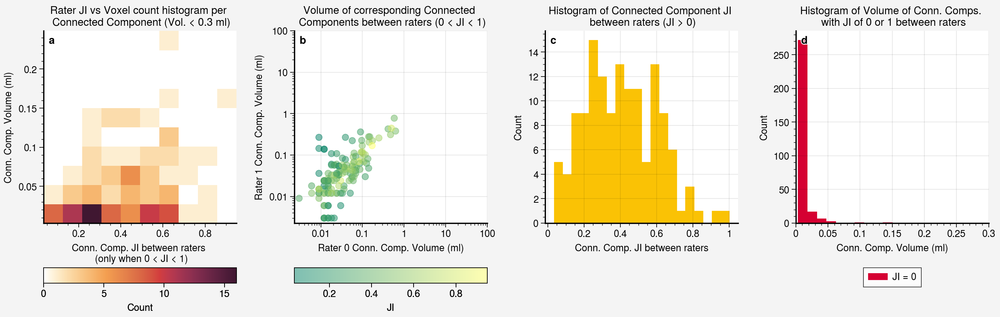

In [112]:
fig = pplt.figure(space=6, refwidth='20em', share=False)
axs = fig.subplots(nrows=1, ncols=4)

scale = 0.003
scaled_all_sizes = all_sizes * scale
scaled_IOU0_ccs_sizes = IOU0_ccs_sizes * scale
scaled_all_match_sizes = all_match_sizes * scale

axs[0].hist2d(all_ious[(scaled_all_sizes< 0.3) * (all_ious<1)].tolist(), (scaled_all_sizes[(scaled_all_sizes< 0.3) * (all_ious<1)]).tolist(), bins=10, colorbar='b',
    colorbar_kw={'length': 1, 'label': "Count"})
axs[0].set_xlabel("Conn. Comp. JI between raters \n (only when 0 < JI < 1)")
axs[0].set_ylabel(r"Conn. Comp. Volume (ml)")
axs[0].set_title("Rater JI vs Voxel count histogram per \n Connected Component " + r"(Vol. < 0.3 ml)")

axs[1].scatter((scaled_all_sizes[all_ious<1]).tolist(), (scaled_all_match_sizes[all_ious<1]).tolist(), c=all_ious[all_ious<1].tolist(), alpha=0.5, cmap='summer', colorbar='b',
    colorbar_kw={'length': 1, 'label': "JI"})
axs[1].set_xscale('log')
axs[1].set_yscale('log')
axs[1].set_xlabel(r"Rater 0 Conn. Comp. Volume (ml)")
axs[1].set_ylabel(r"Rater 1 Conn. Comp. Volume (ml)")
axs[1].set_title("Volume of corresponding Connected \n Components between raters (0 < JI < 1)")
axs[1].set_xlim((None, 100))
axs[1].set_ylim((None, 100))

axs[2].hist(all_ious.tolist(), bins=20, color='goldenrod')
axs[2].set_xlabel("Conn. Comp. JI between raters")
axs[2].set_ylabel("Count")
axs[2].set_title("Histogram of Connected Component JI \n between raters (JI > 0)")

ji0_arr = scaled_IOU0_ccs_sizes[scaled_IOU0_ccs_sizes < 0.3].tolist()
bins = len(ji0_arr) // 30
axs[3].hist(ji0_arr, bins=bins, label='JI = 0', color='#d50032')
ji1_arr = (scaled_all_sizes[(all_ious==1) * (scaled_all_sizes < 0.3)]).tolist()
bins = len(ji1_arr) // 30
if bins > 0:
    axs[3].hist(ji1_arr, bins=bins, label='JI = 1', color='#002c53')
axs[3].legend(loc='b')
axs[3].set_xlabel(r"Conn. Comp. Volume (ml)")
axs[3].set_ylabel("Count")
axs[3].set_title("Histogram of Volume of Conn. Comps. \n with JI of 0 or 1 between raters")
axs[3].set_xlim((0, 0.3))

axs.format(abc=True, abcloc='ul')
for ax in axs:
    ax.spines['top'].set_color('none')
    ax.spines['right'].set_color('none')
    ax.spines['bottom'].set_linewidth(1.2)  # Thicker bottom spine
    ax.spines['left'].set_linewidth(1.2)  # Thicker left spine

fig.save(f"Connected Component information DEEP REGION {ds_name}.pdf", bbox_inches="tight")

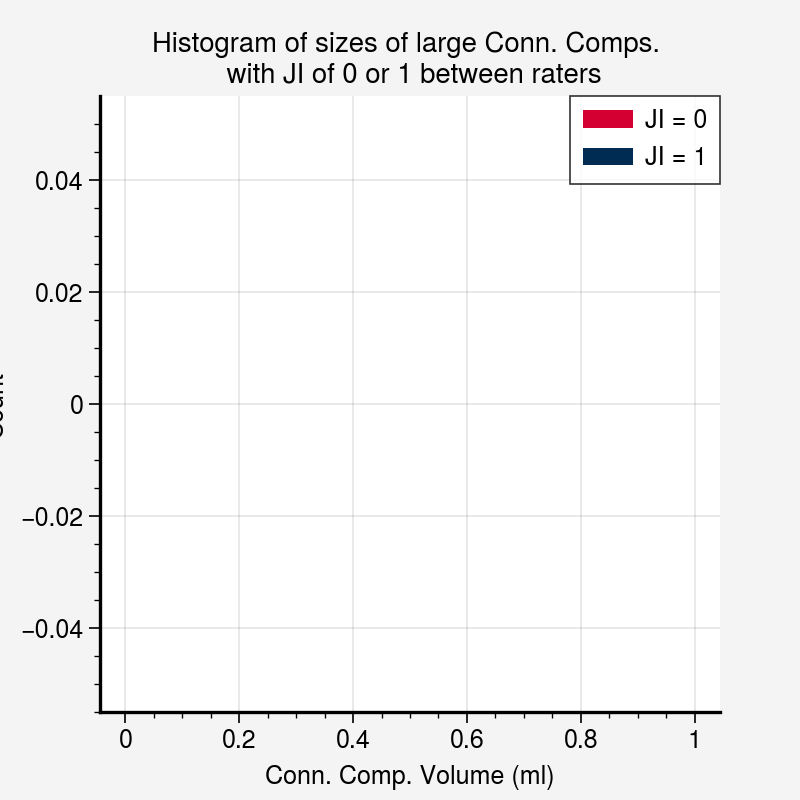

In [113]:
plt.hist([scaled_IOU0_ccs_sizes[scaled_IOU0_ccs_sizes > 0.3].tolist(), scaled_all_sizes[(all_ious==1) * (scaled_all_sizes > 0.3)].tolist()], color=['#d50032', '#002c53'], bins=20, label=['JI = 0', 'JI = 1'])
plt.legend()
plt.xlabel(r"Conn. Comp. Volume (ml)")
plt.ylabel("Count")
plt.title("Histogram of sizes of large Conn. Comps. \n with JI of 0 or 1 between raters")

ax = plt.gca()
ax.spines['top'].set_color('none')
ax.spines['right'].set_color('none')
ax.spines['bottom'].set_linewidth(1.2)  # Thicker bottom spine
ax.spines['left'].set_linewidth(1.2)  # Thicker left spine
    
plt.savefig(f"Size of large CCS with 0or1 JI DEEP REGION {ds_name}.pdf", bbox_inches="tight")



## todo

- [x] add code to overlay the ventricle delination over all the images in a particular slice
- [x] get multiple images randomly selected, randomly selecting the slices as well.
- [x] it seems the deep ccs are very small in volume, so that is why the overlap is so poor. Essentially the PV ones are bigger, it explains the plot. The missing lesions are just so small. That causes a problem for us, but we can understand what is going on. We should follow this up with further analsis of images in the different datasets.
- [x] compute the UIRO per the non, low and high overlap cc regions, masking out the other regions, by using euclidian distance between these regions. We need to do this because of the fact that the regions are so small.
- [x] verify that what we see in the plots makes sense
- [x] fix the fact that some connected components are getting included twice where they have high overlap with one but low overlap with another. Does it need fixing? I'm not sure it is urgent, just say that some connected components may be inlcuded twice due to greedy matching without replacement. During analysis time we only include for the low and high regions areas where the raters disagree across all connected components, so those areas are not counted twice in the analysis. The double overlapping happens for the JI < 0 case where small lesions overlap more than large ones.
- [x] collect a plot that counts how many connected components in the uncertainty map there are (at a given threshold) that have 0 IOU with either rater's segmentations. This needs a little extra work
- [x] read through the code again to check that what I am doing makes sense.
- [x] look through the bad images
- [ ] deal with the bad images from the LBC dataset (this includes checking if some are skipped in analysis stage due to shapes not matching!)
- [ ] deal with the bad images from the Challenge dataset (this includes checking if some are skipped in analysis stage due to shapes not matching!)
- [ ] deal with the bad images from the MSS3 dataset (this includes checking if some are skipped in analysis stage due to shapes not matching!)
- [x] remove the 4 images with the inverted segmentations from the analysis
- [ ] get similar images showing the policies are fundamentally different between raters (by which I mean similar looking images across the three datasets)
- [ ] remove duplicates per patient for the MSS3 data.
- [x] check whether Maria added in the extra LBC data.
- [ ] carefully modify the existing results collection script to get all the information that I need from here. So copy the stuff for eliminating certain individuals form mss3 and the code for loading the ventricle segs, and ensure the evaluation script works for the deep and pv regions.
- [x] add code to save the results that I need, and where it is pixel values I need to save those as an array okay.
- [x] remove the old edge detection based results? Nah keep them just don't include them in the paper or presentation for now.
- [x] add the uiro and jueo analysis for the PV and Deep regions.
- [x] collect the results across all the models.
- [ ] get a fazekas prediction model just based on volume, and check the agreement between different raters on the different datasets. How oftem do they agree with the 'ground truth' etc. Also makes the argument for fazekas based on the predictions of others going forward is a problematic idea. perhaps we should move towards a system of, this distance from the ventricles, (for patients with smaller ventricles).
- [ ] add plot to this notebook of histogram of sizes of connected components in the 4 regions (or like 4 kde plots or something). Could modify the existing hist plot we have. Nice.
- [ ] regenerate the dataset demographic plots after the synthseg outputs have been decided on / bad images from MSS3 excluded.
- [ ] make the joint plots for the paper. Pick a new colour scheme for the models.
- [ ] make a presentation. Add in equations?
- [ ] for the presentation, show the PCA based method does not work very well.
- [ ] discuss with maria and miguel going forward what we need to be doing with training a baseline model that is performant and effective, we need datasets and training data (I mean lots of it). That paper miguel cited about biobank and logistic regression etc etc etc.

failed IDs for challenge data:

Singapore_52, Singapore_58, Singapore_60, Singapore_63

failed IDs for LBC data:
None! Nice.

failed IDs for MSS3 data:
Of the filtered dataset it is number 4, but WARNING that might not be number 4 of the original datset, so I will need to be carefull with thinking about that


### JPT, JFP, JFN, IR
pixel wise analysis, average uncertainty value of each section, including and excluding the edge of the segmented area.

In [126]:
JTP, JFP, JFN, IR = pixelwise_metrics()

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 65/65 [00:16<00:00,  3.85it/s]


[Text(1, 0, 'JTP'), Text(2, 0, 'JFP'), Text(3, 0, 'JFN'), Text(4, 0, 'IR')]

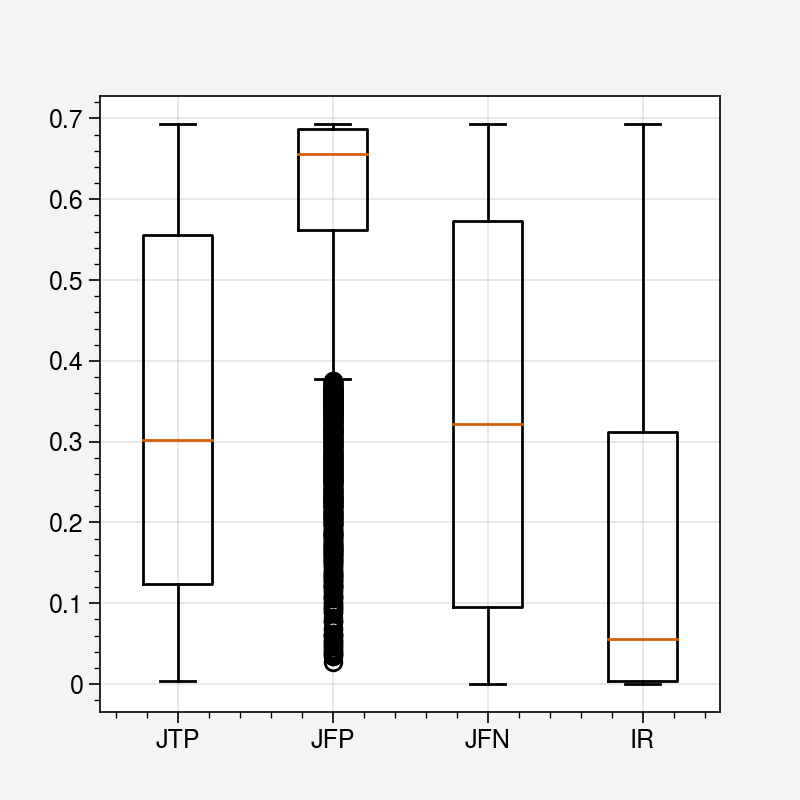

In [145]:
my_dict = {
    "JTP":torch.cat(JTP).tolist(),
    "JFP":torch.cat(JFP).tolist(),
    "JFN":torch.cat(JFN).tolist(),
    "IR":torch.cat(IR).tolist()
}

fig, ax = plt.subplots()
ax.boxplot(my_dict.values())
ax.set_xticklabels(my_dict.keys())

# plt.boxplot(JFP[0].tolist());
# plt.boxplot(JFN[0].tolist());
# plt.boxplot(IR[0].tolist());

In [153]:
JTP, JFP, JFN, IR = edge_deducted_pixelwise_metrics()

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 65/65 [00:17<00:00,  3.65it/s]


[Text(1, 0, 'JTP'), Text(2, 0, 'JFP'), Text(3, 0, 'JFN'), Text(4, 0, 'IR')]

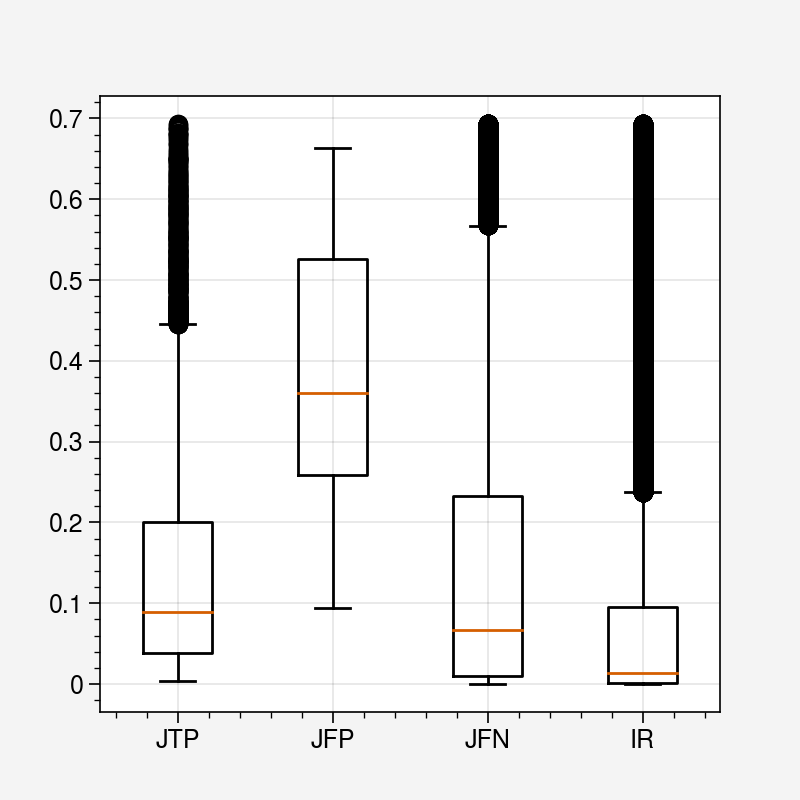

In [154]:
my_dict = {
    "JTP":torch.cat(JTP).tolist(),
    "JFP":torch.cat(JFP).tolist(),
    "JFN":torch.cat(JFN).tolist(),
    "IR":torch.cat(IR).tolist()
}

fig, ax = plt.subplots()
ax.boxplot(my_dict.values())
ax.set_xticklabels(my_dict.keys())

# plt.boxplot(JFP[0].tolist());
# plt.boxplot(JFN[0].tolist());
# plt.boxplot(IR[0].tolist());

### ensuring I have the data for all the plots that are currently in the MIUA paper!

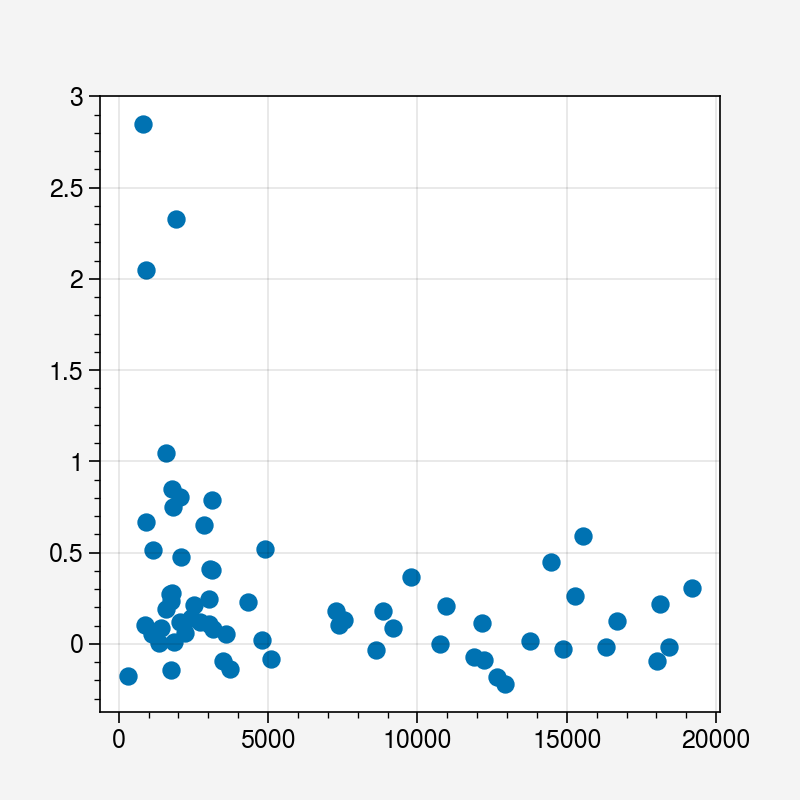

In [271]:
plt.scatter(mean_gt_vols, sample_vol_skew)

In [263]:
samples[0].cuda().argmax(dim=2).shape

torch.Size([30, 53, 240, 240])

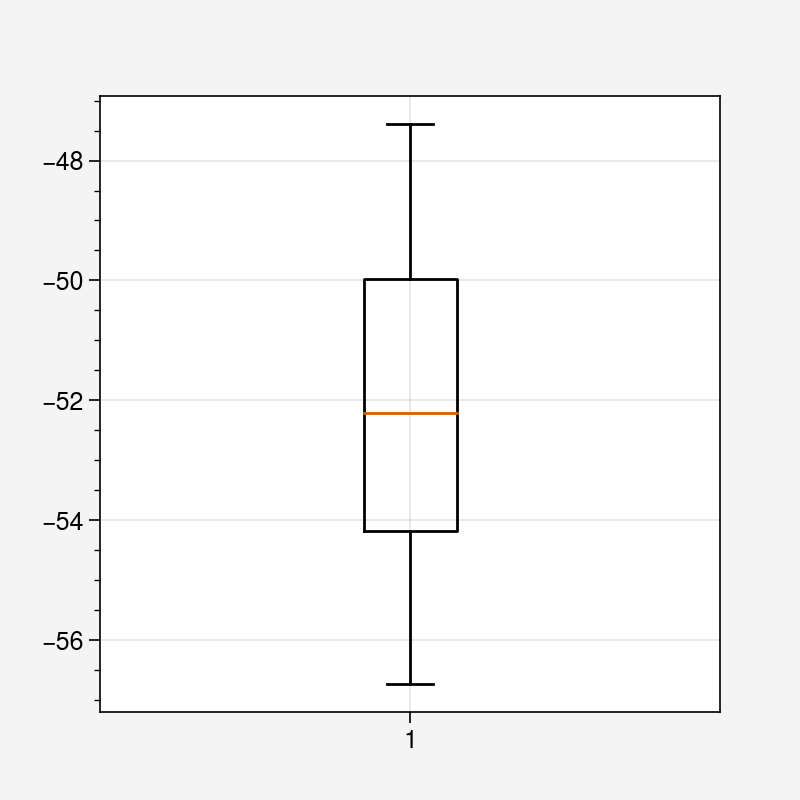

In [260]:
sorted_indices = torch.sort(torch.Tensor(mean_gt_vols))[1]
plt.boxplot(vds_rater1[sorted_indices[-20]]);

### RMBS over the image and in the IR areas

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 65/65 [00:03<00:00, 18.34it/s]


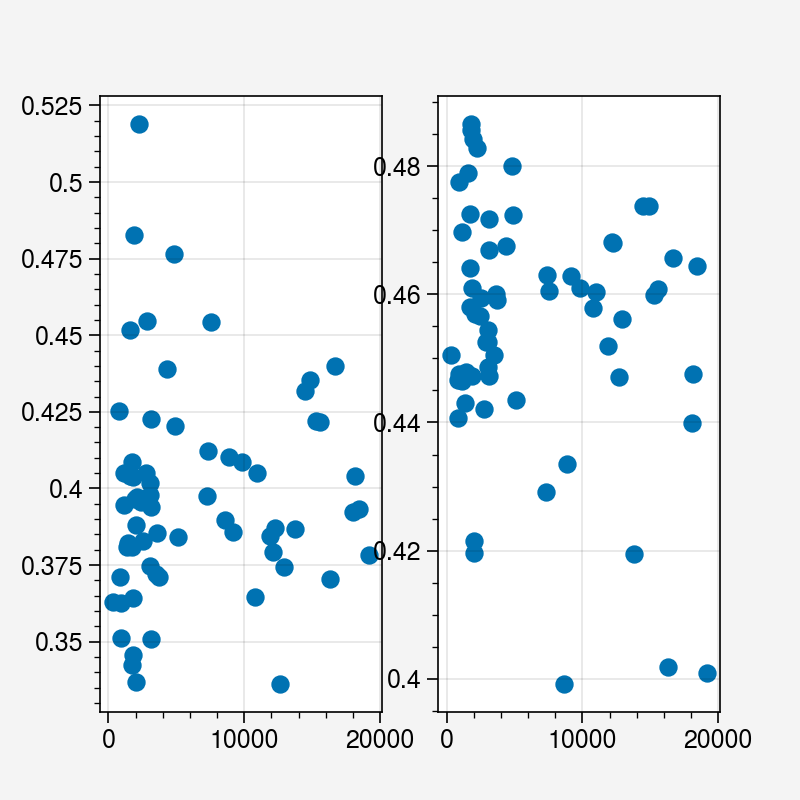

In [46]:
plt.subplot(1,2,1)
plt.scatter(mean_gt_vols, rmses)
plt.subplot(1,2,2)
plt.scatter(mean_gt_vols, IR_rmses)

### developing UIRO and JUEO

UIRO is the overlap between the uncertainty - actual errors and the area where the raters overlap
JUEO is the overlap between the uncertainty minus the IR disagreement areas and the areas where the model is wrong and both annotators agree



In [ ]:
raters = [rater0, rater1]
rater_results = [defaultdict(lambda : {}) for _ in range(len(raters))]

num_samples_list = [2, 3, 5, 7, 10, 15, 20, 25, 30]
num_samples = 30
print("NUM SAMPLES: ", num_samples)
args.eval_sample_num = num_samples

# load the predictions
print("GENERATING PREDICTIONS")
print(args.uncertainty_type)
means, samples, misc = get_means_and_samples(model_raw, rater0_ds, num_samples=num_samples, model_func=MODEL_OUTPUT_GENERATORS[args.uncertainty_type], args=args)

uncertainty_thresholds = torch.arange(0, 0.7, 0.01)
ent_maps = get_uncertainty_maps(means, samples, misc, args)

In [35]:
uiro_curves, jueo_curves = per_threshold_ueos()

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 65/65 [00:49<00:00,  1.31it/s]


In [36]:
import matplotlib.cm as cm 

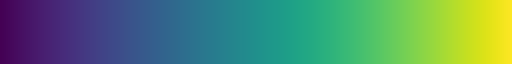

In [37]:
cm.viridis

In [38]:
max_vol = torch.Tensor(gt_vols)[:,0].max()
max_vol

tensor(18482.)

Text(0, 0.5, 'UIRO')

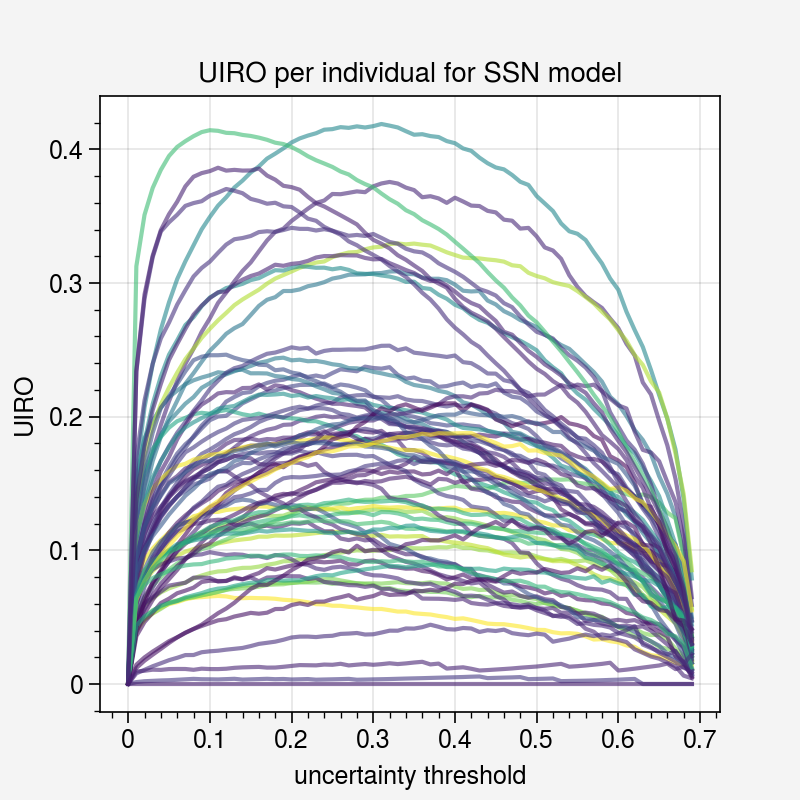

In [40]:
for i, curve in enumerate(uiro_curves):
    plt.plot(uncertainty_thresholds.numpy(), torch.Tensor(curve).numpy(), color=cm.viridis(mean_gt_vols[i] / 18482), alpha=0.6)
plt.title("UIRO per individual for SSN model")
plt.xlabel("uncertainty threshold")
plt.ylabel("UIRO")

In [41]:
list(cm.viridis(10))

[0.278791, 0.062145, 0.386592, 1.0]

In [42]:
torch.Tensor(uiro_curves).mean(dim=1)

tensor([0.2960, 0.1904, 0.1533, 0.1725, 0.0475, 0.0600, 0.0619, 0.1062, 0.0852,
        0.0935, 0.2477, 0.1731, 0.1899, 0.1266, 0.1522, 0.1176, 0.1545, 0.3412,
        0.1524, 0.0681, 0.2770, 0.1244, 0.0614, 0.1304, 0.1488, 0.0846, 0.1507,
        0.1449, 0.2491, 0.1716, 0.1066, 0.0878, 0.2704, 0.2027, 0.1498, 0.1657,
        0.1151, 0.1759, 0.0882, 0.1738, 0.1215, 0.1601, 0.1033, 0.1316, 0.1611,
        0.1678, 0.1401, 0.0702, 0.1312, 0.1623, 0.1009, 0.0032, 0.0000, 0.1515,
        0.0746, 0.1115, 0.0778, 0.0320, 0.0865, 0.3095, 0.2510, 0.0621, 0.2605,
        0.2789, 0.0127])

In [43]:
means[-13].argmax(dim=1).sum

<function Tensor.sum>

In [107]:
# rater_results

### best mean and samples results

In [321]:
mean_results = [
    {n_samples:
         {key: torch.Tensor(values).mean()
          for (key, values) in value_map.items() 
         }
     for (n_samples, value_map) in results_map.items()
    }
    for results_map in rater_results
]

In [322]:
num_samples = [2, 3, 5, 7, 10, 15, 20, 25, 30]

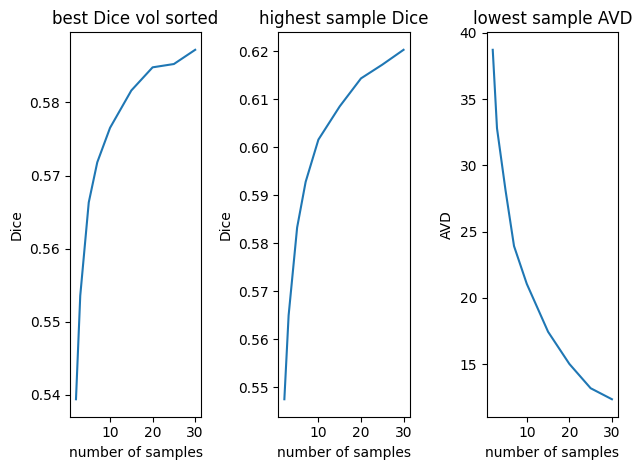

In [324]:
num_samples = [2, 3, 5, 7, 10, 15, 20, 25, 30]
plt.subplot(1, 3, 1)
plt.plot(num_samples, [mean_results[0][ns]['sample_top_dice'] for ns in num_samples])
plt.title("best Dice vol sorted")
plt.xlabel("number of samples")
plt.ylabel("Dice")
plt.subplot(1, 3, 2)
plt.plot(num_samples, [mean_results[0][ns][f'best_dice_dsorted_ss{ns}'] for ns in num_samples])
plt.title("highest sample Dice")
plt.ylabel("Dice")
plt.xlabel("number of samples")
plt.subplot(1, 3, 3)
plt.plot(num_samples, [mean_results[0][ns]['sample_best_avd'] for ns in num_samples])
plt.title("lowest sample AVD")
plt.ylabel("AVD")
plt.xlabel("number of samples")
plt.tight_layout()

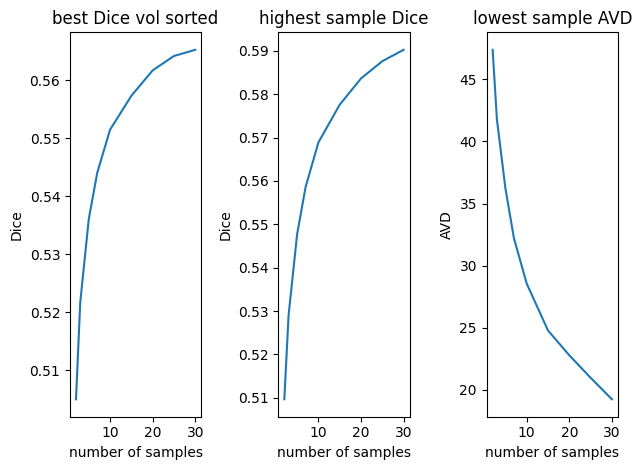

In [325]:
num_samples = [2, 3, 5, 7, 10, 15, 20, 25, 30]
plt.subplot(1, 3, 1)
plt.plot(num_samples, [mean_results[1][ns]['sample_top_dice'] for ns in num_samples])
plt.title("best Dice vol sorted")
plt.xlabel("number of samples")
plt.ylabel("Dice")
plt.subplot(1, 3, 2)
plt.plot(num_samples, [mean_results[1][ns][f'best_dice_dsorted_ss{ns}'] for ns in num_samples])
plt.title("highest sample Dice")
plt.ylabel("Dice")
plt.xlabel("number of samples")
plt.subplot(1, 3, 3)
plt.plot(num_samples, [mean_results[1][ns]['sample_best_avd'] for ns in num_samples])
plt.title("lowest sample AVD")
plt.ylabel("AVD")
plt.xlabel("number of samples")
plt.tight_layout()

In [336]:
mean_ged_results = {n_samples:
         {key: torch.Tensor(values).mean()
          for (key, values) in value_map.items() 
         }
     for (n_samples, value_map) in overall_results.items()
}


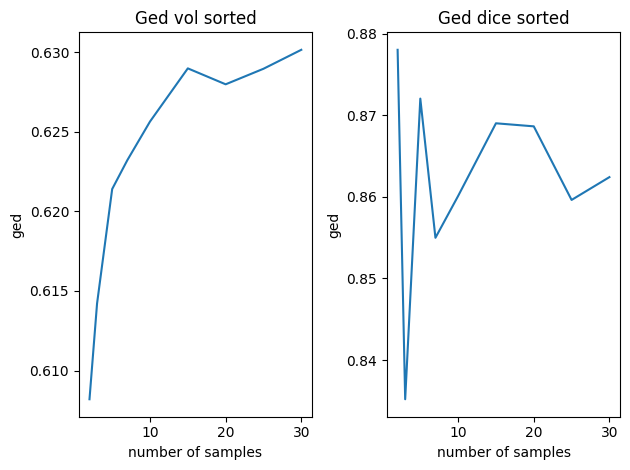

In [337]:
num_samples = [2, 3, 5, 7, 10, 15, 20, 25, 30]
plt.subplot(1, 2, 1)
plt.plot(num_samples, [mean_ged_results[ns]['GED_vol_sorted'] for ns in num_samples])
plt.title("Ged vol sorted")
plt.xlabel("number of samples")
plt.ylabel("ged")
plt.subplot(1, 2, 2)
plt.plot(num_samples, [mean_ged_results[ns][f'GED_dice_sorted'] for ns in num_samples])
plt.title("Ged dice sorted")
plt.ylabel("ged")
plt.xlabel("number of samples")
plt.tight_layout()

### note maria's comment

she states that the differences between raters are really around whether lesions should exist or not, whether they have been missed by the machine, not whether the boundary is correct. So we expect the UIRO to be low because there is likely a lot of boundary in this case.
So the question is, is that true, if we block out the boundary then what do we find? That would be an interesting question to ask I think. So we think that the result above is explainable and makes sense :)


Also note to self: think about using median and IQR due to the outliers in UIRO and JUEO when comparing methods.

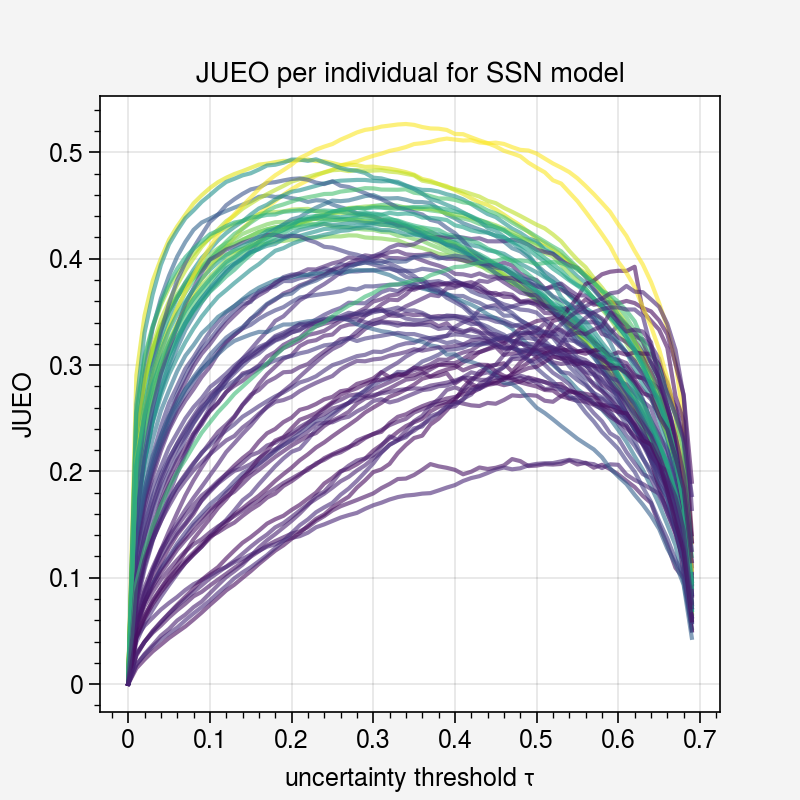

In [44]:
for i, curve in enumerate(jueo_curves):
    plt.plot(uncertainty_thresholds, curve, color=cm.viridis(gt_vols[i][0] / 18482), alpha=0.6)
    plt.title("JUEO per individual for SSN model")
    plt.xlabel(r"uncertainty threshold $\tau$")
    plt.ylabel("JUEO")

## other code

### Notes:

so we have found that there is a very large number of small connected components that have an IOU of 1. We can explore the uncertainty of these values, but we want to separate these from the group.
There is an important point to make for the paper that sometimes the raters agree, and it is due to the policy, and so we have maybe high uncertainty.
Sometimes, the highest overlap is with a connected component that is a 1000 times larger, so what do we do here? Well we say the IOU is very low.
We can split the IOU into low and high IOU.

I need to produce these plots for each of the three datasets

As we can see from the plots above, raters do not agree on edges of lesions for the MSS3 dataset due to the collection methodology.

### UIRO AND JUEO plots

Text(0, 0.5, 'UIRO')

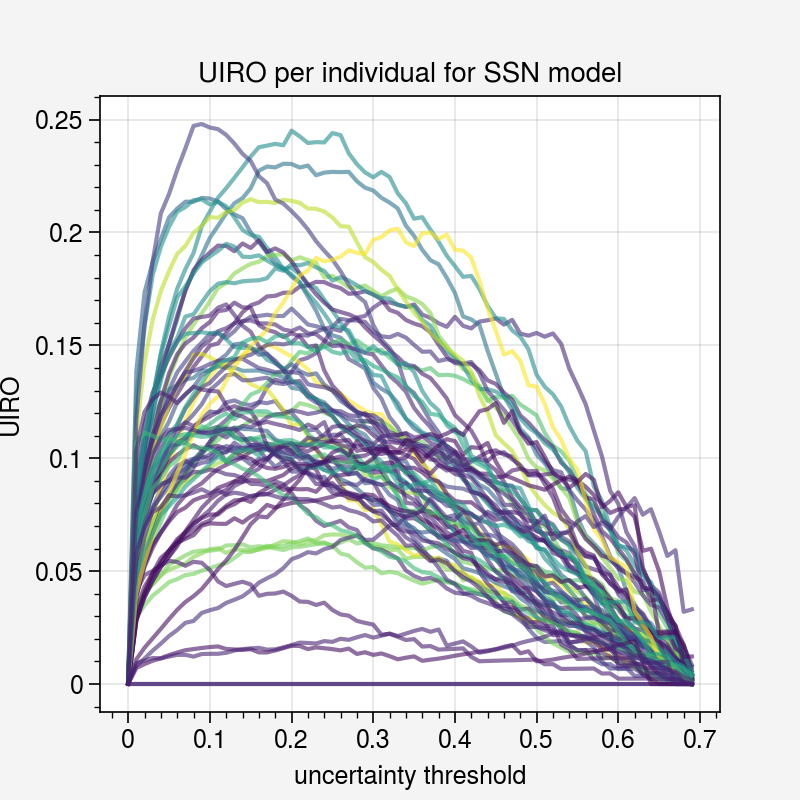

In [ ]:
for i, curve in enumerate(ed_uiro_curves):
    plt.plot(uncertainty_thresholds, curve, color=cm.viridis(gt_vols[i][0] / 18482), alpha=0.6)
plt.title("UIRO per individual for SSN model")
plt.xlabel("uncertainty threshold")
plt.ylabel("UIRO")

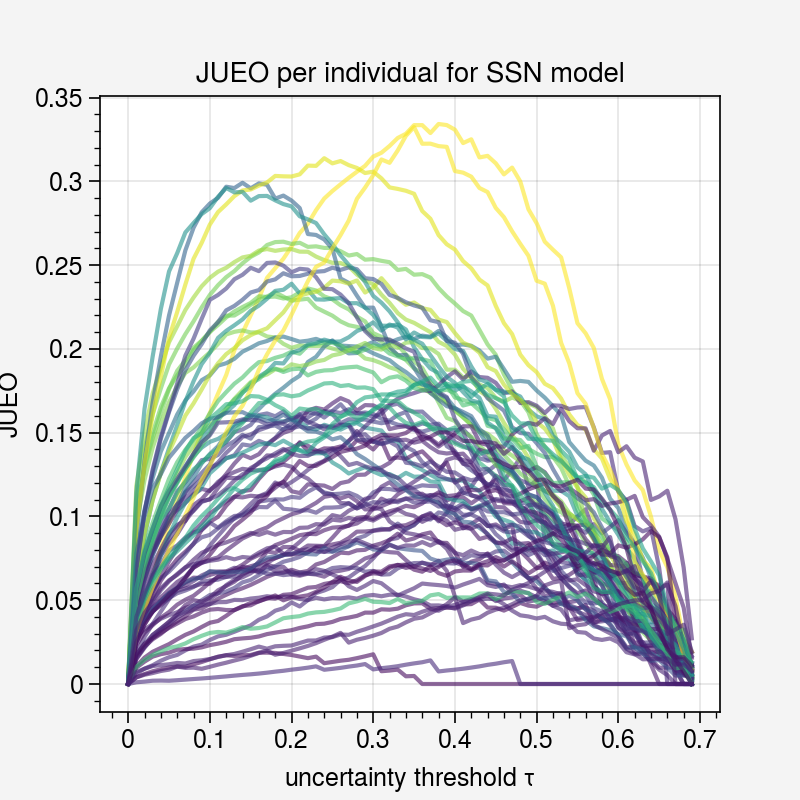

In [56]:
for i, curve in enumerate(ed_jueo_curves):
    plt.plot(uncertainty_thresholds, curve, color=cm.viridis(gt_vols[i][0] / 18482), alpha=0.6)
    plt.title("JUEO per individual for SSN model")
    plt.xlabel(r"uncertainty threshold $\tau$")
    plt.ylabel("JUEO")

### sUIRO and sJUEO (and sUIRO without the edges included if that proves useful)

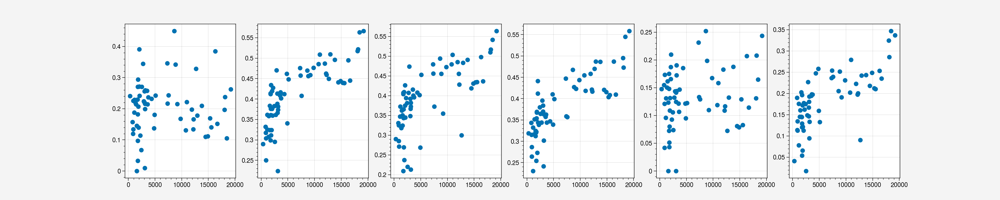

In [60]:
plt.figure(figsize=(20, 4))
plt.subplot(1, 6, 1)
plt.scatter(mean_gt_vols, sUIRO)
plt.subplot(1, 6, 2)
plt.scatter(mean_gt_vols, sJUEO)
plt.subplot(1, 6, 3)
plt.scatter(mean_gt_vols, sUEO_r1)
plt.subplot(1, 6, 4)
plt.scatter(mean_gt_vols, sUEO_r2)
plt.subplot(1, 6, 5)
plt.scatter(mean_gt_vols, s_ed_UIRO)
plt.subplot(1, 6, 6)
plt.scatter(mean_gt_vols, s_ed_JUEO)

### Connected component analysis

- [ ] look at each connected component that only exists for one rater and check the proportion that are entirely uncertain as the uncertainty threshold increases
- [ ] similar to the above but look at the average proportion of certainty
- [ ] look at the proportion of connected components that exist as the uncertainty threshold increases that are not in any of the segmentations.
- [ ] find visual examples of connected components that are cert
- comment on the fact that since the models were only trained with a single segmentation, we cannot expect the models to capture the kind of variability that we see, even when well calibrated.
- multiple annotations are nesseary, or a model that can encorperate different styles at test time.

calibration of region around missed lesions? (per lesion calibration?)
proportion of a missed lesion that is uncertain like I have done before
proportion of incorrectly added lesions that are wholly uncertain / partially uncertain

(0.0, 100.0)

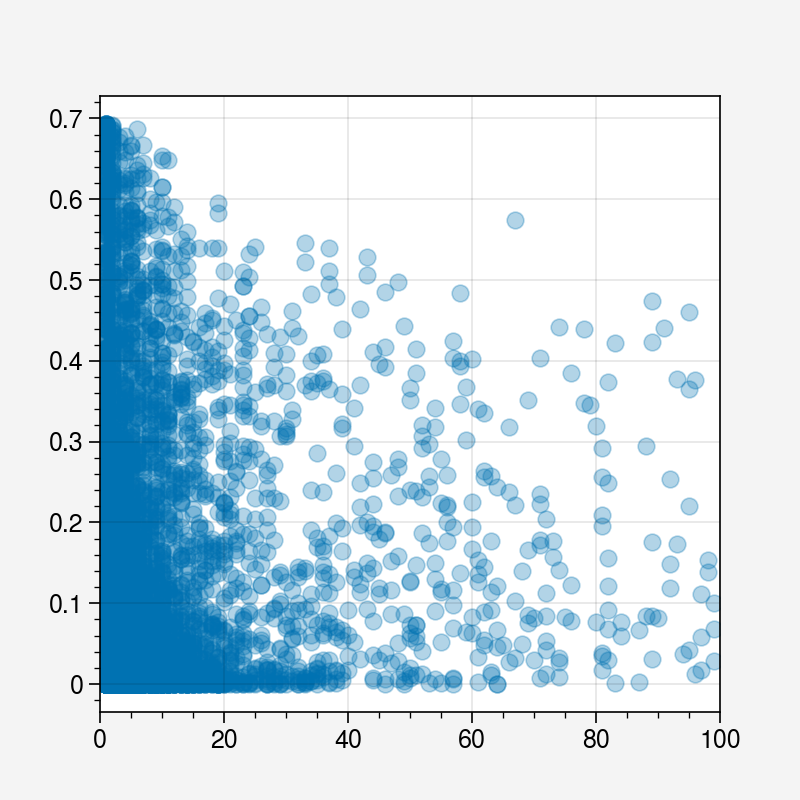

In [228]:
plt.scatter(torch.cat([torch.Tensor(t) for t in ind_sizes]), torch.cat([torch.Tensor(t) for t in ind_mean_uncert]), alpha=0.3)
# plt.xscale('log')
plt.xlim(0, 100)

In [197]:
len(ind_entirely_uncert)

65

In [198]:
len([torch.Tensor(t).mean() for t in ind_entirely_uncert[0]])

70

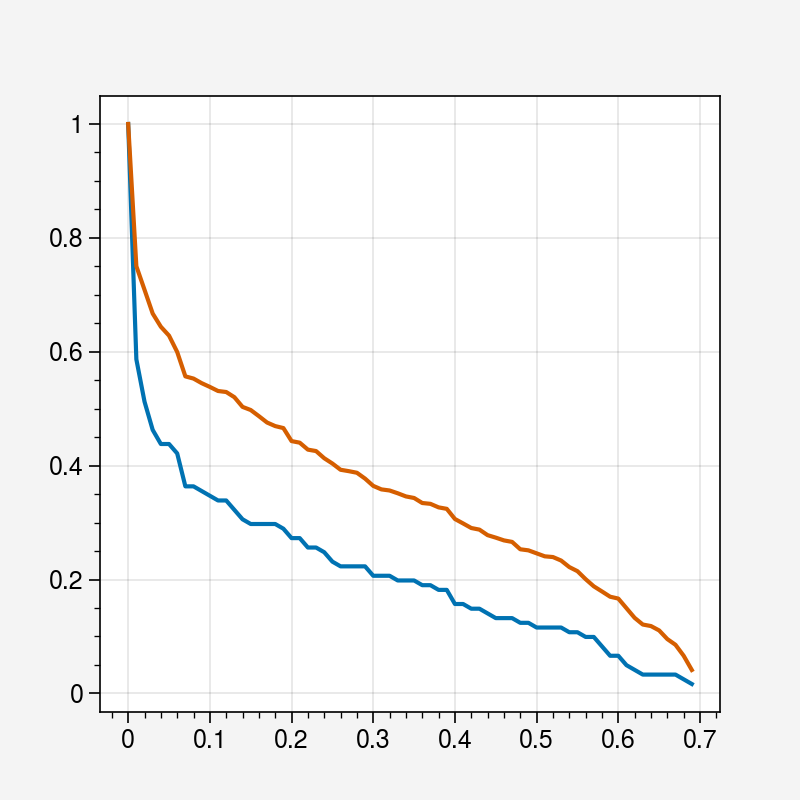

In [201]:
# for individual 0
plt.plot(uncertainty_thresholds, [torch.Tensor(t).mean() for t in ind_entirely_uncert[0]])
plt.plot(uncertainty_thresholds, [torch.Tensor(t).mean() for t in ind_proportion_uncertain[0]])

In [212]:
torch.Tensor([[torch.Tensor(t).mean() for t in ind_entirely_uncert[ind]] for ind in range(len(means))]).mean(dim=0).shape

torch.Size([70])

In [230]:
torch.Tensor([[torch.Tensor(t).mean() for t in ind_entirely_uncert[ind]] for ind in range(len(ind_entirely_uncert))]).mean(dim=0)


tensor([1.0000, 0.4137, 0.3394, 0.2872, 0.2508, 0.2313, 0.2093, 0.1948, 0.1801,
        0.1704, 0.1610, 0.1480, 0.1417, 0.1353, 0.1266, 0.1218, 0.1172, 0.1125,
        0.1081, 0.1022, 0.0982, 0.0958, 0.0922, 0.0896, 0.0868, 0.0829, 0.0811,
        0.0785, 0.0758, 0.0729, 0.0695, 0.0677, 0.0655, 0.0634, 0.0618, 0.0595,
        0.0543, 0.0519, 0.0497, 0.0471, 0.0446, 0.0428, 0.0400, 0.0392, 0.0380,
        0.0368, 0.0347, 0.0337, 0.0305, 0.0297, 0.0282, 0.0272, 0.0265, 0.0257,
        0.0239, 0.0227, 0.0217, 0.0201, 0.0180, 0.0162, 0.0155, 0.0141, 0.0124,
        0.0117, 0.0102, 0.0094, 0.0076, 0.0066, 0.0041, 0.0018])

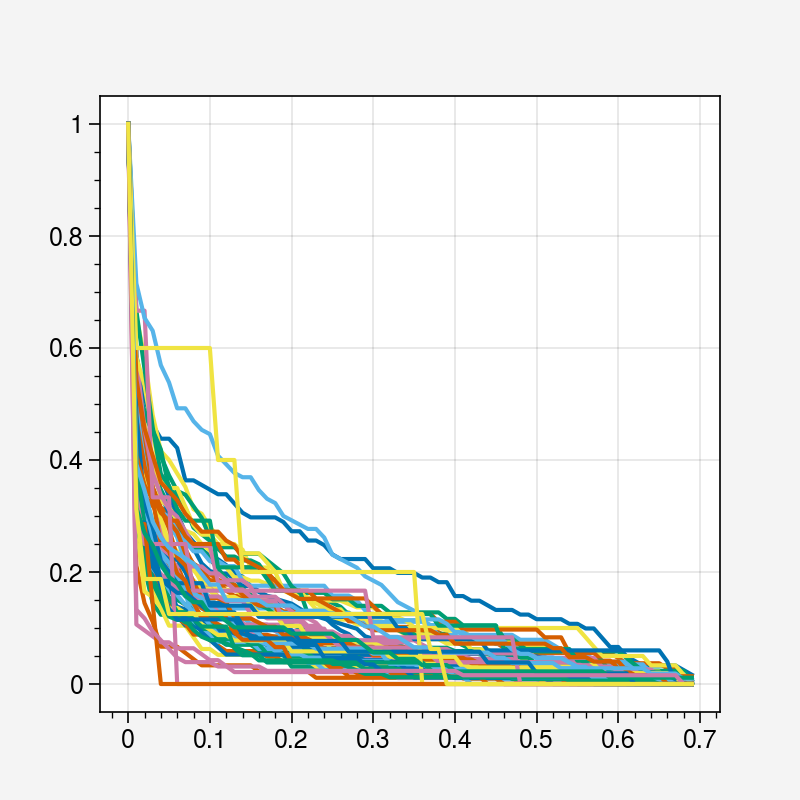

In [222]:
# for all individuals
for ind in range(len(means)):
    plt.plot(uncertainty_thresholds, [torch.Tensor(t).mean() for t in ind_entirely_uncert[ind]])

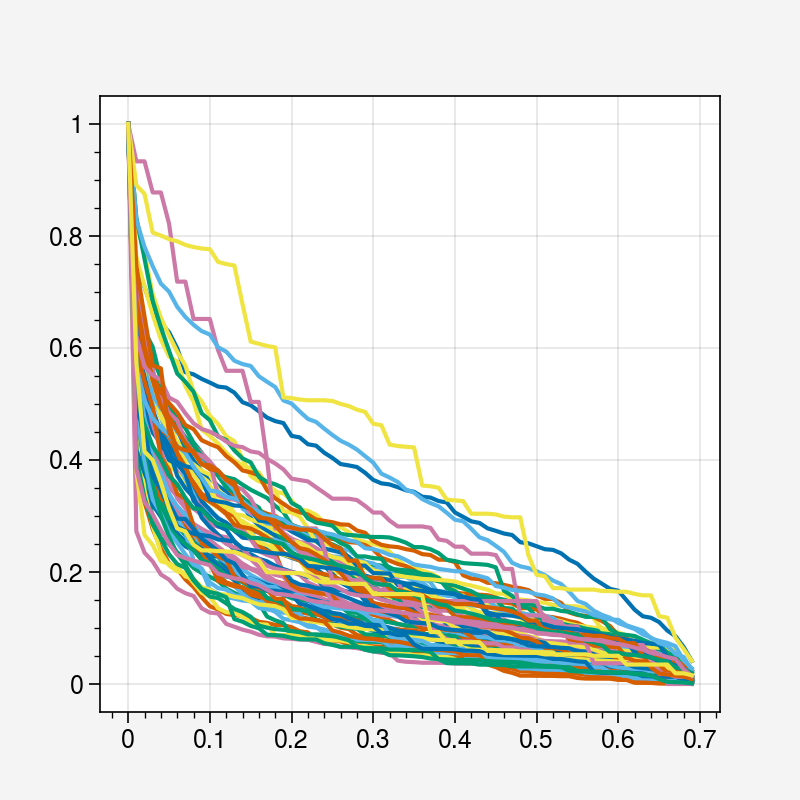

In [223]:
for ind in range(len(means)):
    plt.plot(uncertainty_thresholds, [torch.Tensor(t).mean() for t in ind_proportion_uncertain[ind]])

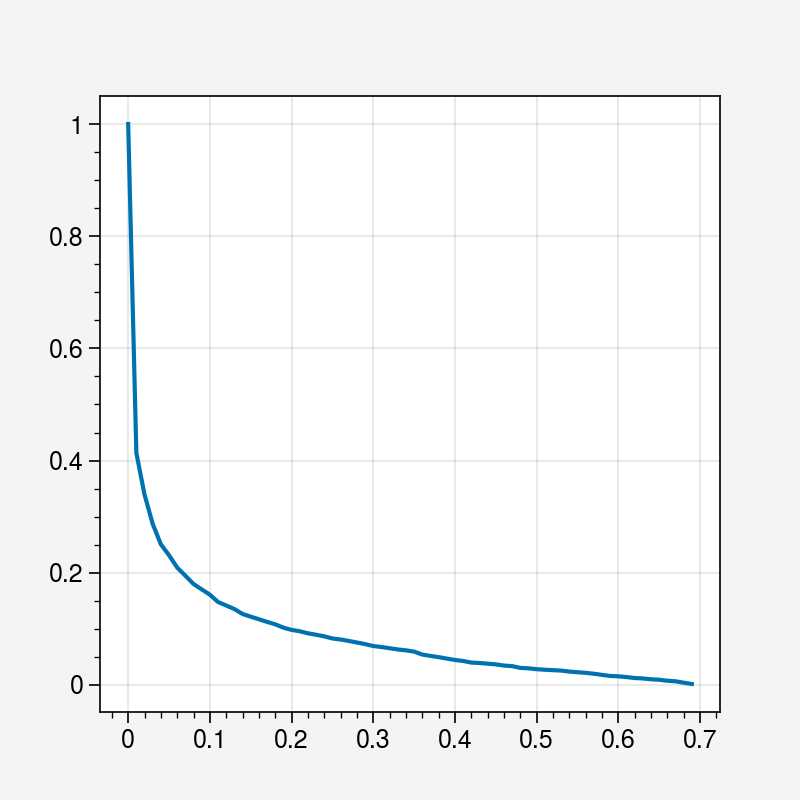

In [231]:
plt.plot(uncertainty_thresholds, torch.Tensor([[torch.Tensor(t).mean() for t in ind_entirely_uncert[ind]] for ind in range(len(ind_entirely_uncert))]).mean(dim=0))

In [ ]:
# number of connected components in 

for i in tqdm(range(len(means))):
    pred = means[i].cuda().argmax(dim=1)
    e = ent_maps[i].cuda()
    y0 = rater0[i]
    y1 = rater1[i]
    
    disagreement = (y0 != y1)
    
    ccs = cc3d.connected_components(disagreement.type(torch.int32).numpy(), connectivity=26) # 26-connected
    ccs = torch.from_numpy(ccs.astype(np.float32)).cuda()
    
    if len(ccs.unique()) == 1:
        continue
    
    entirely_uncertain = [[] for _ in range(len(uncertainty_thresholds))]
    proportion_uncertain = [[] for _ in range(len(uncertainty_thresholds))]
    mean_uncert = []
    sizes = []
    
    for cc_id in ccs.unique():
        if cc_id == 0:
            continue
        cc = ccs == cc_id
        size = cc.sum().item()
        sizes.append(size)
        mean_uncert.append(e[cc].mean().item())
        
        for j, t in enumerate(uncertainty_thresholds):
            et = e > t
            uncert_cc_sum = (cc * et).sum().item()
            proportion_uncertain[j].append(uncert_cc_sum / size)
            entirely_uncertain[j].append(uncert_cc_sum == size)
    
    ind_entirely_uncert.append(entirely_uncertain)
    ind_proportion_uncertain.append(proportion_uncertain)
    ind_mean_uncert.append(mean_uncert)
    ind_sizes.append(sizes)

In [197]:
idx = 2
t = 0.4
UIRO(means[idx].argmax(dim=1), ent_maps[idx] > t, rater0[idx], rater1[idx])

0.19014693796634674

In [203]:
JUEO(means[idx].argmax(dim=1), ent_maps[idx] > t, rater0[idx], rater1[idx])

0.37308868765830994

In [199]:
per_rater_UEO(means[idx].argmax(dim=1), ent_maps[idx] > t, rater0[idx], rater1[idx])

(0.36519747972488403, 0.3323558270931244)

In [153]:
means[0].shape

torch.Size([53, 2, 240, 240])

### things to compute

- [ ] developing pixel wise RMBS for the predictions, where disagreements have probability 0.5
- [ ] developing pixelwise RMBS for the inter-rater disagreement sections (p would be 0.5 for all of them) 
- [ ] and uncertainty distributions (so JTP, JFP, JTP, IR)
- [ ] GeD for multiple raters
- [ ] the plots that I computed that I put in this paper for the in-house dataset for all these datasets. (so see what happens as the number of samples increases).
- [ ] get an extension for MC-Dropout trained (6 models, same parameters, different layer combinations, along with higher dropout ratio? see what happens
- [ ] do analysis on connected components that are fully uncertain. Check the proportion of missed lesions that are fully uncertain
- [ ] do analysis where we remove uncertainty around edges?
- [ ] try soft joint uncertainty error overlap per component.



### examining outlier individuals

In [261]:
### low volume very high percentage volume difference
idxs = []
for idx, (_, _, ind) in tqdm(enumerate(mss3_ds)):
    if ind in ['MSS3_ED_009_V1', 'MSS3_ED_036_V1']:
        idxs.append(idx)
        
idxs

68it [00:06,  9.89it/s]


[16, 44]

In [292]:
### low dice
idxs = []
for idx, (_, _, ind) in tqdm(enumerate(mss3_ds)):
    if ind in ['MSS3_ED_001_V1', 'MSS3_ED_007_V1', 'MSS3_ED_009_V1',
       'MSS3_ED_012_V1', 'MSS3_ED_014_V1', 'MSS3_ED_016_V1',
       'MSS3_ED_018_V1', 'MSS3_ED_023_V1', 'MSS3_ED_024_V1',
       'MSS3_ED_027_V1', 'MSS3_ED_036_V1', 'MSS3_ED_039_V1',
       'MSS3_ED_073_V1', 'MSS3_ED_075_V1', 'MSS3_ED_078_V1',
       'MSS3_ED_079_V1']:
        idxs.append(idx)
        
idxs

68it [00:09,  7.33it/s]


[0, 14, 16, 19, 21, 23, 26, 31, 32, 35, 44, 47, 59, 60, 62, 63]

In [241]:
### low dice given volume
idxs = []
for idx, (_, _, ind) in tqdm(enumerate(mss3_ds)):
    if ind in ['MSS3_ED_016_V1', 'MSS3_ED_073_V1', 'MSS3_ED_078_V1']:
        idxs.append(idx)
        
idxs

68it [00:07,  8.69it/s]


[23, 59, 62]

In [242]:
### high dice given volume
idxs = []
for idx, (_, _, ind) in tqdm(enumerate(mss3_ds)):
    if ind in ['MSS3_ED_043_V1', 'MSS3_ED_044_V1', 'MSS3_ED_070_V1',
       'MSS3_ED_071_V1', 'MSS3_ED_077_V1', 'MSS3_ED_080_V1']:
        idxs.append(idx)
        
idxs

68it [00:06,  9.89it/s]


[51, 52, 57, 58, 61, 64]

In [253]:
import matplotlib.pyplot as plt

In [274]:
def cycle_through_images(idx):
    xs, ys, ind = mss3_ds[idx]
    for i in range(len(xs['FLAIR'])):
        if ys['wmhes'][i].sum() == 0 and ys['wmhmvh'][i].sum() == 0:
            continue
        plt.figure(figsize=(8, 4))
        plt.subplot(1,3,1)
        plt.imshow(xs['FLAIR'][i]); plt.axis('off')
        plt.subplot(1,3,2)
        plt.imshow(ys['wmhes'][i]); plt.axis('off')
        plt.subplot(1,3,3)
        plt.imshow(ys['wmhmvh'][i]); plt.axis('off')
        plt.show()
        v = input()
        if v == "end":
            break

interesting ids to look at for the MSS3 dataset

below 0.6
[16, 23, 44, 59, 60, 62, 63]

the rest that are below 0.7
[0, 14, 19, 21, 26, 31, 32, 35, 47]

### things that I have noticed

inter rater differences are often bigger during the earlier slices of the brain (e.g see 21)

lacunes can cause problems (e.g see 0)

other big non lacunar stroke? see 31. It will be interesting to see how this plays with interrater overlap.

32 is an intersting example in the latter slices....

some segmentations look very different.

for some it is down to artefact areas

In [303]:
[mss3_ds[idx][-1] for idx in [59, 60, 62, 63]]

['MSS3_ED_073_V1', 'MSS3_ED_075_V1', 'MSS3_ED_078_V1', 'MSS3_ED_079_V1']

In [ ]:
# bad ( flipped ) ones: 59, 60, 62, 63

In [304]:
#cycle_through_images(47)

In [305]:
#cycle_through_images(16)

In [306]:
#cycle_through_images(44)

In [307]:
### the images for this one are clearly flipped, I need to remove it from maria's analysis.
# however, the volumes are nonetheless not an exact match.
#cycle_through_images(59)

In [308]:
### again these appear to be flipped.
#cycle_through_images(62)

In [309]:
### again these appear to be flipped.
#cycle_through_images(23)